In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt
import sys 

NFF_PATH = '/home/wwj/Repo/playgrounds/NeuralForceField/'
ODE_PATH = '/home/wwj/Repo/projects/torchdiffeq/'

sys.path.insert(0, NFF_PATH)
sys.path.insert(0, ODE_PATH)
sys.path.insert(0, '../..')

import torch
from torch.optim import Adam
from torchdiffeq import odeint_adjoint as odeint
from torchmd.ode import ODE, NHCHAIN_ODE
from torchmd.observable import rdf
from torchmd.hamiltoinians import PairPot, MLP, LennardJones, Buck, LennardJones69
from torchmd.utils import *

from nff.utils.scatter import compute_grad
from nff.nn.layers import GaussianSmearing
from ase import Atoms

import ase
from ase.neighborlist import neighbor_list
from ase.lattice.cubic import FaceCenteredCubic
from ase.geometry import wrap_positions

from ase.md.velocitydistribution import MaxwellBoltzmannDistribution
from ase import units

from datetime import datetime
from torchmd.io import Stack, schwrap


_ColormakerRegistry()

In [2]:
from nff.data import Dataset, split_train_validation_test, collate_dicts, to_tensor
from nff.train import Trainer, get_trainer, get_model, load_model, loss, hooks, metrics, evaluate
from nff.utils import batch_to

In [353]:
import torch
from nff.utils.scatter import compute_grad
from nff.utils import batch_to
from torch.nn import ModuleDict


class schwrap(torch.nn.Module):
    def __init__(self, model, batch, cell, device, cutoff = 5.0):
        super().__init__()
        self.model = model 
        self.cutoff = cutoff
        self.batch = batch_to(batch, device)
        self.cell = torch.Tensor(cell).to(device)
        self.device = model.device 
        
    def generate_nbr_list(self, xyz, cutoff=5.0):
        dis_mat = xyz[..., None, :, :] - xyz[..., :, None, :]
        offsets = -dis_mat.ge(0.5 *  self.cell).to(torch.float).to(self.device) + \
                        dis_mat.lt(-0.5 *  self.cell).to(torch.float).to(self.device)
        dis_mat = dis_mat + offsets * self.cell
        dis_sq = dis_mat.pow(2).sum(-1)
        mask = (dis_sq < self.cutoff ** 2) & (dis_sq != 0)
        nbr_list = torch.triu(mask.to(torch.long)).nonzero()
        return nbr_list
        
    def forward(self, q):   
        xyz = q.reshape(-1, 3)
        self.batch['nbr_list'] = self.generate_nbr_list(xyz).to(self.model.device)
        results = self.model(self.batch, xyz)
        return results['energy']
    
class Stack(torch.nn.Module):
    def __init__(self, model_dict, mode='sum'):
        super().__init__()
        self.models = ModuleDict(model_dict)
        
    def forward(self, x):
        for i, key in enumerate(self.models.keys()):
            if i == 0:
                result = self.models[key](x).reshape(-1)
            else:
                new_result = self.models[key](x)
                result += new_result.sum().reshape(-1)
        
        return result
    
class LennardJones(torch.nn.Module):
    def __init__(self, sigma=1.0, epsilon=1.0):
        super(LennardJones, self).__init__()
        self.sigma = torch.nn.Parameter(torch.Tensor([sigma]))
        self.epsilon = torch.nn.Parameter(torch.Tensor([epsilon]))

    def LJ(self, r, sigma, epsilon):
        return 4 * epsilon * ((sigma/r)**12 )

    def forward(self, x):
        return self.LJ(x, self.sigma, self.epsilon)

In [355]:
DEVICE = 1
CUTOFF = 3.0
size = 4

L = (4/0.844)**(1/3)

atoms = FaceCenteredCubic(directions=[[1, 0, 0], [0, 1, 0], [0, 0, 1]],
                          symbol='H',
                          size=(size, size, size),
                          latticeconstant= L,
                          pbc=True)
#NATOMS = atoms.get_number_of_atoms()
N = atoms.get_number_of_atoms()

mass = atoms.get_masses()

In [356]:
# construct graphs 

edge_from, edge_to, offsets = neighbor_list('ijS', atoms, 3.0)

nbr_list = torch.LongTensor(np.stack([edge_from, edge_to], axis=1))
offsets = torch.Tensor(offsets)[nbr_list[:, 1] > nbr_list[:, 0]].detach().cpu().numpy()
nbr_list = nbr_list[nbr_list[:, 1] > nbr_list[:, 0]]

In [357]:
# contruct NN model 

# generate input for NFF 
from nff.io import AtomsBatch

atoms = AtomsBatch(atoms)
batch = {'nxyz': torch.Tensor(atoms.get_nxyz()), 
         'nrb_list': nbr_list, 
         'num_atoms': torch.LongTensor([atoms.get_number_of_atoms()]),
         'energy': torch.Tensor([0.]) }

In [358]:
np.diag( atoms.get_cell() )

array([6.7189154, 6.7189154, 6.7189154])

In [359]:
# Define prior potential 
lj_params = {'epsilon': 0.5, 
             'sigma': 0.5}

pair = PairPot(LennardJones, lj_params,
                cell=torch.Tensor(atoms.get_cell()).diag(), 
                device=DEVICE,
                cutoff=CUTOFF,
                ).to(DEVICE)

In [360]:
# make model with gaussian chain 
# zero ration and tranlation momentum
params = {
    'n_atom_basis': 64,
    'n_filters': 32,
    'n_gaussians': 32,
    'n_convolutions': 1,
    'cutoff': 3.0,
    'trainable_gauss': True
}

model = get_model(params)
batch = batch_to(batch, DEVICE)
wrap = schwrap(model=model, batch=batch, device=DEVICE, cell=np.diag(atoms.get_cell())) 

model_dict = {'gcn': wrap,
             'prior': pair}

stack = Stack(model_dict)

In [368]:
T= 1.8

# declare position and momentum as initial values
xyz = torch.Tensor(atoms.get_positions())
xyz = xyz.reshape(-1)

# generate random velocity 
MaxwellBoltzmannDistribution(atoms, T)

p = torch.Tensor( atoms.get_velocities().reshape(-1)) #.to(DEVICE)
p_v = torch.Tensor([0.0] * 5)
pq = torch.cat((p, xyz, p_v)).to(DEVICE)
pq.requires_grad= True


# define the equation of motion to propagate 
#f_x = ODE(model, mass= mass, device=DEVICE, dim=3).to(DEVICE)

f_x = NHCHAIN_ODE(stack, 
        mass, 
        Q=10.0, 
        T=T,
        num_chains=5, 
        device=DEVICE).to(DEVICE)

In [369]:
obs = rdf(atoms, 50, DEVICE, 3.3)
# Target data
traj = mdtraj.load_pdb("./metadta/LJ_1.pdb") 
q = torch.Tensor(traj.xyz[500:]).to(DEVICE) * 10.0
bins, g_obs = obs(q)


In [370]:
pmf_obs = -torch.log( g_obs )
pmf = -torch.log( g)

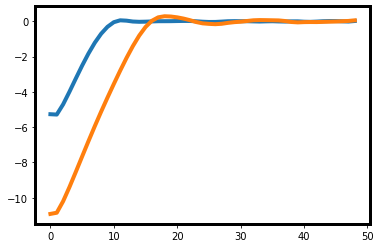

In [371]:
plt.plot( (pmf[1:] - pmf[:-1]).detach().cpu().numpy())
plt.plot( (pmf_obs[1:] - pmf_obs[:-1]).detach().cpu().numpy()) 

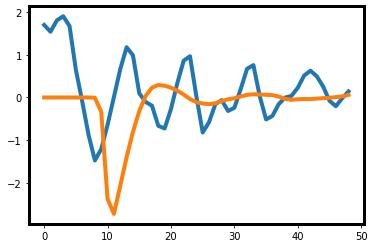

In [372]:
plt.plot( f.detach().cpu().numpy() )
plt.plot( f_obs.detach().cpu().numpy() )

In [373]:
(f - f_obs).pow(2).mean()

tensor(1.1173, device='cuda:1', grad_fn=<MeanBackward0>)

In [374]:
(pmf_obs - pmf).pow(2).mean()

tensor(318.1747, device='cuda:1', grad_fn=<MeanBackward0>)

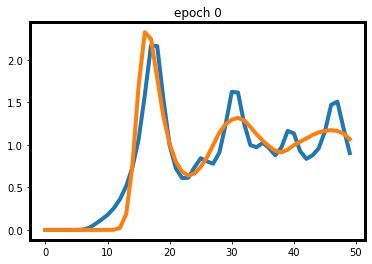

1.1104252338409424
1.979985 seconds


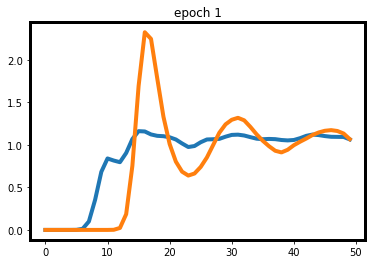

4.009747505187988
1.895648 seconds


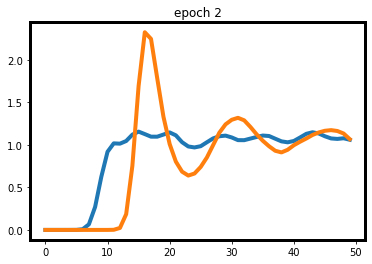

4.7043070793151855
1.924566 seconds


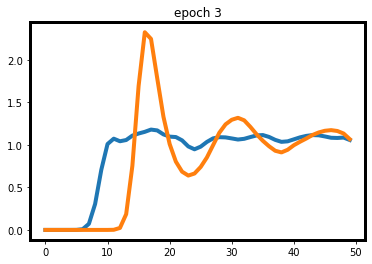

4.858786106109619
1.818179 seconds


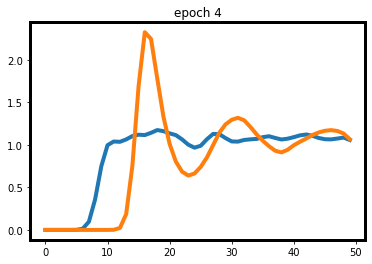

5.028655529022217
1.801891 seconds


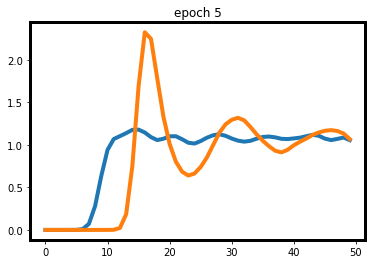

5.13702917098999
1.933747 seconds


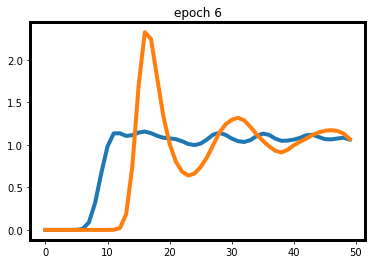

5.178614139556885
1.914108 seconds


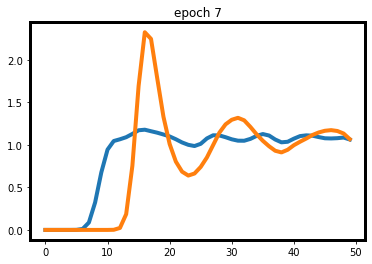

4.830821990966797
1.860528 seconds


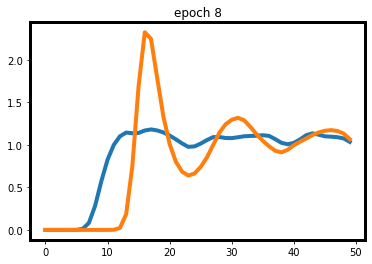

4.5620880126953125
1.811565 seconds


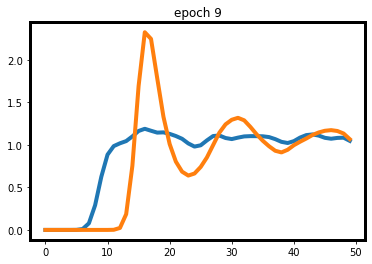

4.494385242462158
1.882923 seconds


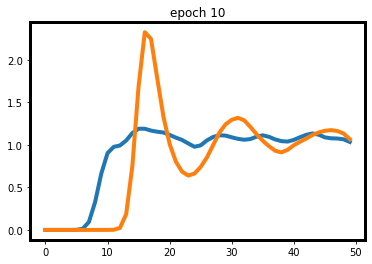

4.52877140045166
1.822012 seconds


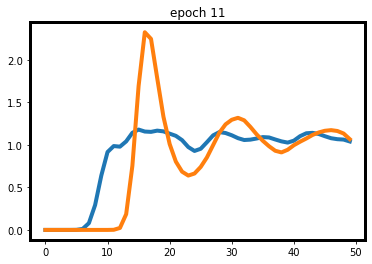

4.482623100280762
1.87034 seconds


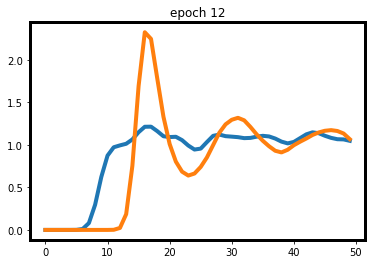

4.290613651275635
1.912891 seconds


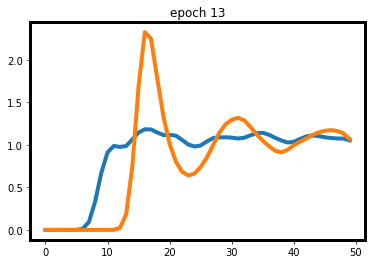

4.476763725280762
1.832425 seconds


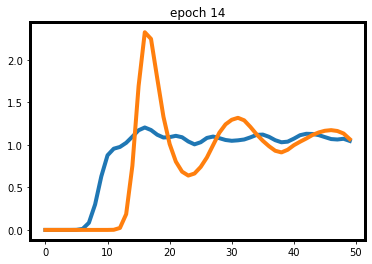

4.46082878112793
1.903613 seconds


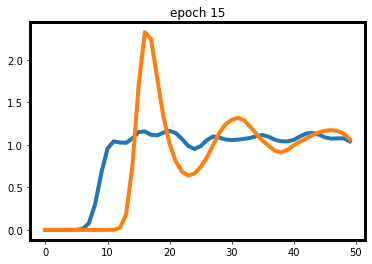

4.785574436187744
1.94122 seconds


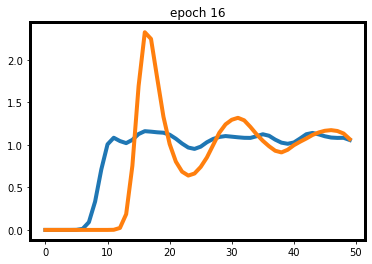

4.829982280731201
1.870698 seconds


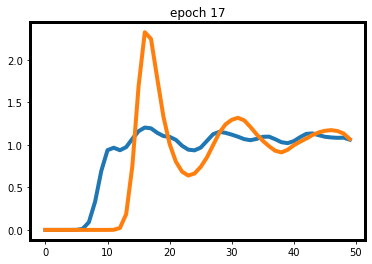

4.320178985595703
1.847275 seconds


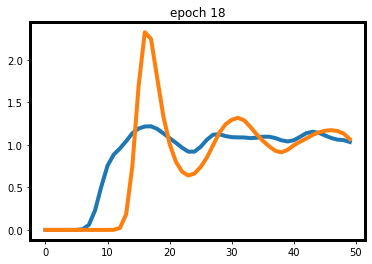

3.85310435295105
1.891197 seconds


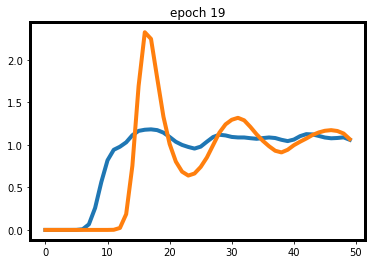

4.1517462730407715
1.915771 seconds


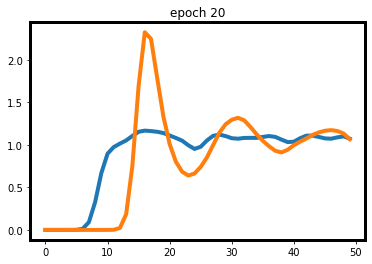

4.5548505783081055
1.863233 seconds


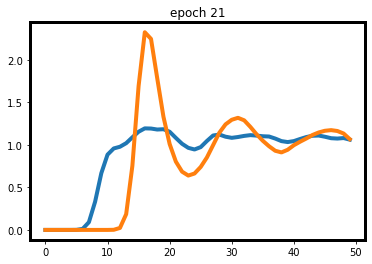

4.331027030944824
1.846435 seconds


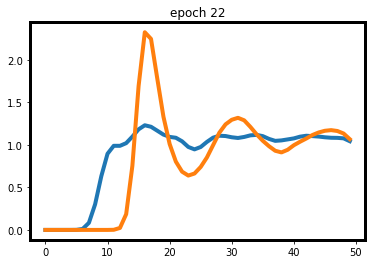

4.309179782867432
1.918499 seconds


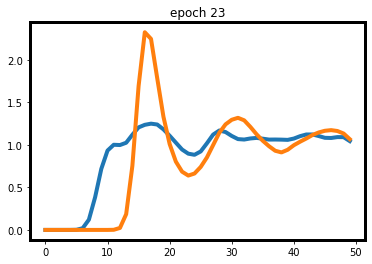

4.3382134437561035
1.858858 seconds


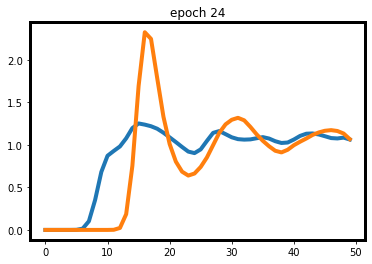

4.256214141845703
1.963737 seconds


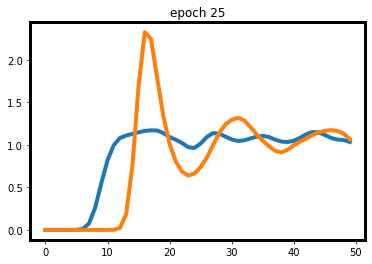

4.508182048797607
1.849757 seconds


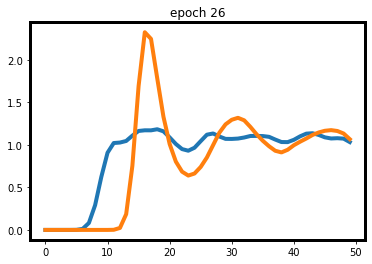

4.504743576049805
1.897962 seconds


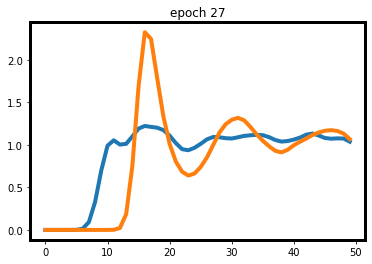

4.532131195068359
1.873663 seconds


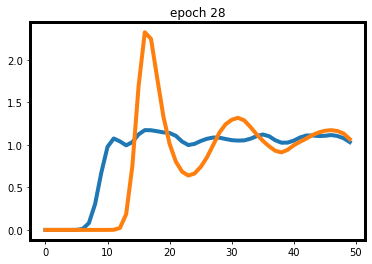

4.769576549530029
1.882107 seconds


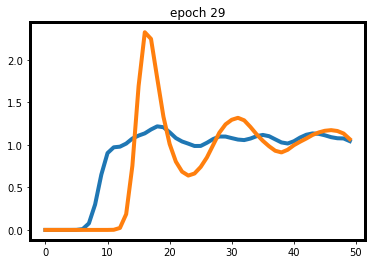

4.444934368133545
1.956419 seconds


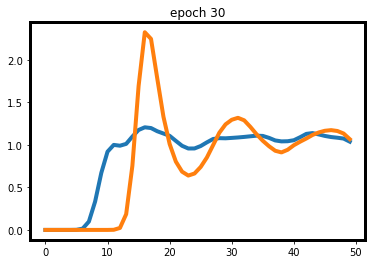

4.408102035522461
1.876444 seconds


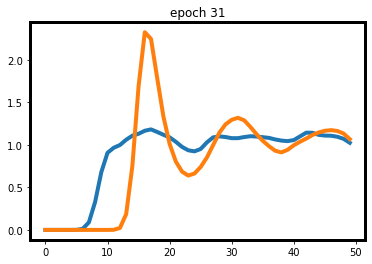

4.467984199523926
1.808482 seconds


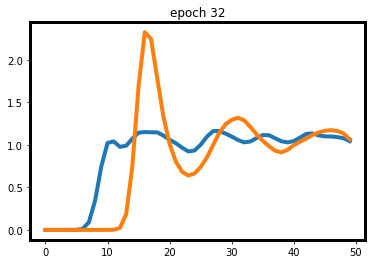

4.751862525939941
1.914907 seconds


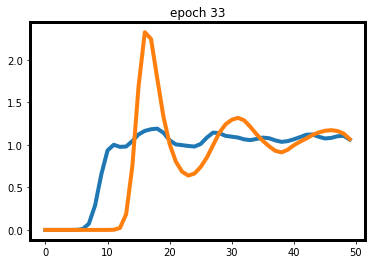

4.4170637130737305
1.835672 seconds


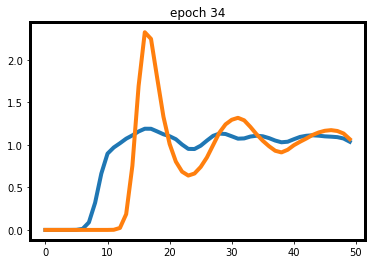

4.466796875
1.900691 seconds


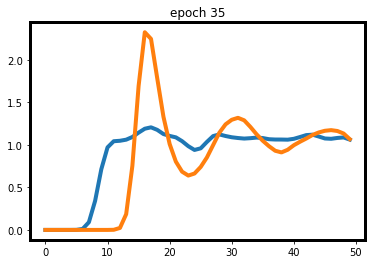

4.7313232421875
1.79717 seconds


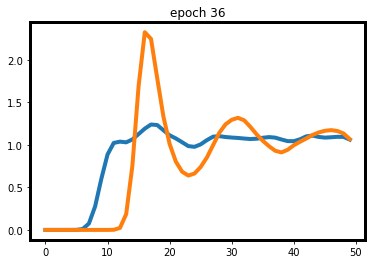

4.386077880859375
1.871426 seconds


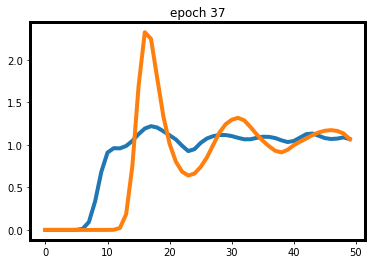

4.301986217498779
1.90578 seconds


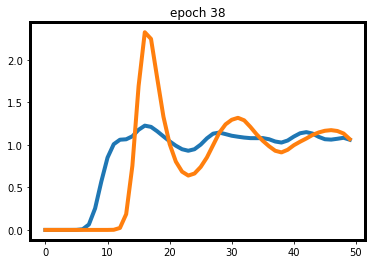

4.30058479309082
1.778835 seconds


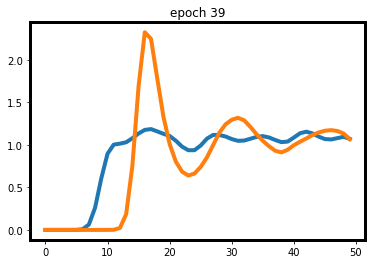

4.419256210327148
1.864243 seconds


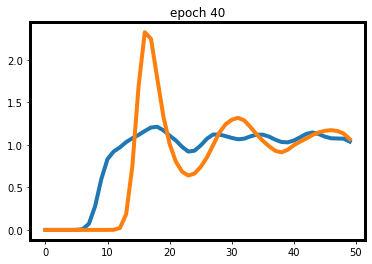

4.150787353515625
1.873255 seconds


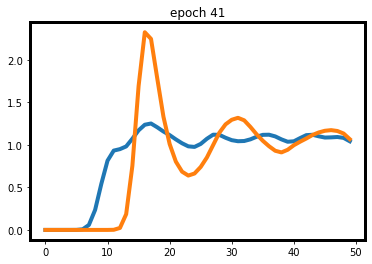

3.9630258083343506
1.890723 seconds


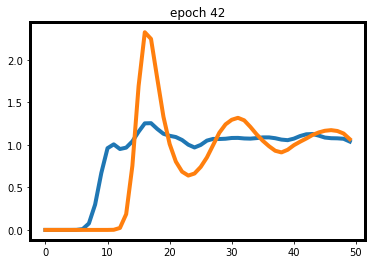

4.32887077331543
1.868481 seconds


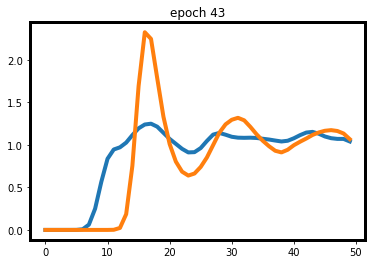

3.955827236175537
1.855781 seconds


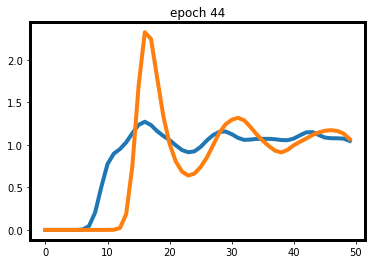

3.7641708850860596
1.83605 seconds


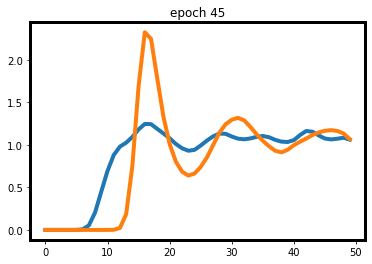

3.6898953914642334
1.809235 seconds


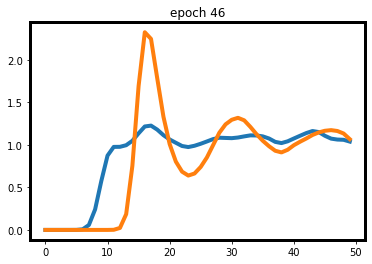

4.145049095153809
1.851934 seconds


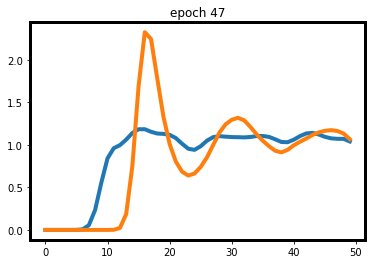

4.284716606140137
1.844718 seconds


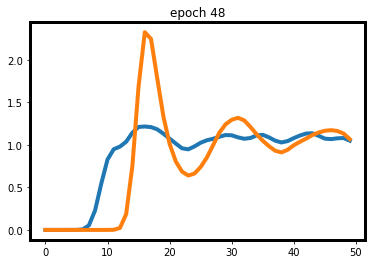

4.073671340942383
1.916162 seconds


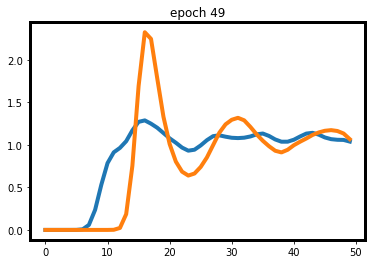

3.837604284286499
1.848331 seconds


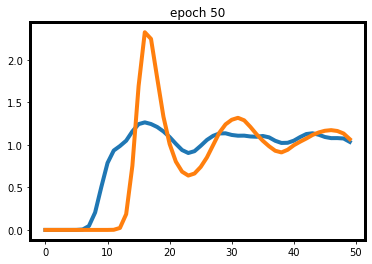

3.823023796081543
2.262869 seconds


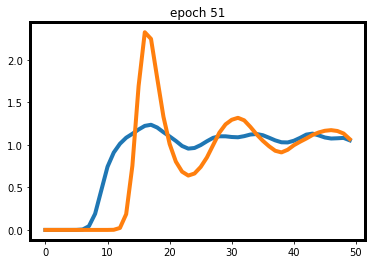

3.908076047897339
1.837339 seconds


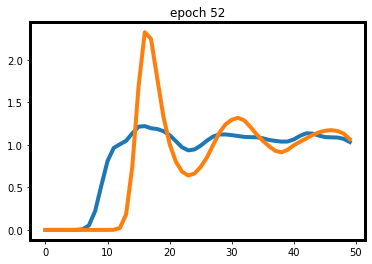

4.058689594268799
1.907493 seconds


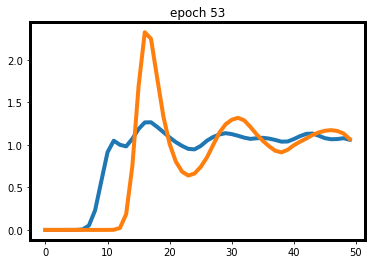

4.141045093536377
1.757967 seconds


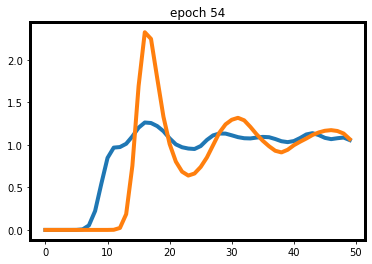

3.943735361099243
1.930286 seconds


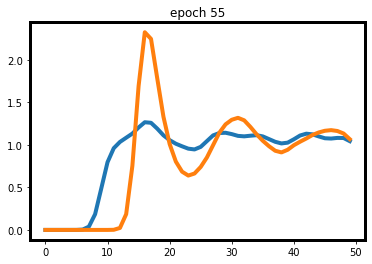

3.9725911617279053
1.836366 seconds


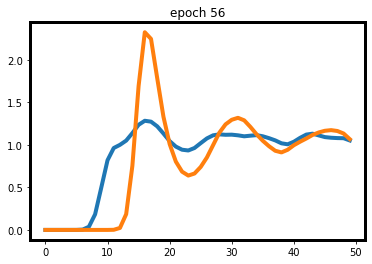

3.8753042221069336
1.840926 seconds


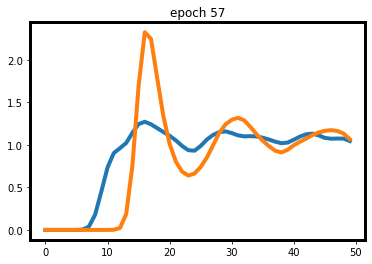

3.6614274978637695
1.848806 seconds


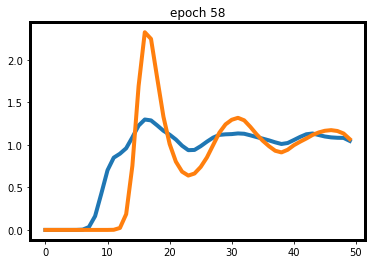

3.3205628395080566
1.86962 seconds


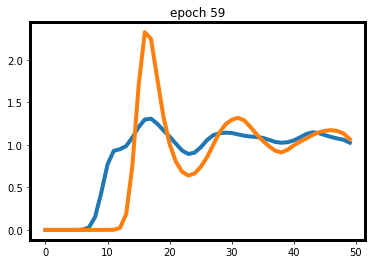

3.5025556087493896
1.851711 seconds


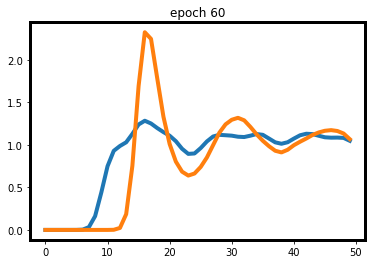

3.67756724357605
1.823031 seconds


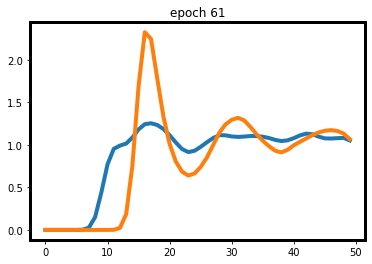

3.756397008895874
1.756748 seconds


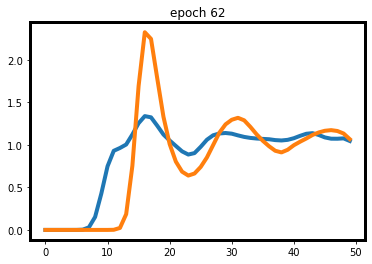

3.4851529598236084
2.055086 seconds


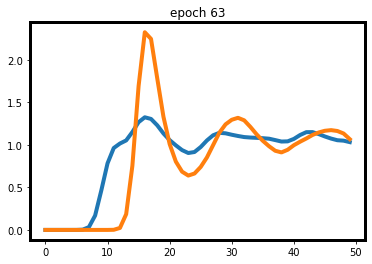

3.73781681060791
1.814466 seconds


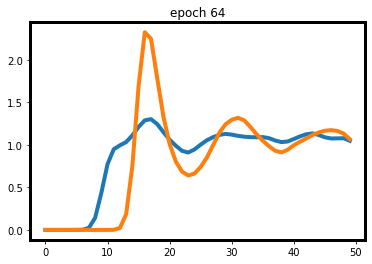

3.6736977100372314
1.905123 seconds


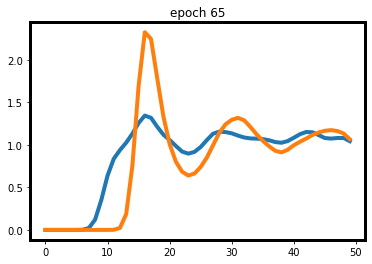

3.2286651134490967
1.879241 seconds


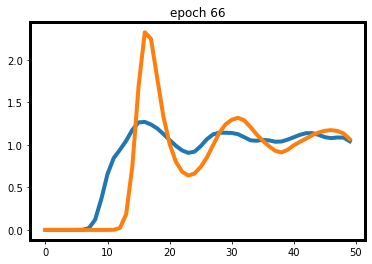

3.4459028244018555
1.911737 seconds


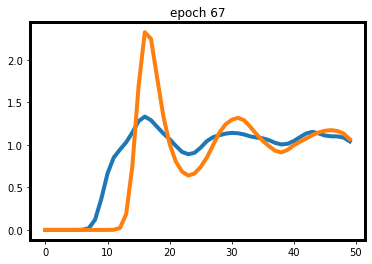

3.2678558826446533
1.851531 seconds


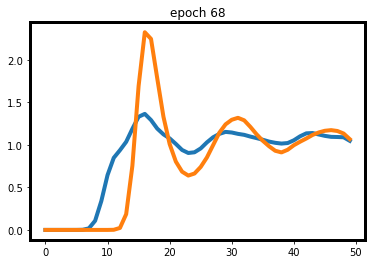

3.226813316345215
1.845792 seconds


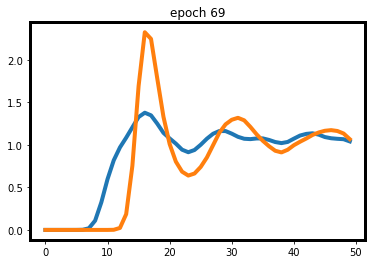

3.2244954109191895
1.873368 seconds


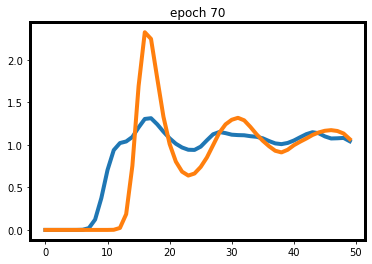

3.564791440963745
1.896201 seconds


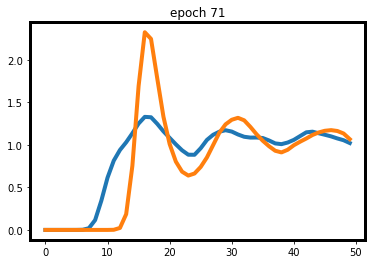

3.1436376571655273
1.933519 seconds


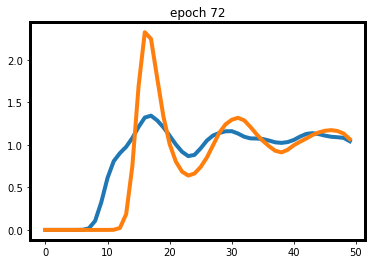

2.9885034561157227
1.761355 seconds


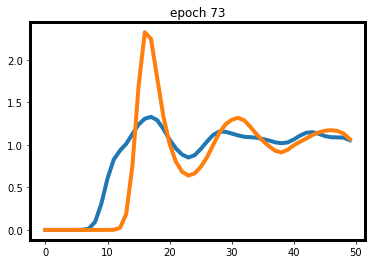

3.0597827434539795
1.93524 seconds


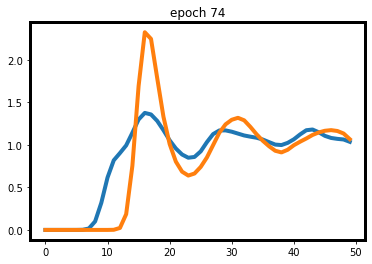

2.9170188903808594
1.857332 seconds


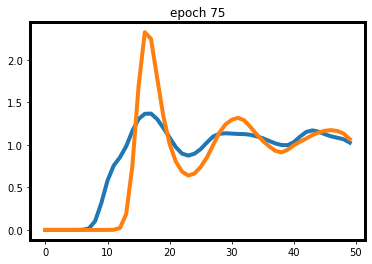

2.7721056938171387
1.848622 seconds


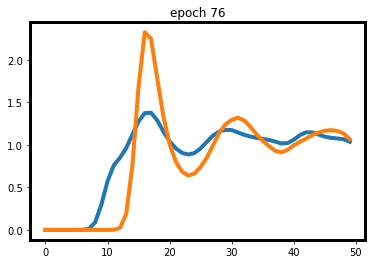

2.7320475578308105
1.824887 seconds


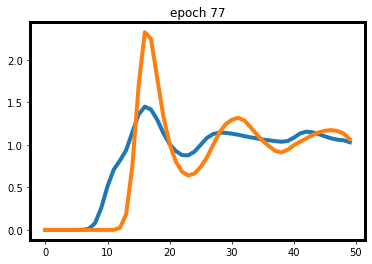

2.5125417709350586
1.903395 seconds


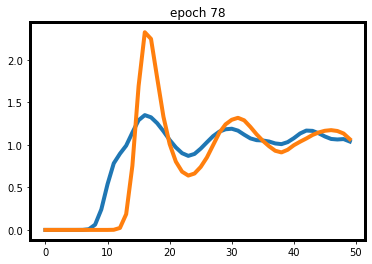

2.8440749645233154
1.806425 seconds


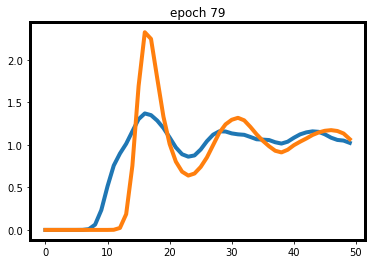

2.776932716369629
1.844529 seconds


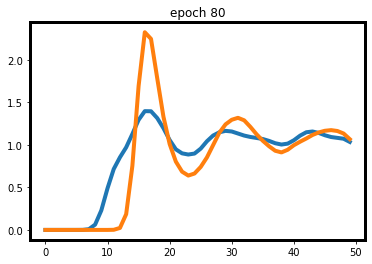

2.5540761947631836
1.868446 seconds


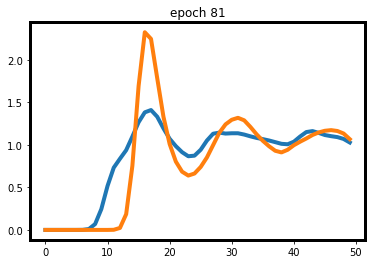

2.545041084289551
1.87041 seconds


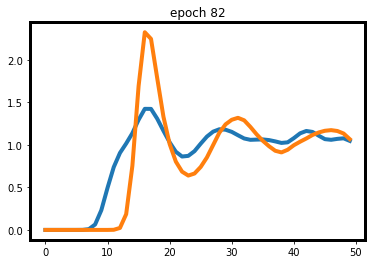

2.7073545455932617
1.899022 seconds


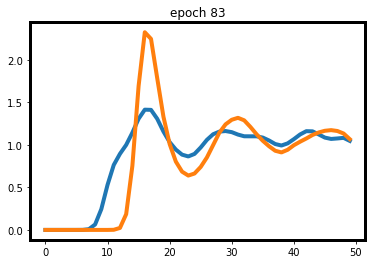

2.699012041091919
1.829466 seconds


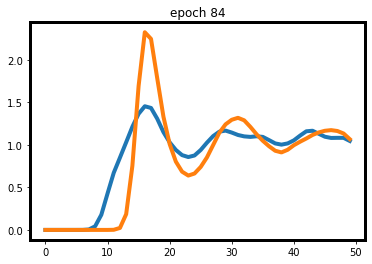

2.4408819675445557
1.825423 seconds


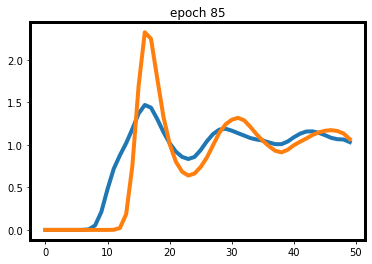

2.5190234184265137
1.916078 seconds


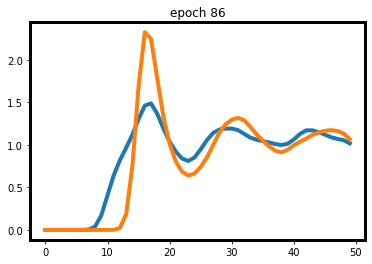

2.195645570755005
1.892041 seconds


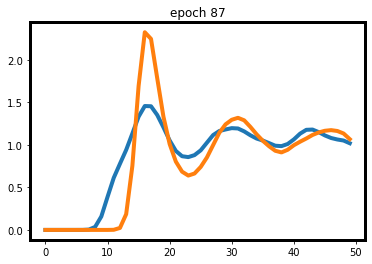

2.111621618270874
1.848271 seconds


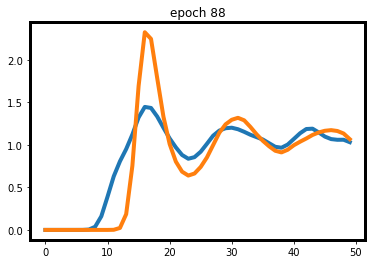

2.186542510986328
1.890899 seconds


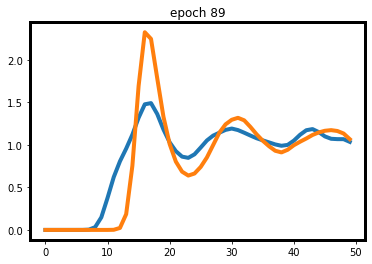

2.127561569213867
1.896912 seconds


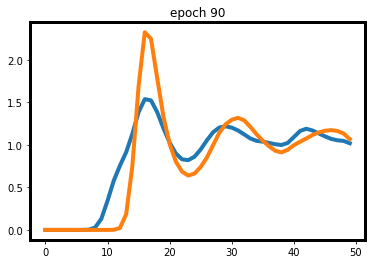

1.9046823978424072
1.856957 seconds


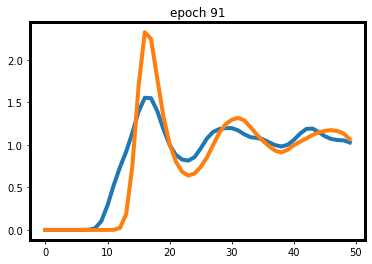

1.7822742462158203
1.825837 seconds


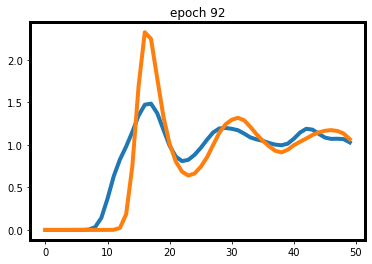

2.178501844406128
1.820571 seconds


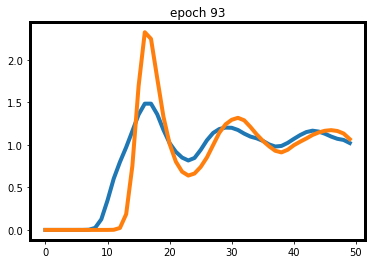

2.0765907764434814
1.986386 seconds


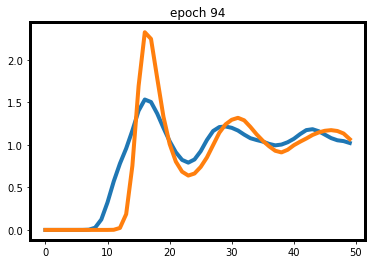

1.955848217010498
1.816391 seconds


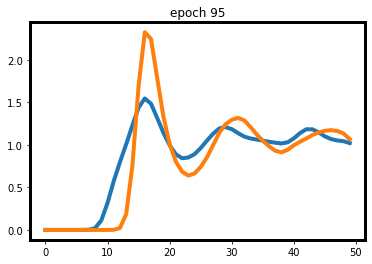

2.1099157333374023
1.783211 seconds


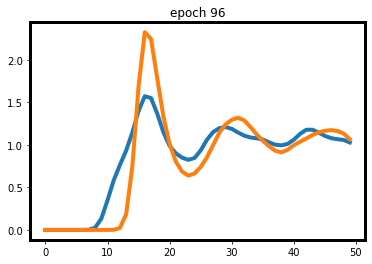

1.910473108291626
1.896216 seconds


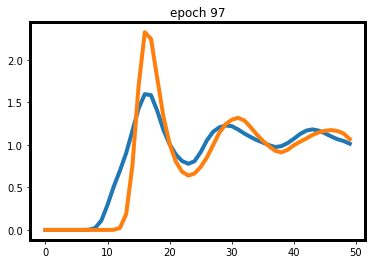

1.6420936584472656
1.861254 seconds


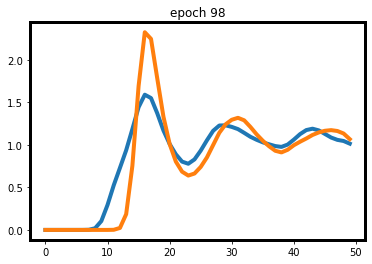

1.7570087909698486
1.840971 seconds


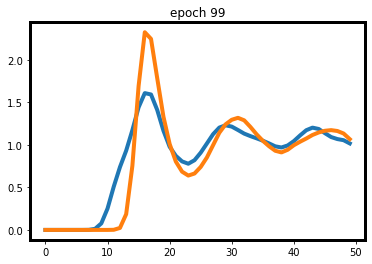

1.6521726846694946
1.88594 seconds


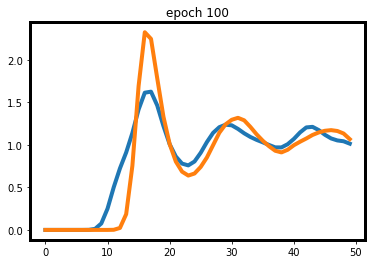

1.5745679140090942
1.801997 seconds


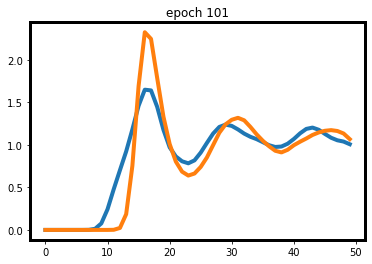

1.5457340478897095
1.842948 seconds


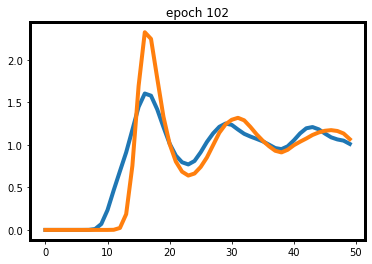

1.5596741437911987
1.814508 seconds


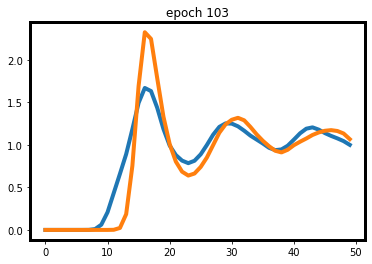

1.3978136777877808
1.820635 seconds


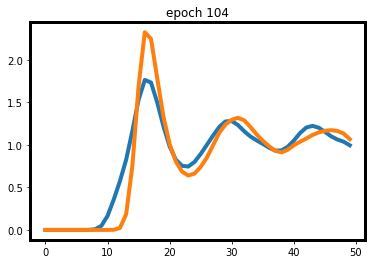

1.0864646434783936
1.835685 seconds


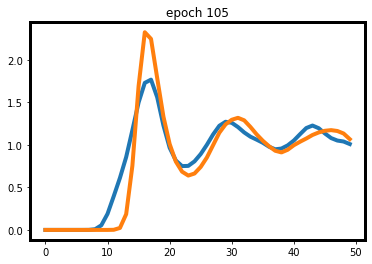

1.1792525053024292
1.868138 seconds


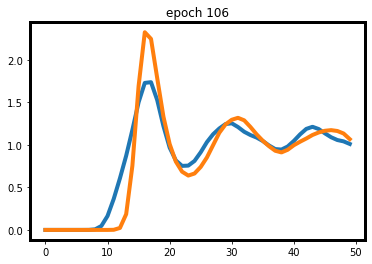

1.1775970458984375
1.862861 seconds


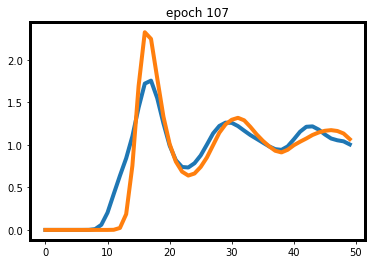

1.1912041902542114
1.973299 seconds


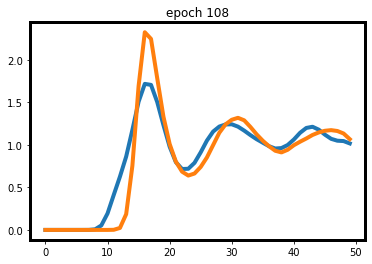

1.2480239868164062
1.936699 seconds


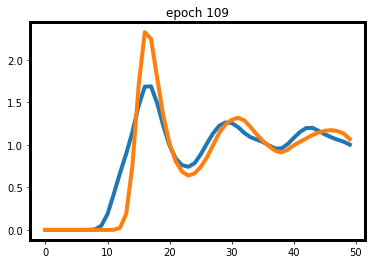

1.3342409133911133
1.901015 seconds


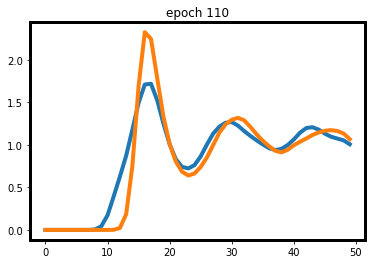

1.2114267349243164
1.766842 seconds


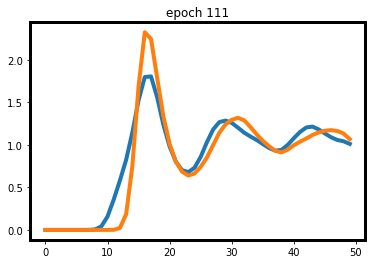

1.042006254196167
1.871923 seconds


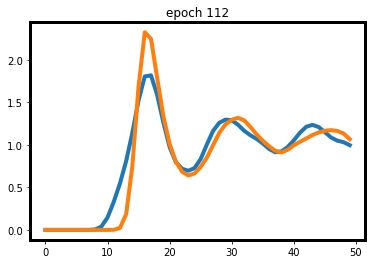

0.9548144936561584
1.788348 seconds


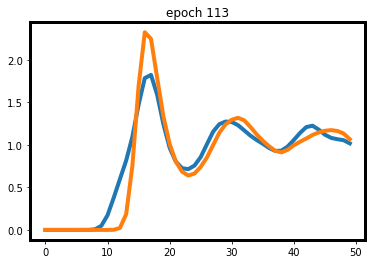

1.030959129333496
1.816443 seconds


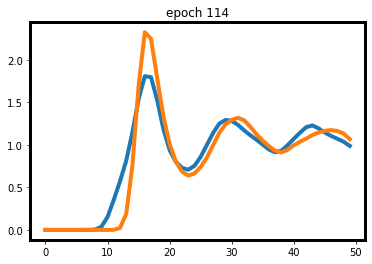

1.0116264820098877
1.876942 seconds


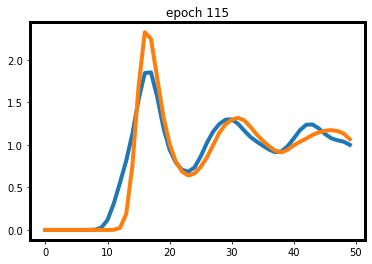

0.9374289512634277
1.841334 seconds


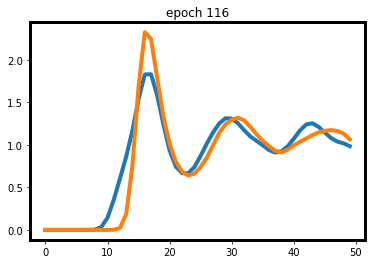

1.0739154815673828
1.885506 seconds


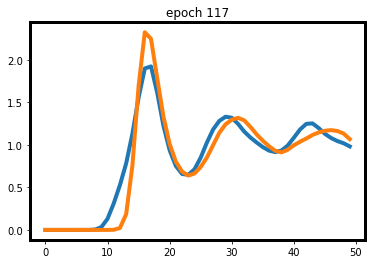

0.8797579407691956
1.827526 seconds


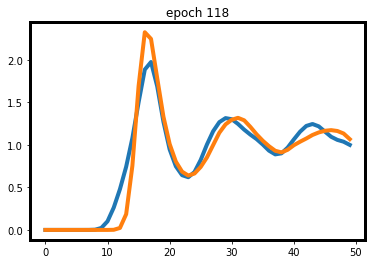

0.7199500799179077
1.921533 seconds


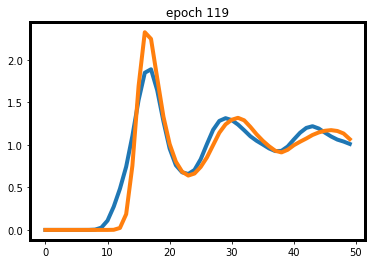

0.7654554843902588
2.262654 seconds


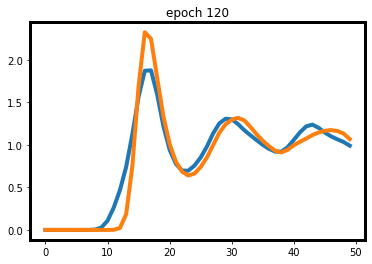

0.7564413547515869
1.843942 seconds


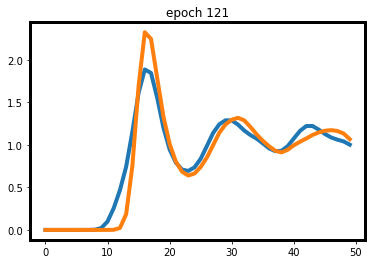

0.7680543661117554
1.908258 seconds


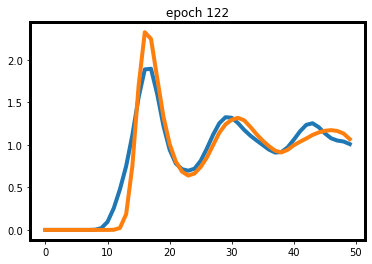

0.7478722333908081
1.864594 seconds


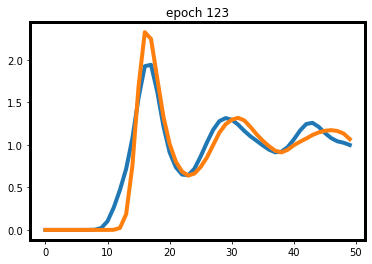

0.7263842225074768
1.838057 seconds


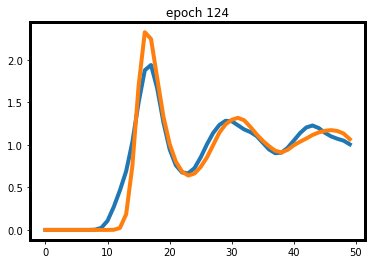

0.6585400700569153
1.842503 seconds


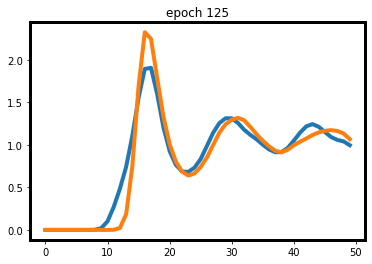

0.7502964735031128
1.844642 seconds


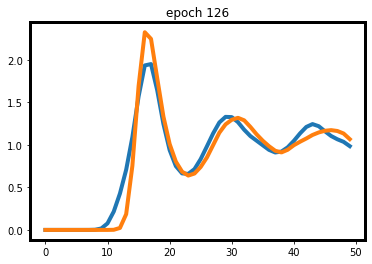

0.6234151124954224
1.816015 seconds


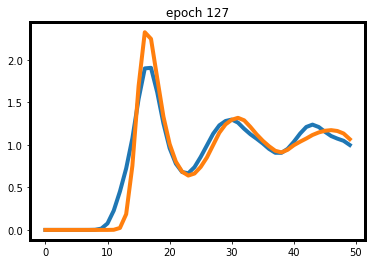

0.6591240763664246
1.978103 seconds


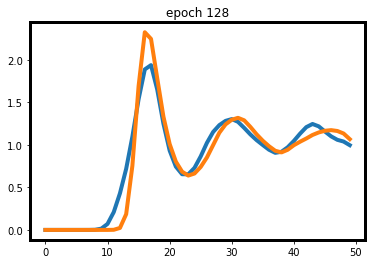

0.651253342628479
1.873085 seconds


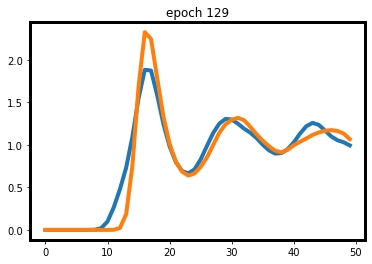

0.7314780950546265
1.83023 seconds


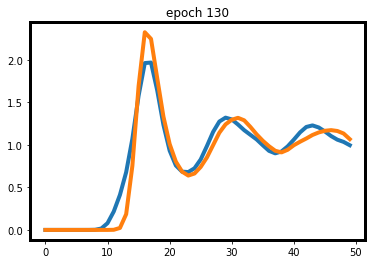

0.5831232070922852
1.905503 seconds


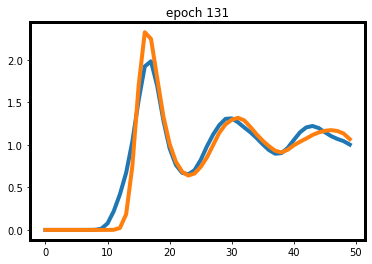

0.5541160106658936
1.839314 seconds


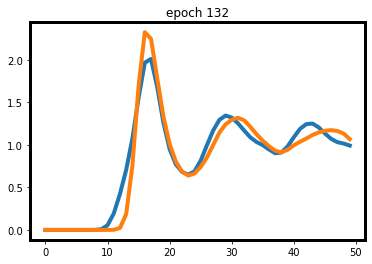

0.6135905981063843
1.848668 seconds


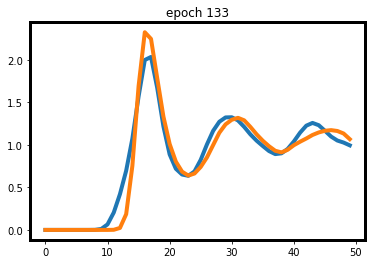

0.5868844389915466
1.832272 seconds


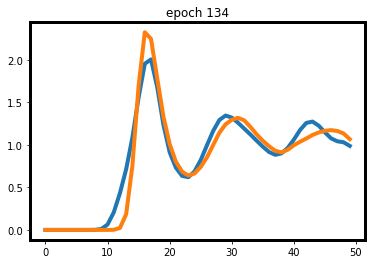

0.6415355801582336
1.883614 seconds


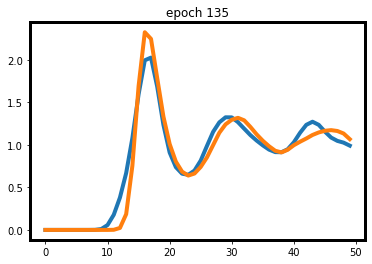

0.5308163166046143
1.933962 seconds


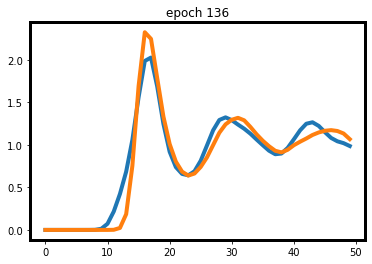

0.5919967889785767
1.877777 seconds


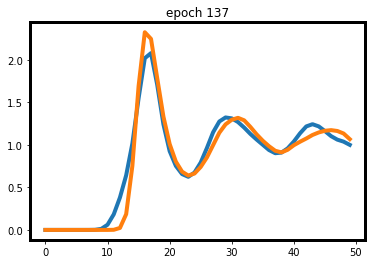

0.46640777587890625
1.933652 seconds


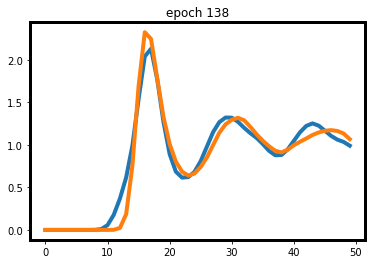

0.4443053603172302
1.837464 seconds


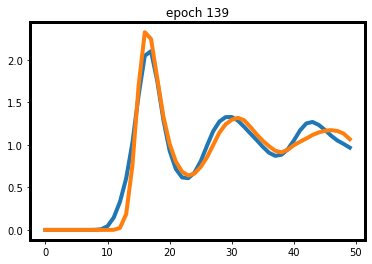

0.4259626865386963
1.925246 seconds


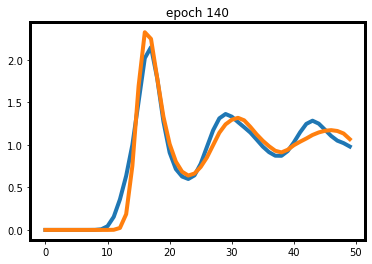

0.4714818000793457
1.8709 seconds


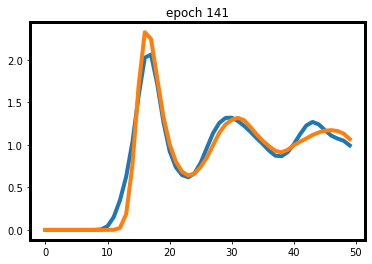

0.4254762530326843
1.817953 seconds


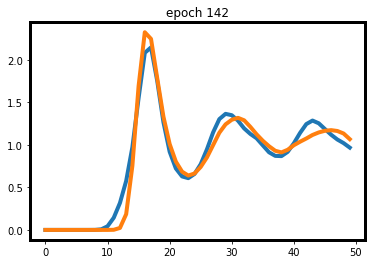

0.3799625039100647
1.817765 seconds


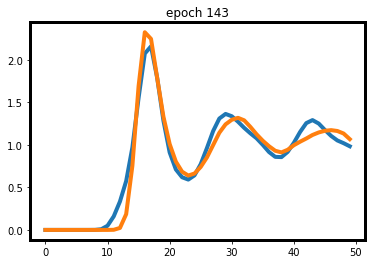

0.4032762050628662
1.848949 seconds


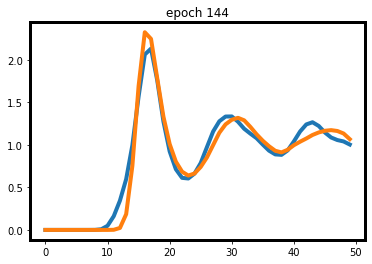

0.409756600856781
1.833033 seconds


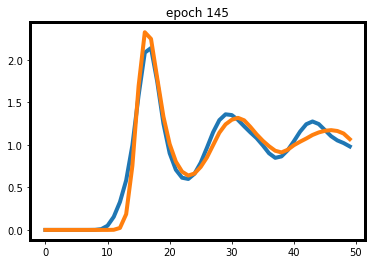

0.40168827772140503
1.771419 seconds


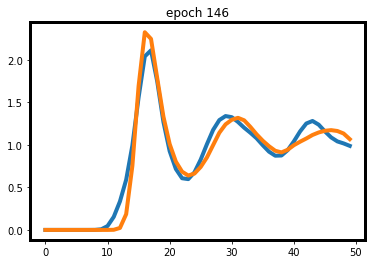

0.4286743402481079
1.953974 seconds


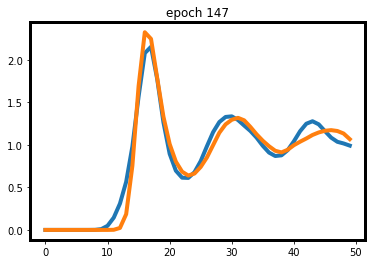

0.3763763904571533
1.946965 seconds


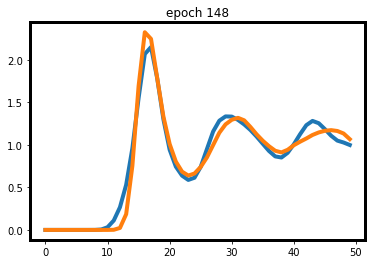

0.30536651611328125
1.962972 seconds


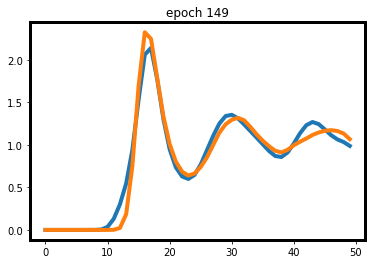

0.3181583285331726
1.820699 seconds


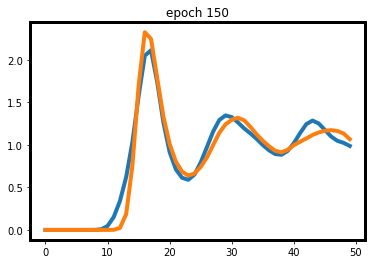

0.44262421131134033
1.850812 seconds


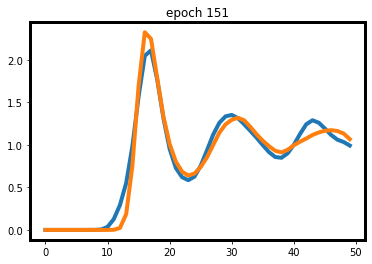

0.3370099365711212
1.864414 seconds


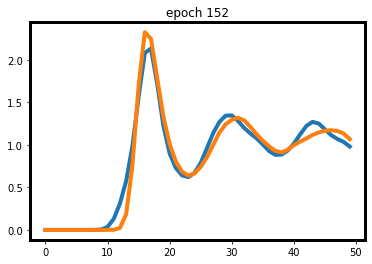

0.3598020672798157
1.88627 seconds


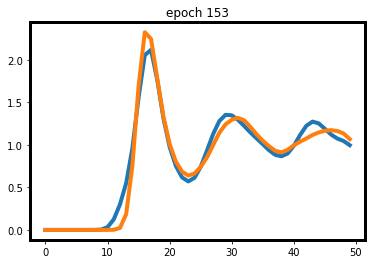

0.3248780071735382
1.908912 seconds


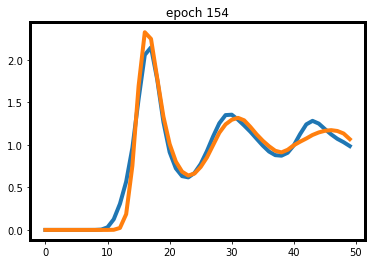

0.3422948718070984
1.831887 seconds


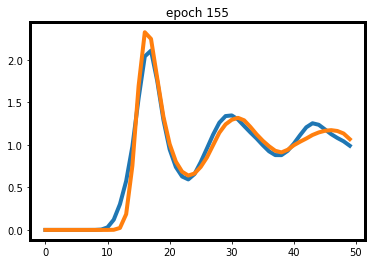

0.3405880928039551
1.964502 seconds


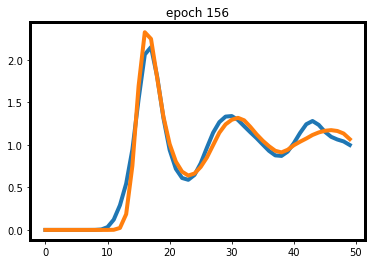

0.32596099376678467
1.837526 seconds


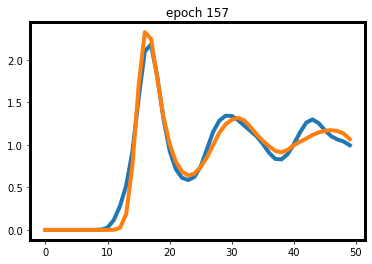

0.31213319301605225
1.846654 seconds


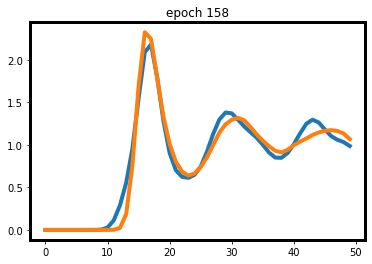

0.3389866352081299
1.945812 seconds


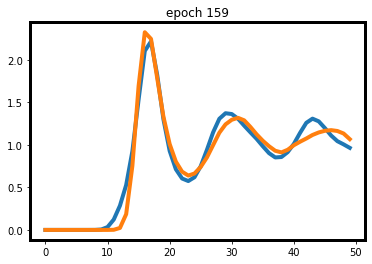

0.3393262028694153
1.870686 seconds


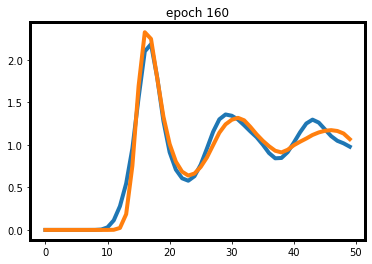

0.3413408398628235
1.88678 seconds


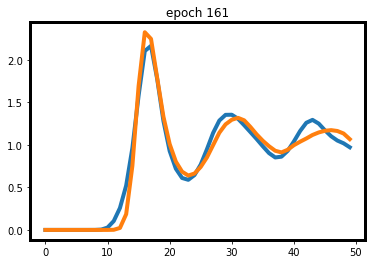

0.3116675615310669
1.850549 seconds


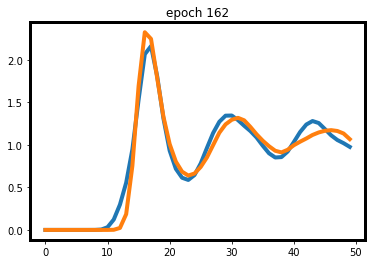

0.34601324796676636
1.855367 seconds


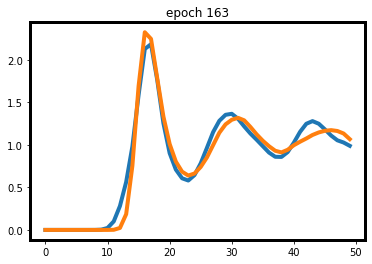

0.3433809280395508
1.835201 seconds


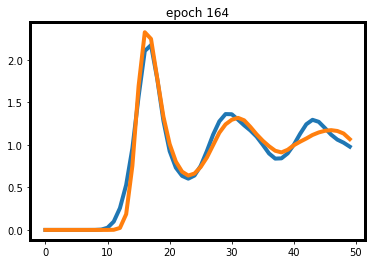

0.29821813106536865
2.005883 seconds


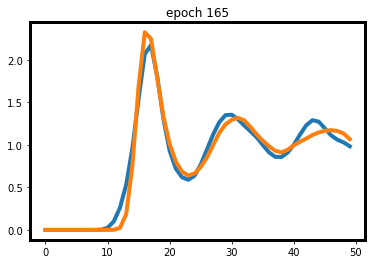

0.30384424328804016
1.864543 seconds


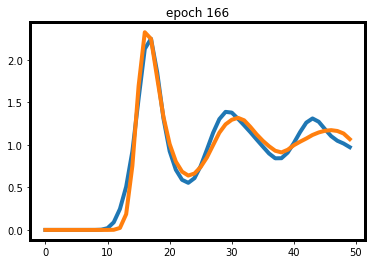

0.31224173307418823
1.884862 seconds


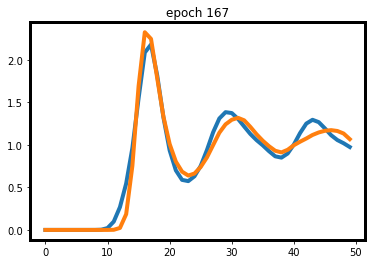

0.34068310260772705
1.93356 seconds


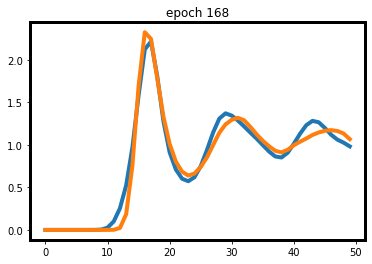

0.3045094311237335
1.855434 seconds


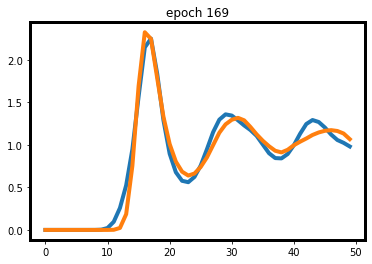

0.31260061264038086
1.800922 seconds


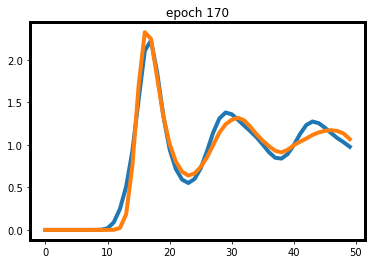

0.28861936926841736
1.805814 seconds


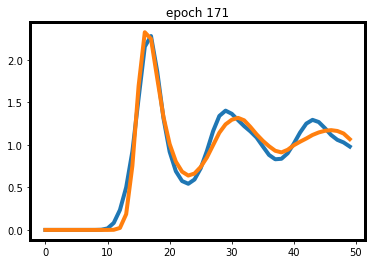

0.3091745376586914
1.901574 seconds


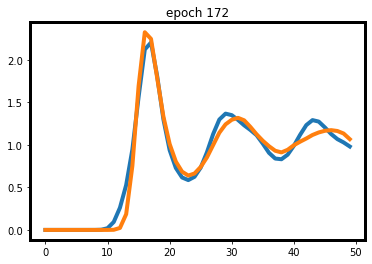

0.2926208972930908
1.866255 seconds


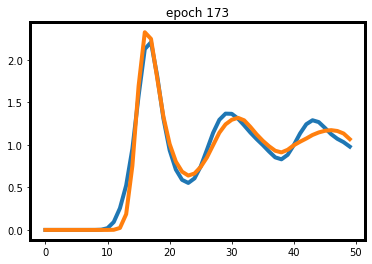

0.30374109745025635
1.836422 seconds


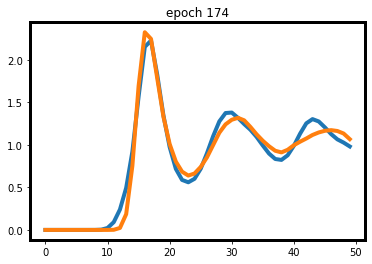

0.27163583040237427
1.896655 seconds


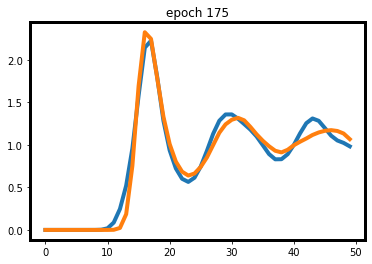

0.2982746362686157
1.843818 seconds


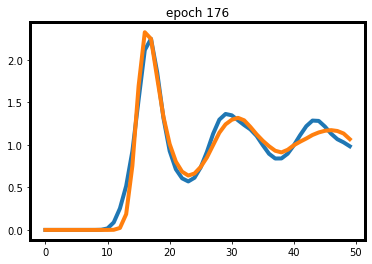

0.2871898412704468
1.854541 seconds


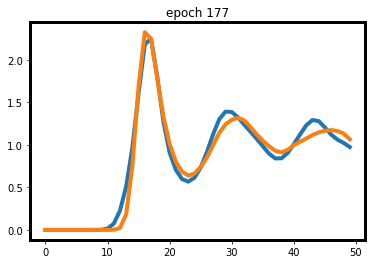

0.28213953971862793
1.899116 seconds


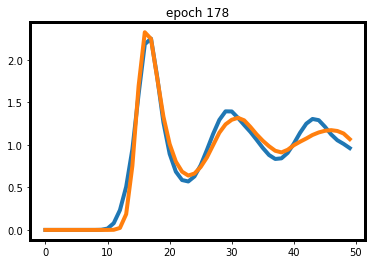

0.30461472272872925
1.867531 seconds


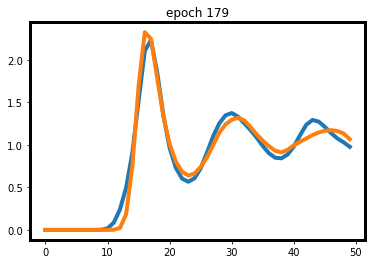

0.2636782228946686
1.835545 seconds


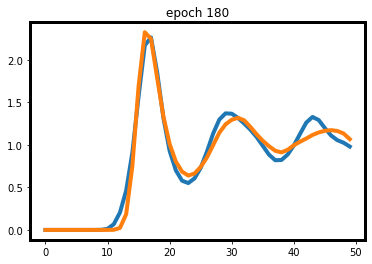

0.2636743187904358
1.897143 seconds


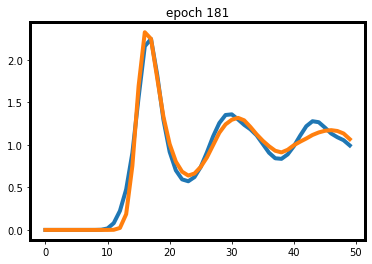

0.22881054878234863
1.915738 seconds


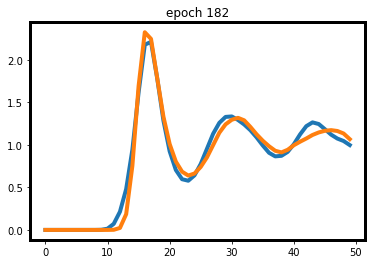

0.2242555320262909
1.870158 seconds


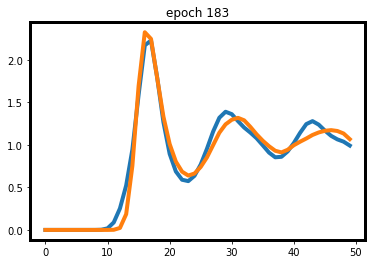

0.3030436038970947
1.914161 seconds


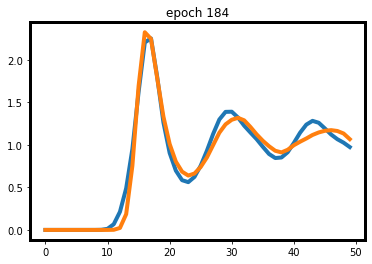

0.26472848653793335
1.937617 seconds


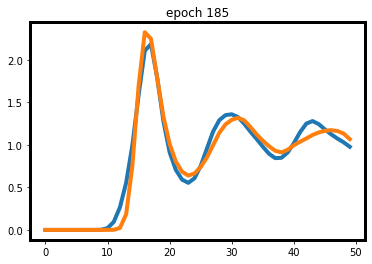

0.33903801441192627
1.839243 seconds


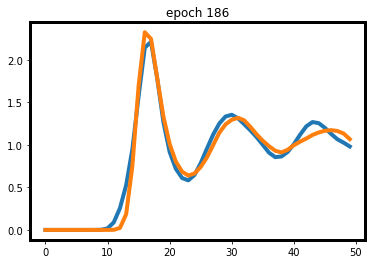

0.2737860083580017
1.903335 seconds


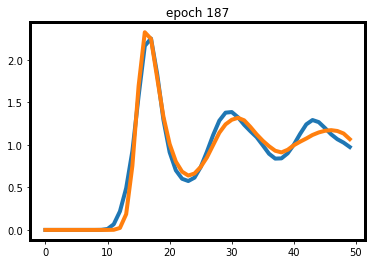

0.2582467794418335
1.842354 seconds


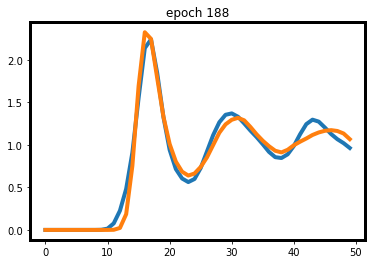

0.25159263610839844
2.267567 seconds


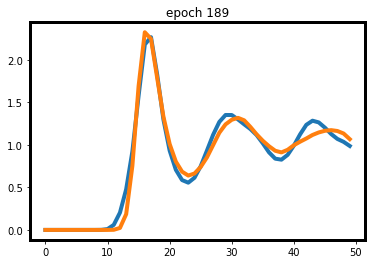

0.23301854729652405
1.872956 seconds


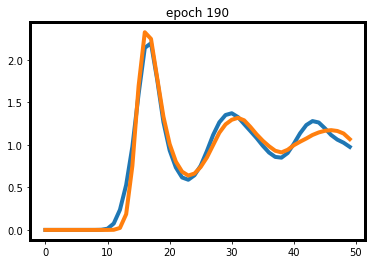

0.2765505313873291
1.979917 seconds


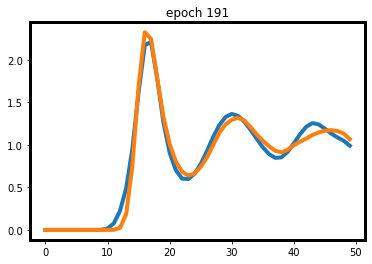

0.228096604347229
1.93146 seconds


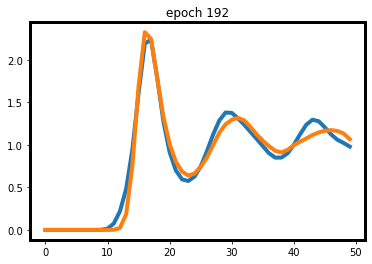

0.2572585940361023
1.91081 seconds


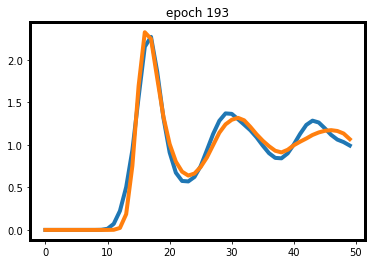

0.27318090200424194
1.817079 seconds


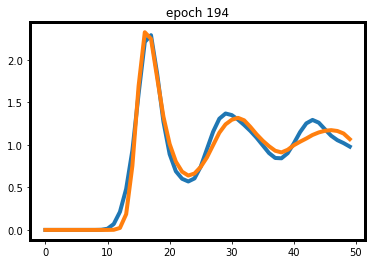

0.2668132185935974
1.867757 seconds


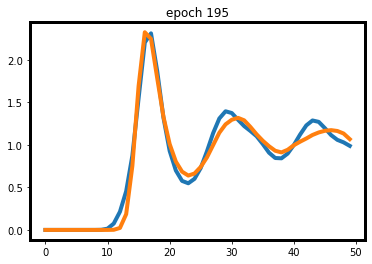

0.2445935308933258
1.895787 seconds


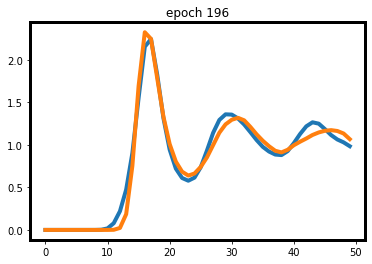

0.2329498529434204
1.954991 seconds


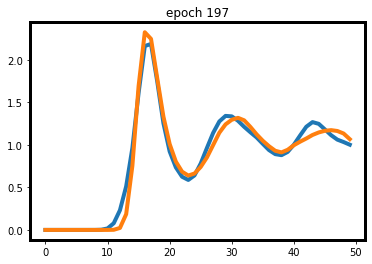

0.2531004846096039
1.813038 seconds


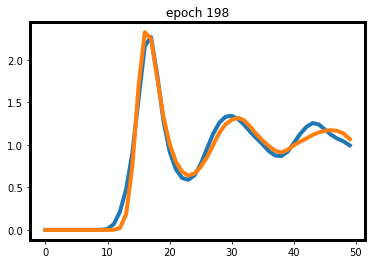

0.2205512821674347
1.799922 seconds


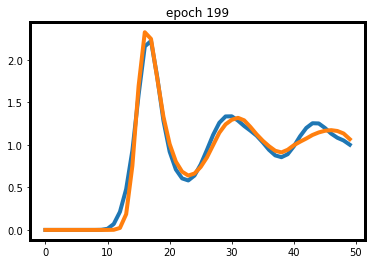

0.21332481503486633
1.839154 seconds


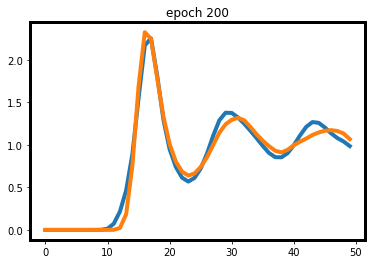

0.21685758233070374
1.709954 seconds


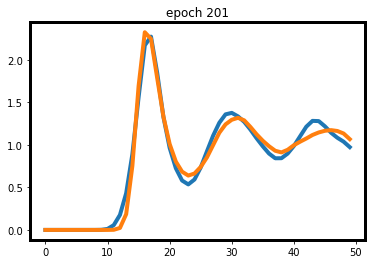

0.2018795609474182
1.919534 seconds


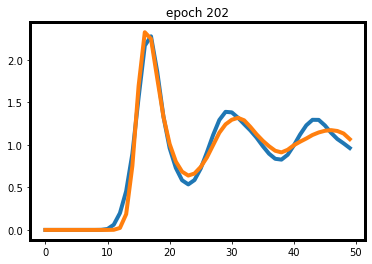

0.24350494146347046
1.780713 seconds


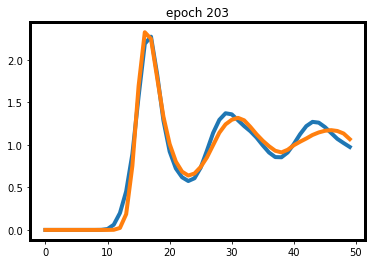

0.2171759009361267
1.881245 seconds


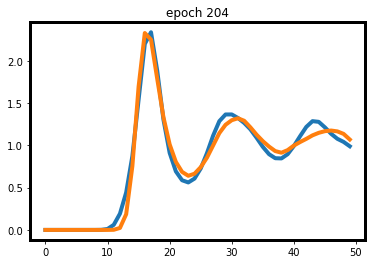

0.21690905094146729
1.954922 seconds


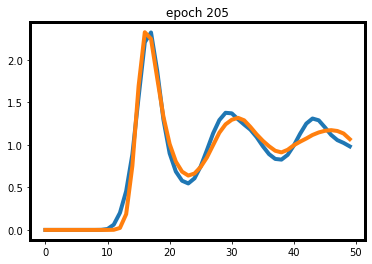

0.2563192844390869
1.797784 seconds


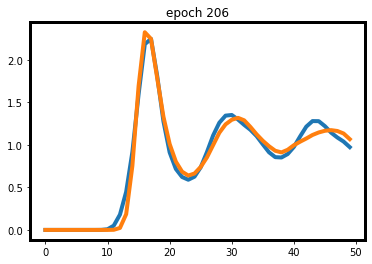

0.1937374472618103
1.810553 seconds


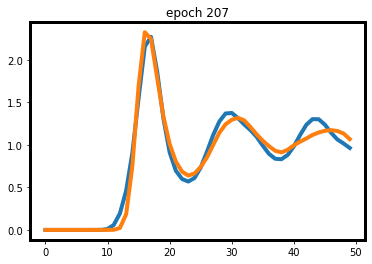

0.24676379561424255
1.905293 seconds


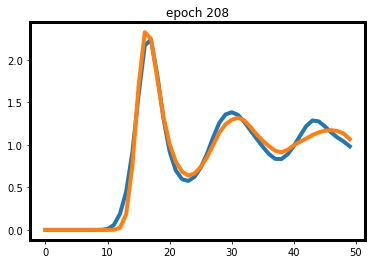

0.21010687947273254
1.894111 seconds


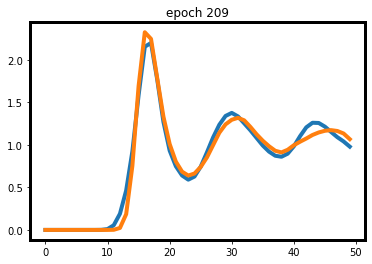

0.19090723991394043
1.847034 seconds


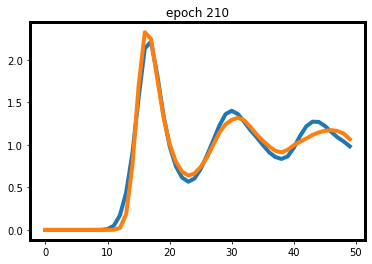

0.18694090843200684
1.934208 seconds


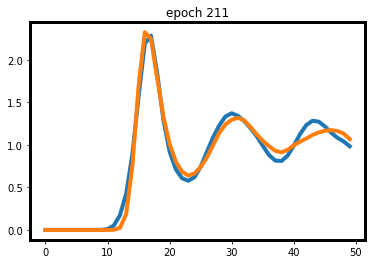

0.19379770755767822
1.865693 seconds


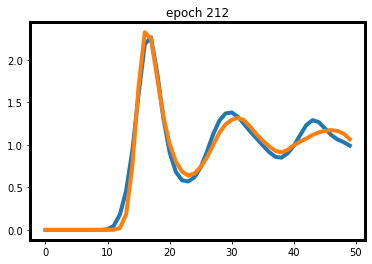

0.22828829288482666
1.835625 seconds


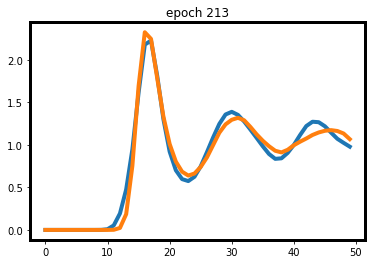

0.22333377599716187
1.910091 seconds


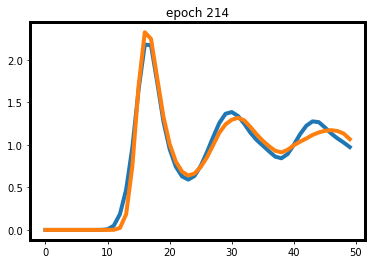

0.2182074785232544
1.864689 seconds


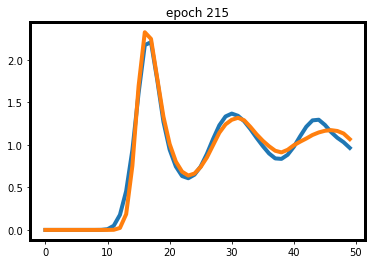

0.19612157344818115
1.84665 seconds


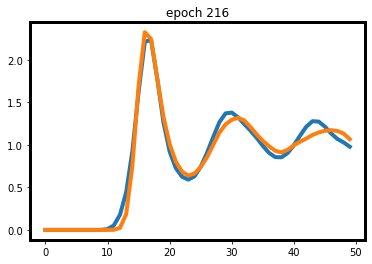

0.19128599762916565
1.864176 seconds


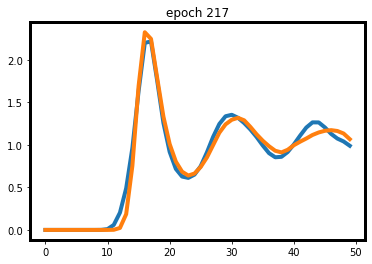

0.21306538581848145
1.899498 seconds


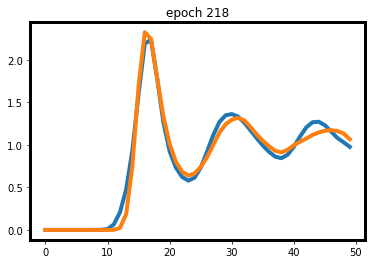

0.2160792350769043
1.923411 seconds


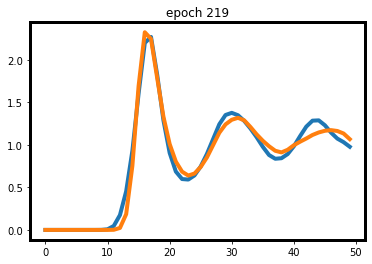

0.20594897866249084
1.910226 seconds


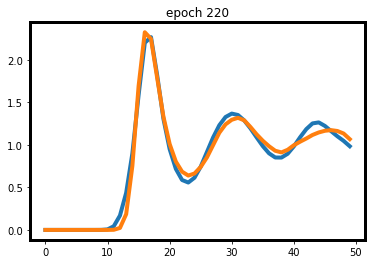

0.1691729724407196
1.801998 seconds


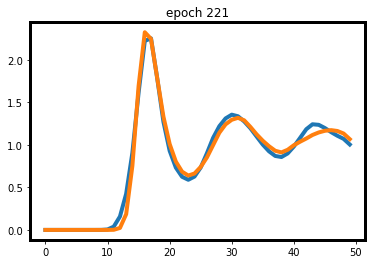

0.13562777638435364
1.890128 seconds


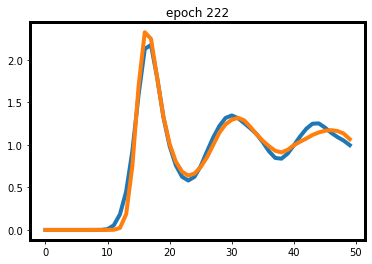

0.1740816831588745
1.830297 seconds


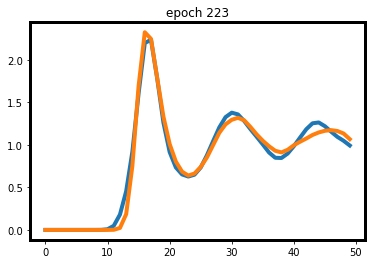

0.16604864597320557
1.901787 seconds


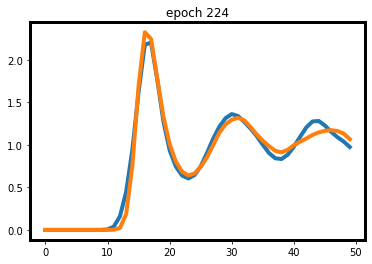

0.17493146657943726
1.850134 seconds


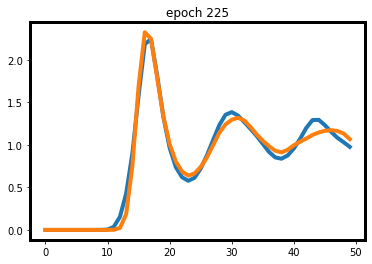

0.1693677008152008
1.875496 seconds


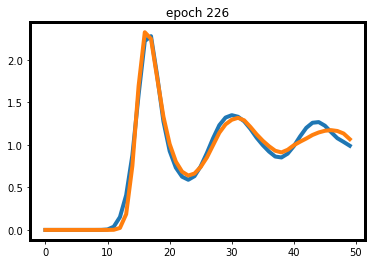

0.14403748512268066
1.839909 seconds


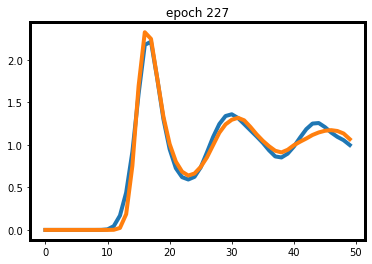

0.16108620166778564
1.903743 seconds


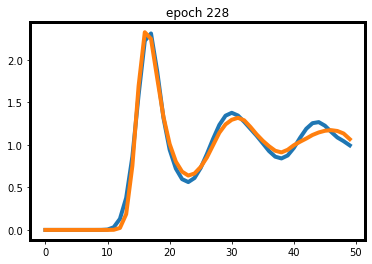

0.1334775686264038
1.83487 seconds


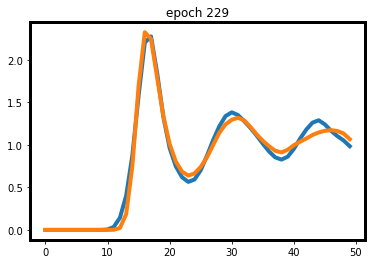

0.1458176076412201
1.944772 seconds


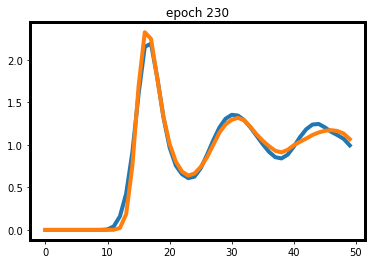

0.1384871006011963
1.814221 seconds


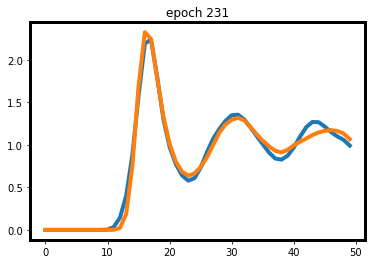

0.13673046231269836
1.83337 seconds


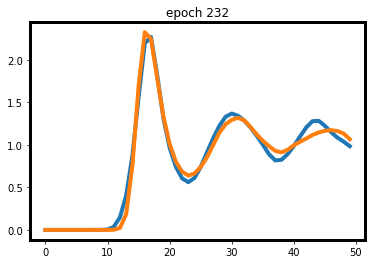

0.15946748852729797
1.879666 seconds


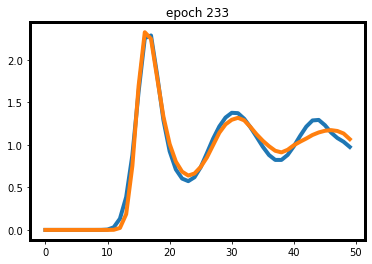

0.15622049570083618
1.834384 seconds


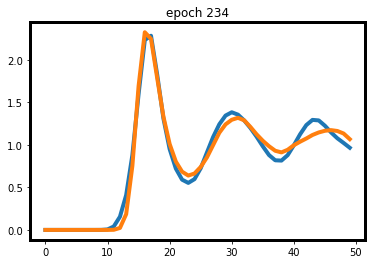

0.18709614872932434
1.808248 seconds


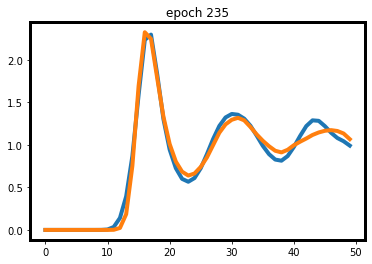

0.15680661797523499
1.913158 seconds


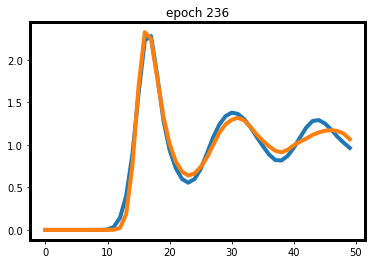

0.17029520869255066
1.876047 seconds


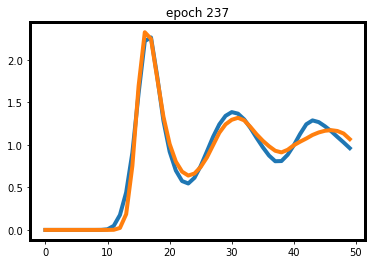

0.21645087003707886
1.859326 seconds


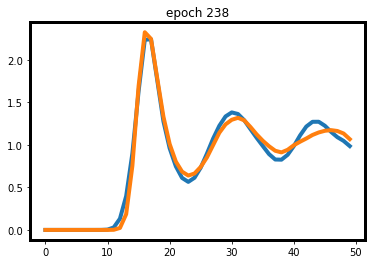

0.14988845586776733
1.863149 seconds


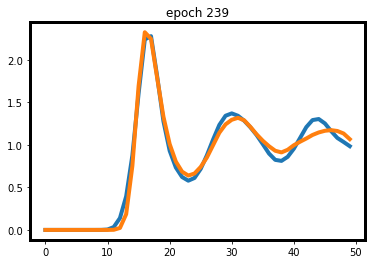

0.1586553156375885
1.818204 seconds


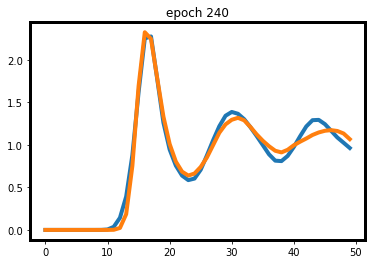

0.1591777801513672
1.781448 seconds


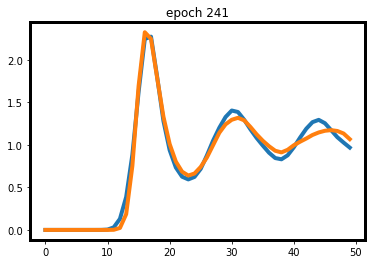

0.1413760781288147
1.877359 seconds


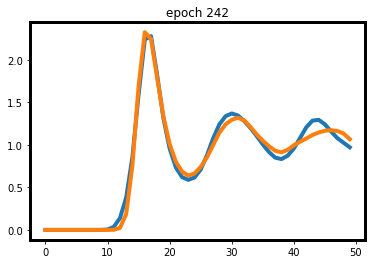

0.14162126183509827
1.861794 seconds


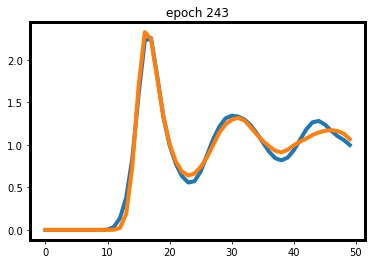

0.12712790071964264
1.862816 seconds


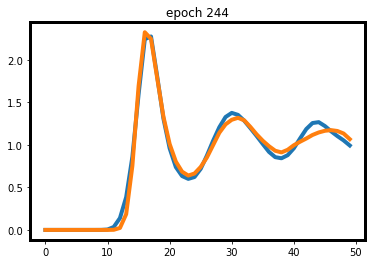

0.11758121848106384
1.829208 seconds


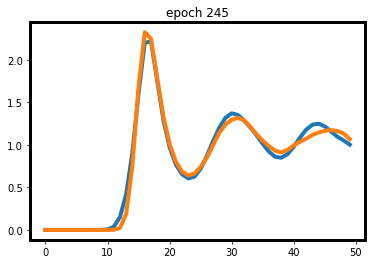

0.127754807472229
1.886063 seconds


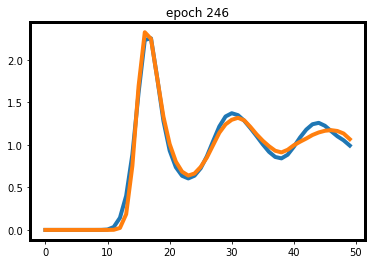

0.12409842014312744
1.827901 seconds


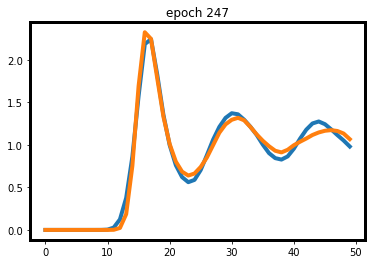

0.12808853387832642
1.822613 seconds


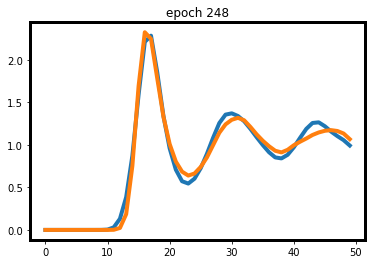

0.14580079913139343
1.907788 seconds


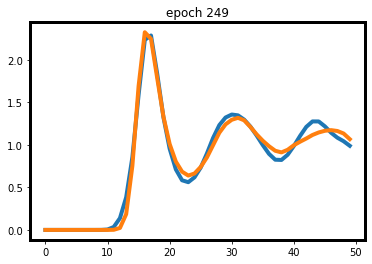

0.14769431948661804
1.886921 seconds


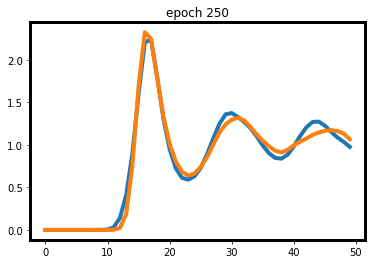

0.15459460020065308
1.975793 seconds


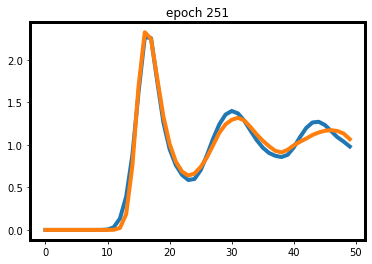

0.1407688558101654
1.895643 seconds


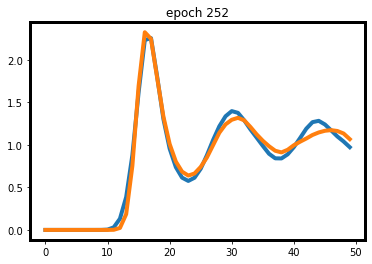

0.1378071904182434
1.862161 seconds


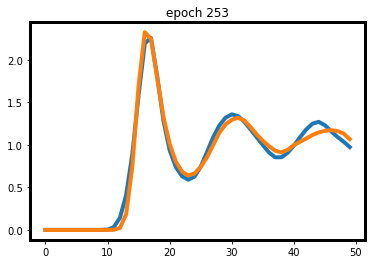

0.14372721314430237
1.832899 seconds


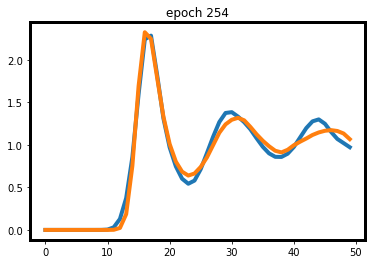

0.15530648827552795
1.846447 seconds


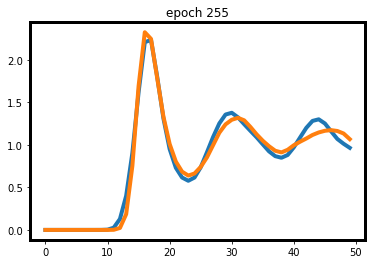

0.1613292694091797
1.834063 seconds


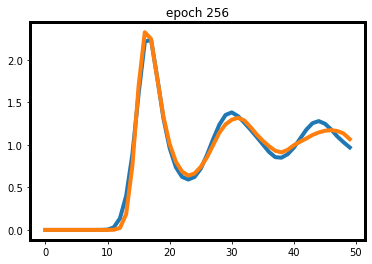

0.13863611221313477
1.888349 seconds


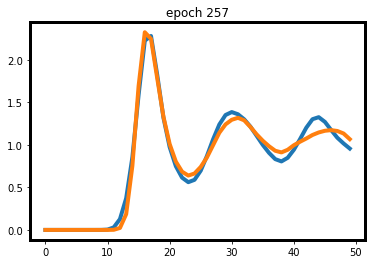

0.16266167163848877
2.271866 seconds


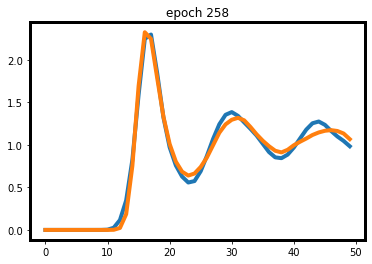

0.11590906977653503
1.958462 seconds


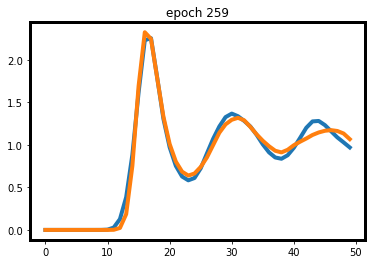

0.1319284737110138
1.893936 seconds


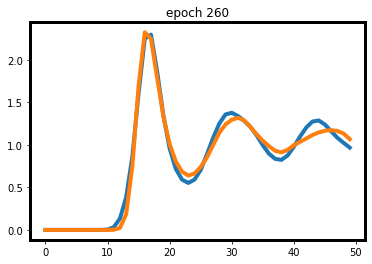

0.15845763683319092
1.862321 seconds


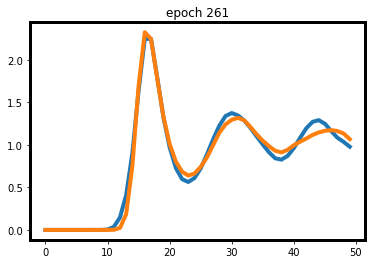

0.15448623895645142
1.887867 seconds


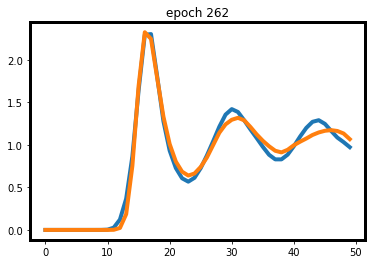

0.1431497037410736
1.90989 seconds


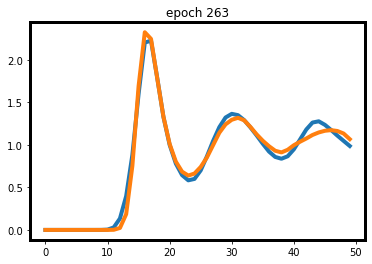

0.12630580365657806
1.841881 seconds


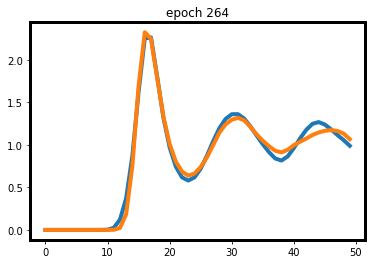

0.11065232753753662
1.863305 seconds


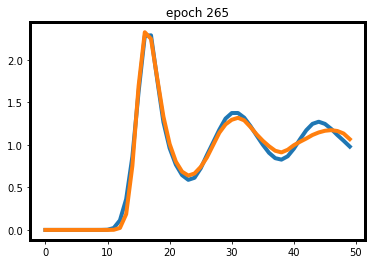

0.1053086519241333
1.90662 seconds


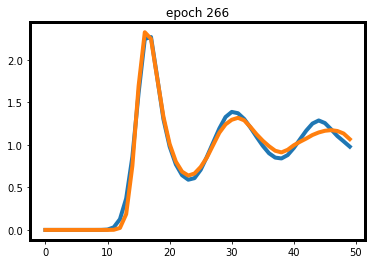

0.11402767896652222
1.975615 seconds


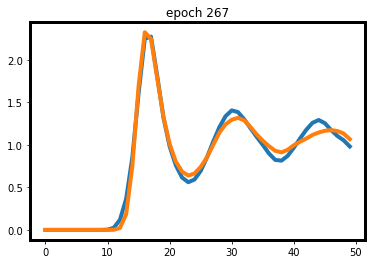

0.12840886414051056
1.860099 seconds


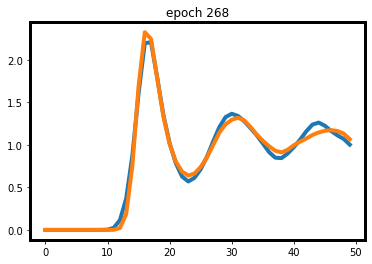

0.10058169066905975
1.84332 seconds


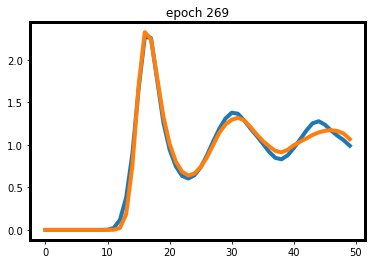

0.11124160885810852
1.899029 seconds


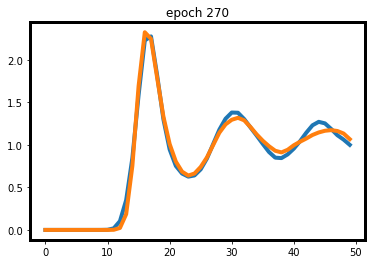

0.08898000419139862
1.818888 seconds


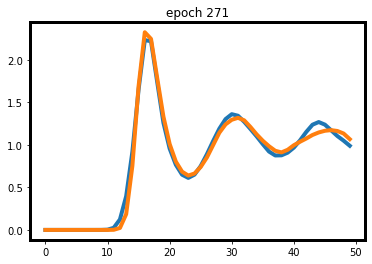

0.10984620451927185
1.871834 seconds


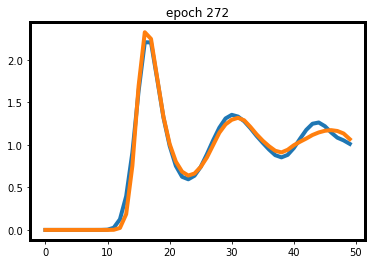

0.11329469084739685
1.873944 seconds


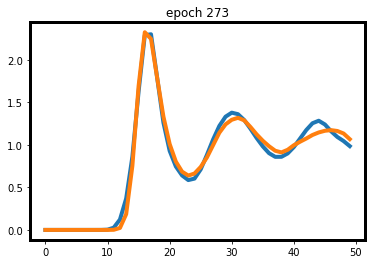

0.11804676055908203
1.910976 seconds


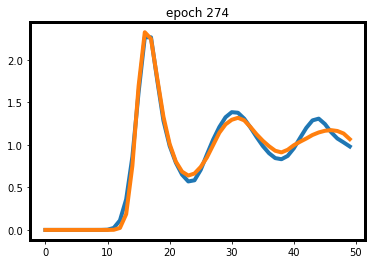

0.12960398197174072
1.93349 seconds


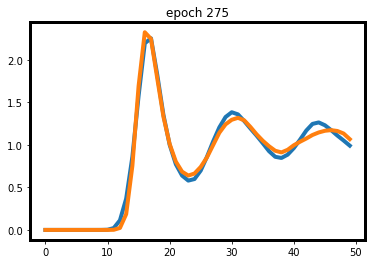

0.10682573914527893
1.932629 seconds


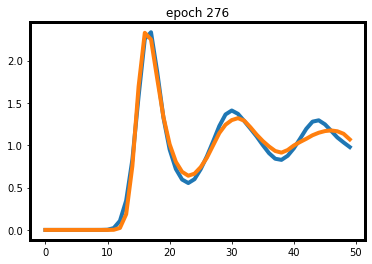

0.13650402426719666
1.921371 seconds


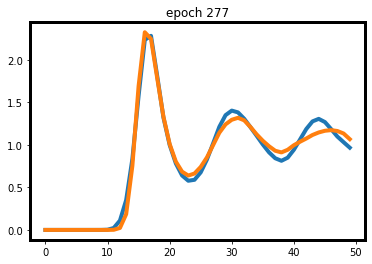

0.13085484504699707
1.924106 seconds


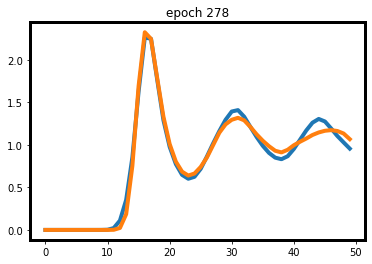

0.11341874301433563
1.870109 seconds


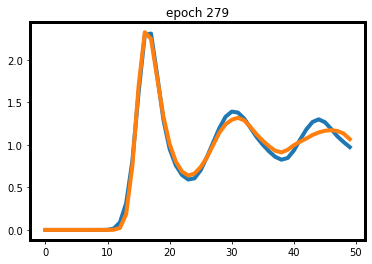

0.10256940126419067
1.893128 seconds


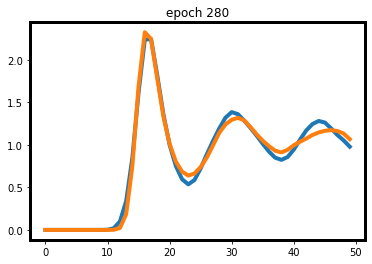

0.11060285568237305
1.85759 seconds


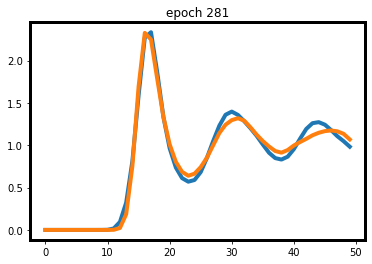

0.11230213940143585
1.899481 seconds


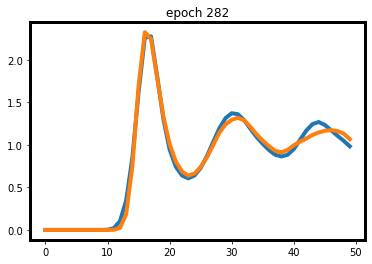

0.08624958992004395
1.79896 seconds


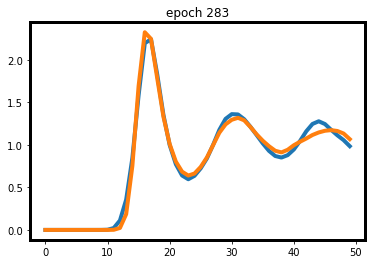

0.0934370756149292
1.847722 seconds


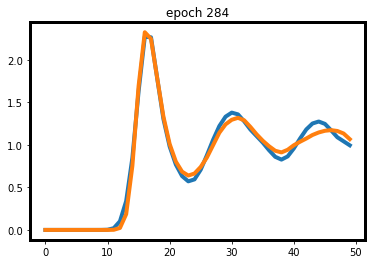

0.10063117742538452
1.886782 seconds


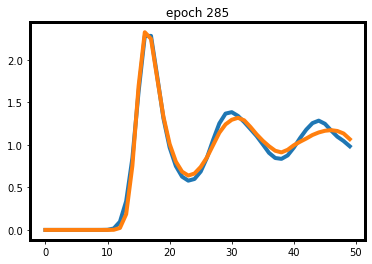

0.11014804244041443
1.904385 seconds


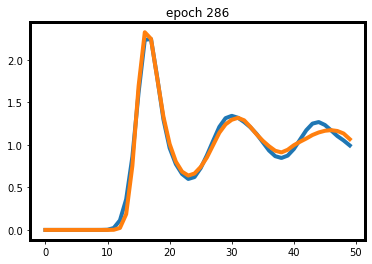

0.09345407783985138
1.84288 seconds


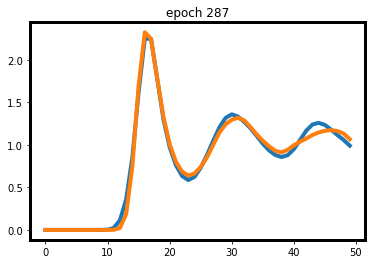

0.08982500433921814
1.91194 seconds


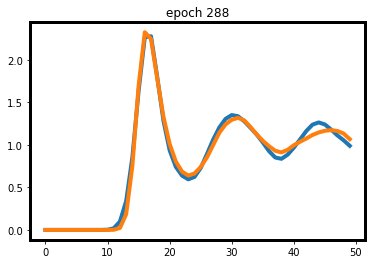

0.08771836757659912
1.890282 seconds


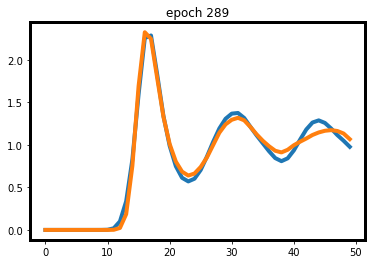

0.10836929082870483
1.907385 seconds


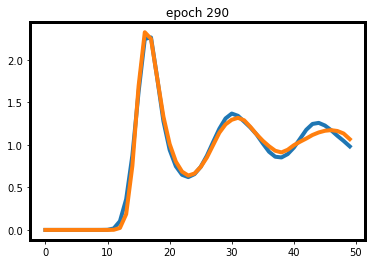

0.09397649765014648
1.876811 seconds


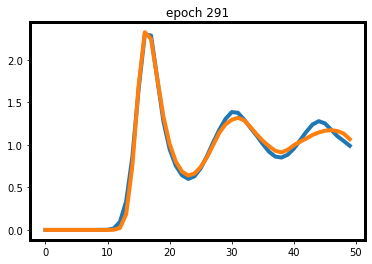

0.08568447828292847
1.891589 seconds


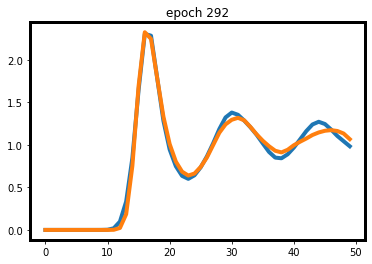

0.08498625457286835
1.857015 seconds


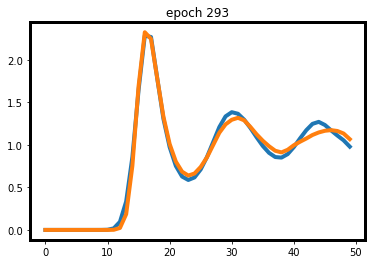

0.09137028455734253
1.937071 seconds


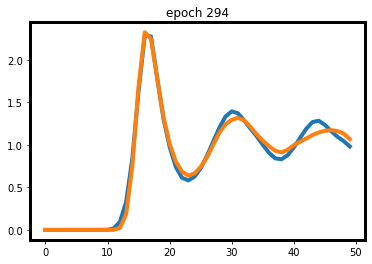

0.10211646556854248
1.864203 seconds


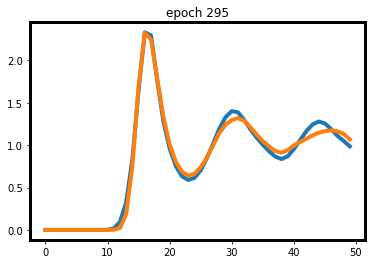

0.08994607627391815
1.88669 seconds


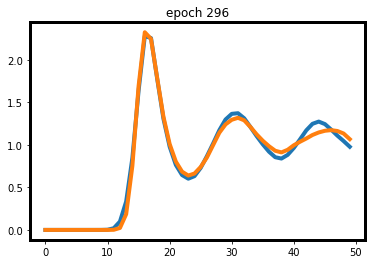

0.08311277627944946
1.809896 seconds


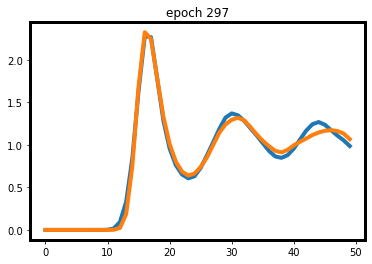

0.07929001748561859
1.859478 seconds


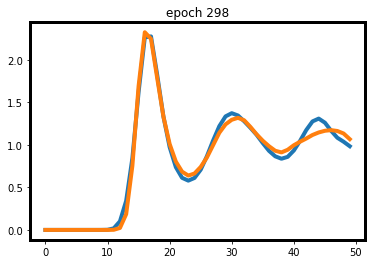

0.11174628138542175
1.855399 seconds


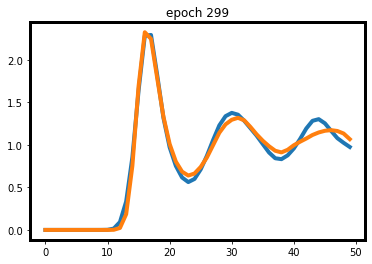

0.11687323451042175
1.867749 seconds


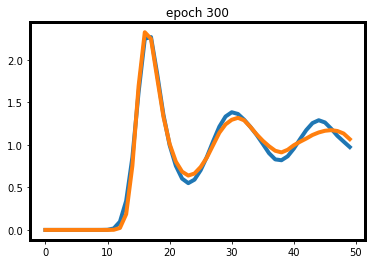

0.11690168082714081
1.877545 seconds


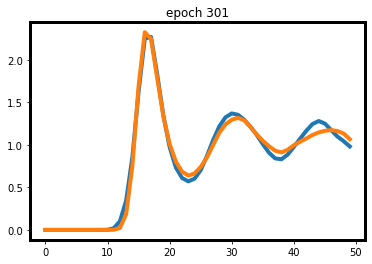

0.106045663356781
1.879279 seconds


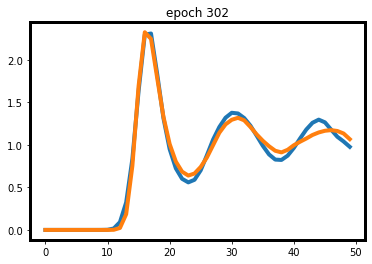

0.1168910562992096
1.882992 seconds


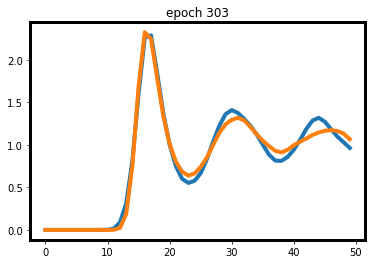

0.13473288714885712
1.915445 seconds


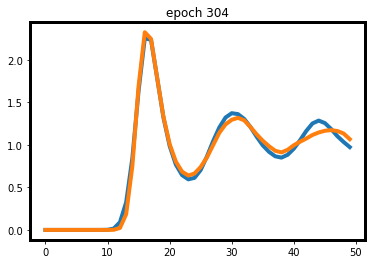

0.08887763321399689
1.89054 seconds


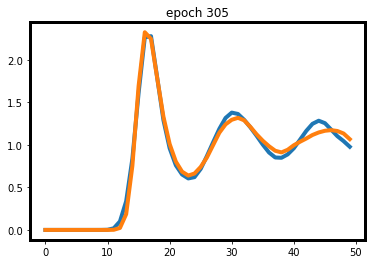

0.09138235449790955
1.902329 seconds


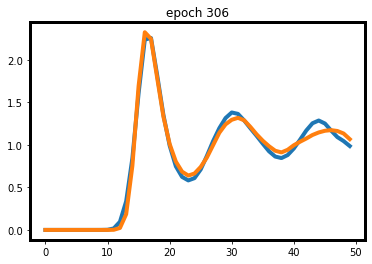

0.09620204567909241
1.889436 seconds


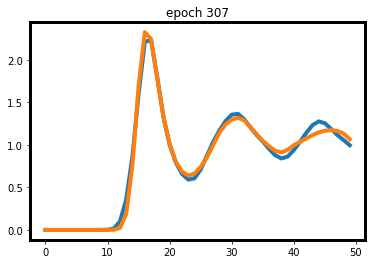

0.08695328235626221
1.788841 seconds


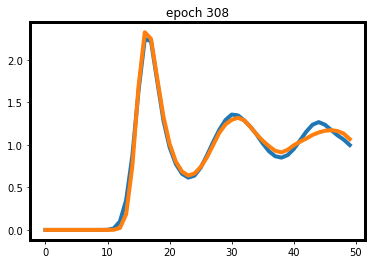

0.08103694021701813
1.831946 seconds


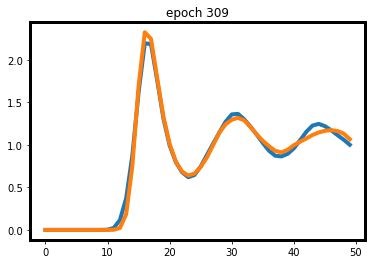

0.08497394621372223
1.898775 seconds


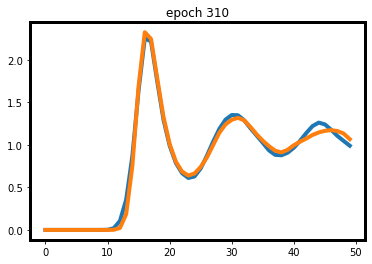

0.07633961737155914
1.859793 seconds


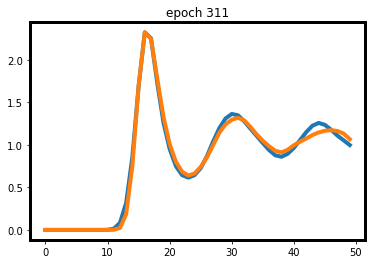

0.06776954233646393
1.845199 seconds


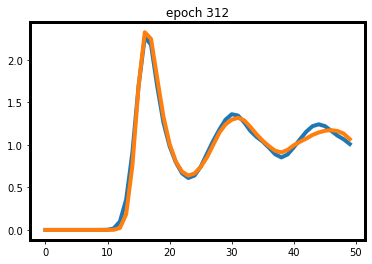

0.0831240713596344
1.995213 seconds


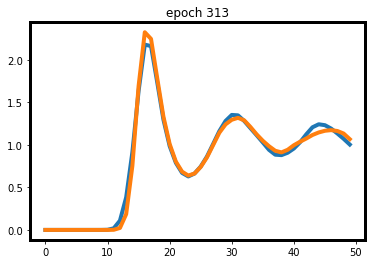

0.08651095628738403
1.876467 seconds


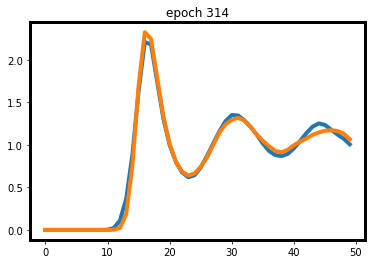

0.07702416181564331
1.893414 seconds


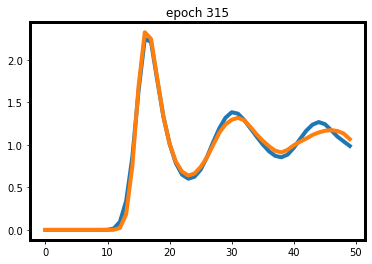

0.08468165993690491
1.913479 seconds


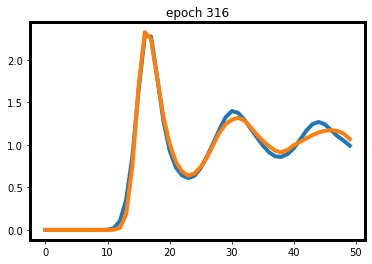

0.0954039990901947
1.913637 seconds


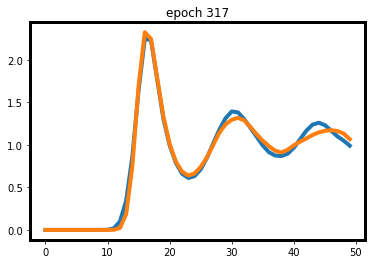

0.08233080804347992
1.867645 seconds


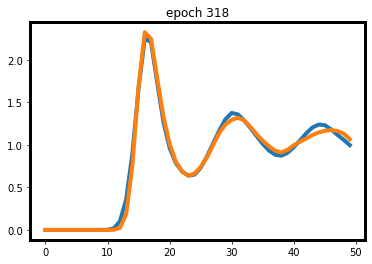

0.07521319389343262
1.920828 seconds


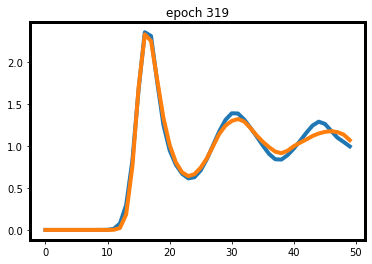

0.07816417515277863
1.831873 seconds


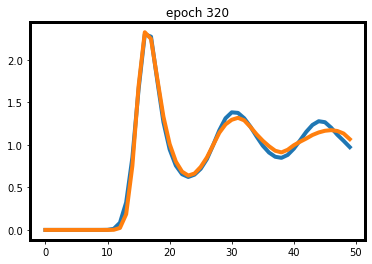

0.0825715959072113
1.859971 seconds


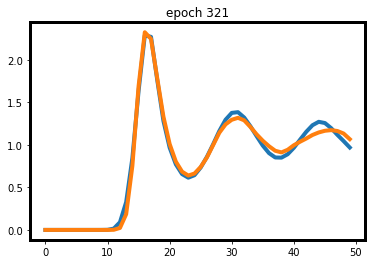

0.07999803125858307
1.909782 seconds


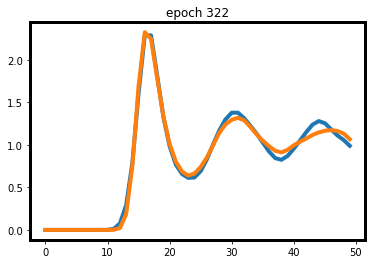

0.07000122964382172
1.859062 seconds


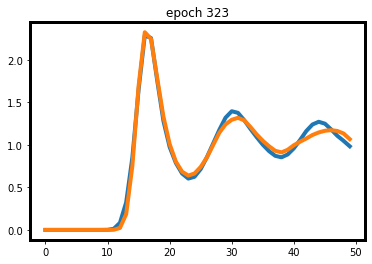

0.07813602685928345
1.88413 seconds


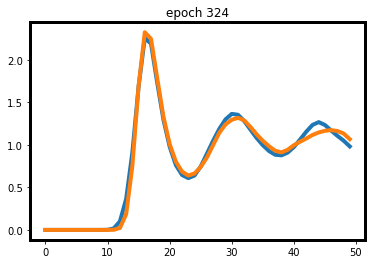

0.0935259461402893
1.925632 seconds


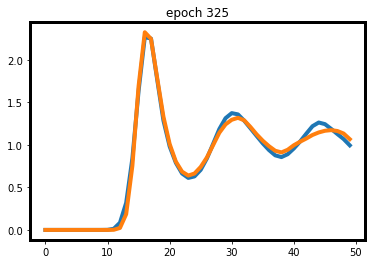

0.062652587890625
1.956902 seconds


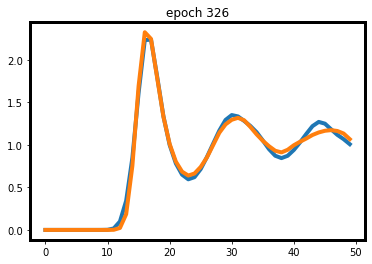

0.07298773527145386
2.273134 seconds


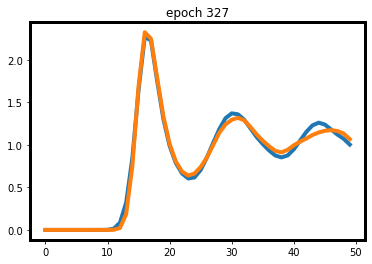

0.066902756690979
1.804919 seconds


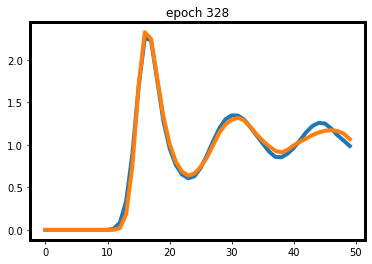

0.07870461046695709
1.934244 seconds


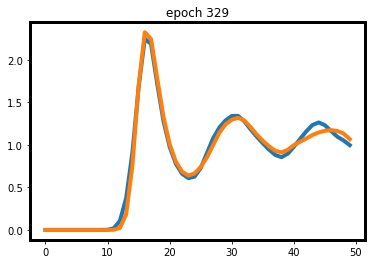

0.09673717617988586
1.843977 seconds


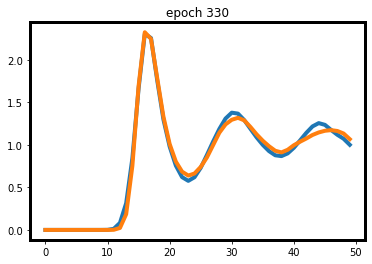

0.06556087732315063
1.886846 seconds


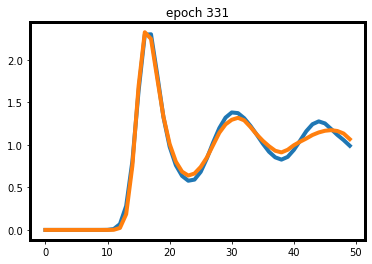

0.07799707353115082
1.916991 seconds


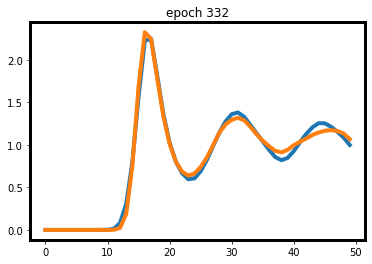

0.06908644735813141
1.840521 seconds


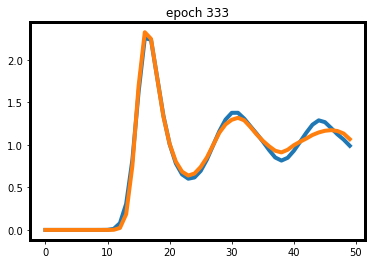

0.07719877362251282
1.895745 seconds


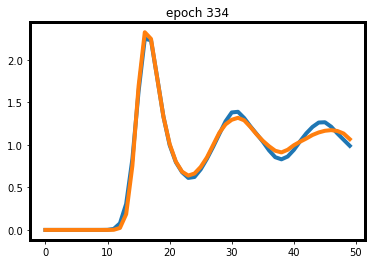

0.06616523861885071
1.89141 seconds


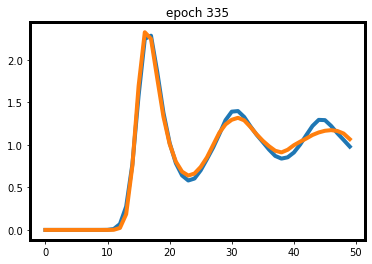

0.07981570065021515
1.842538 seconds


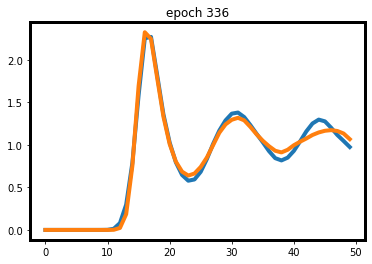

0.08988036215305328
1.893792 seconds


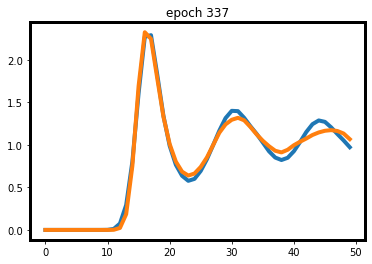

0.08745482563972473
1.884349 seconds


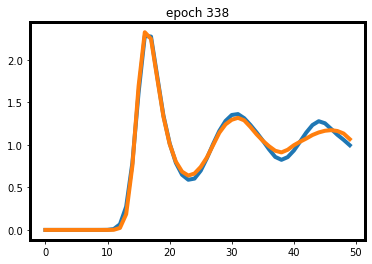

0.061613112688064575
1.838037 seconds


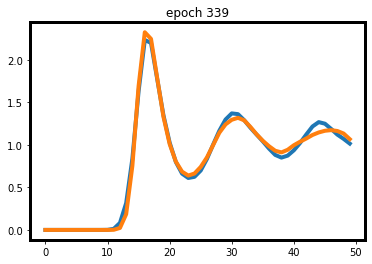

0.06187376379966736
1.871396 seconds


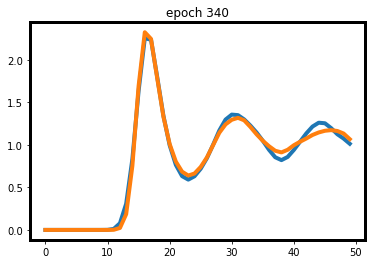

0.06419703364372253
1.838545 seconds


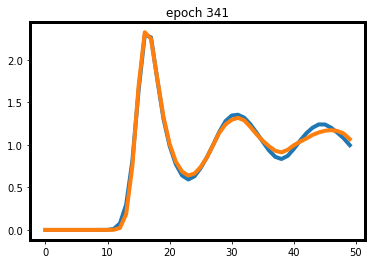

0.050928786396980286
1.917589 seconds


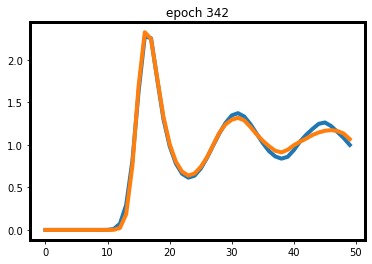

0.05186900496482849
1.837547 seconds


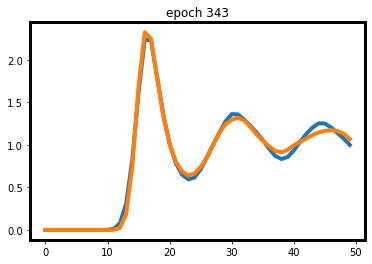

0.05926269292831421
1.885747 seconds


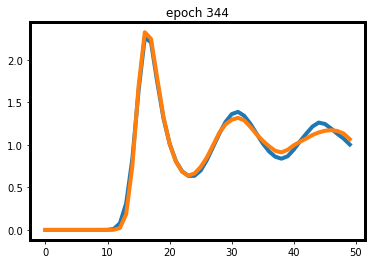

0.0634530633687973
1.891414 seconds


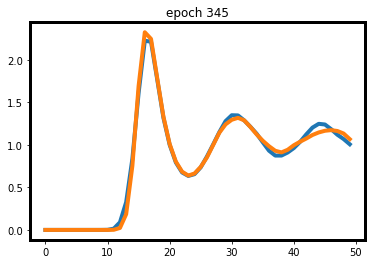

0.05443999171257019
1.905596 seconds


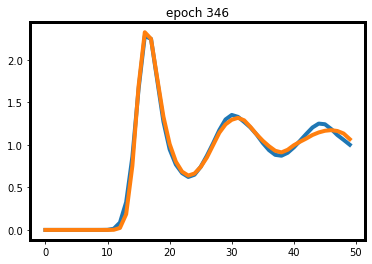

0.05882580578327179
1.988235 seconds


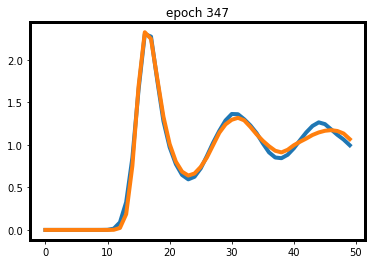

0.07052114605903625
1.858388 seconds


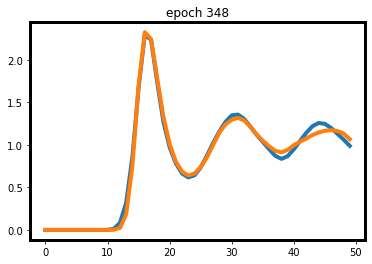

0.06278204917907715
1.951294 seconds


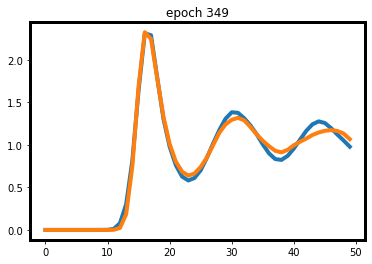

0.08229035139083862
1.891862 seconds


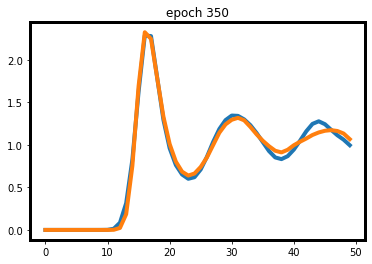

0.07369308173656464
1.843274 seconds


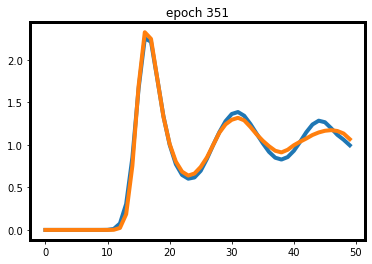

0.07831162214279175
1.929457 seconds


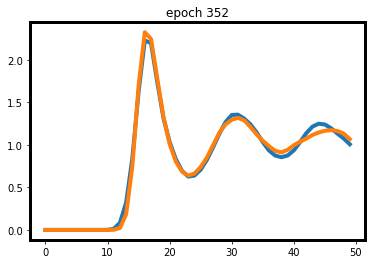

0.06203266978263855
1.826307 seconds


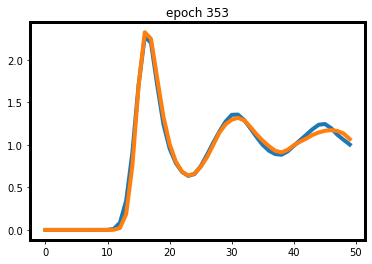

0.0690014660358429
1.88276 seconds


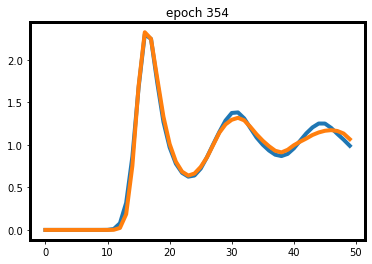

0.061045750975608826
1.874919 seconds


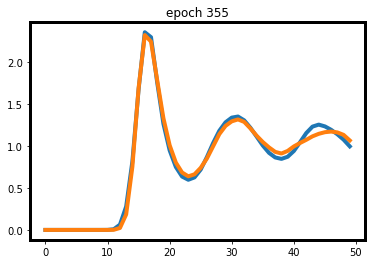

0.05841812491416931
1.867351 seconds


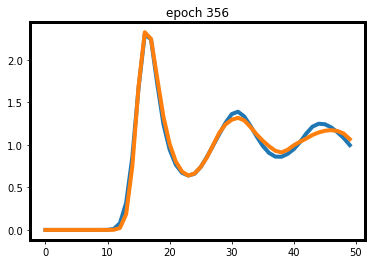

0.06658247113227844
1.830834 seconds


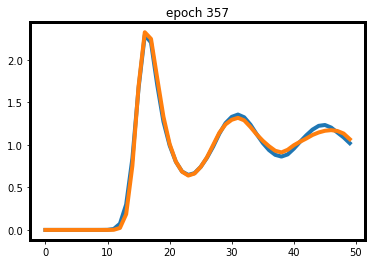

0.040567100048065186
1.877389 seconds


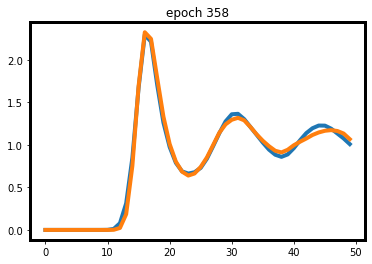

0.05016806721687317
1.957902 seconds


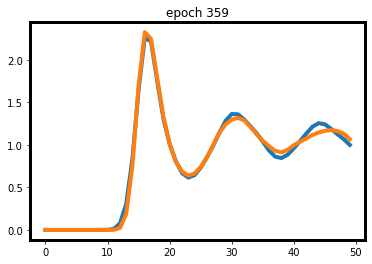

0.05214978754520416
1.887886 seconds


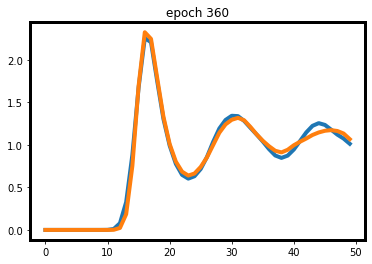

0.06632298231124878
1.901733 seconds


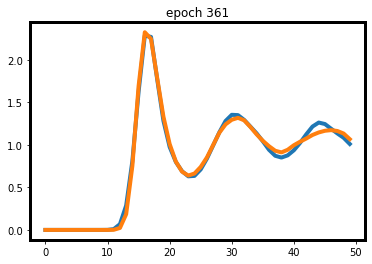

0.046926453709602356
1.912351 seconds


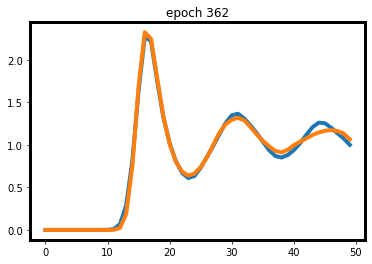

0.047019392251968384
1.87453 seconds


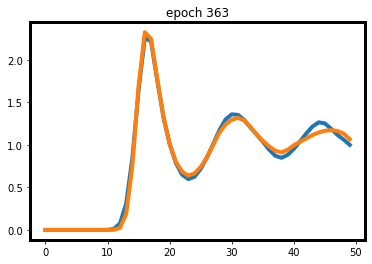

0.05891448259353638
1.881809 seconds


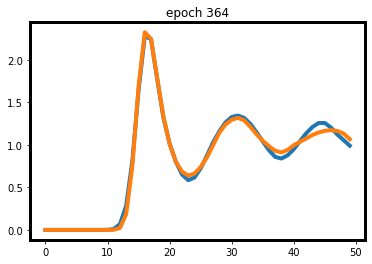

0.052525609731674194
1.860741 seconds


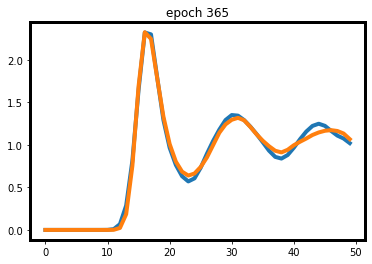

0.05767500400543213
1.886707 seconds


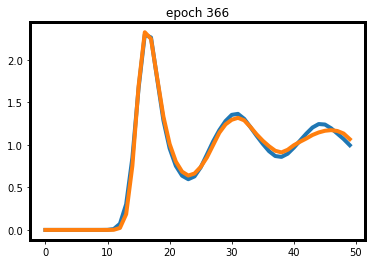

0.05562232434749603
1.919645 seconds


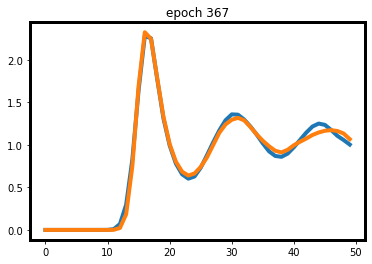

0.051976725459098816
1.884766 seconds


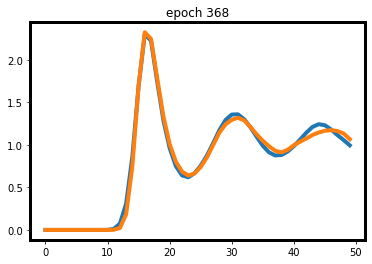

0.0586504191160202
1.874945 seconds


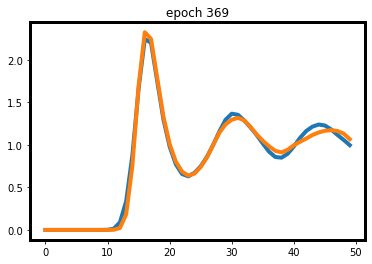

0.07042455673217773
1.8293 seconds


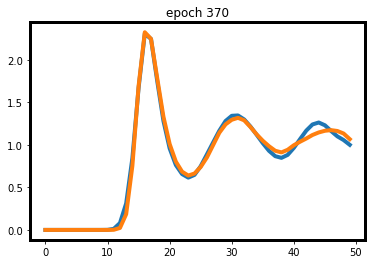

0.06440751254558563
1.938135 seconds


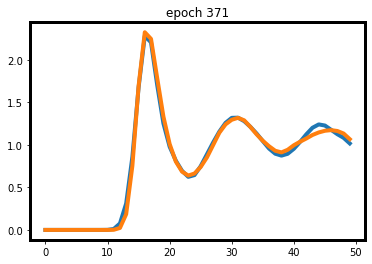

0.04784625768661499
1.846338 seconds


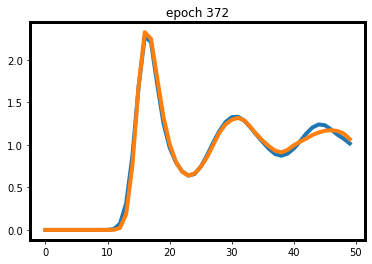

0.04929591715335846
1.876293 seconds


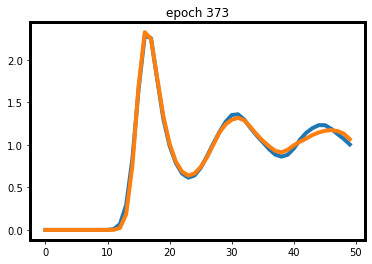

0.04112116992473602
1.88721 seconds


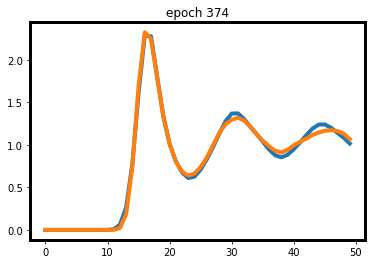

0.036434680223464966
1.816036 seconds


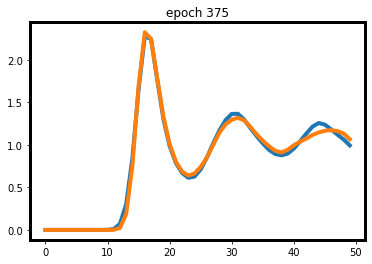

0.050618454813957214
1.80873 seconds


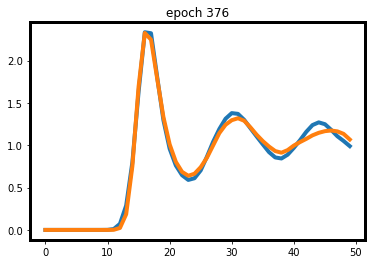

0.07035483419895172
1.962358 seconds


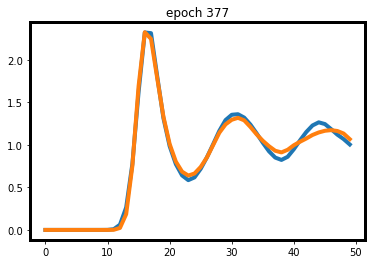

0.05758526921272278
1.756241 seconds


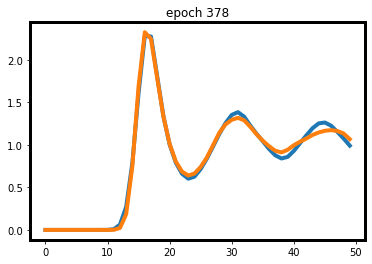

0.048052579164505005
1.775165 seconds


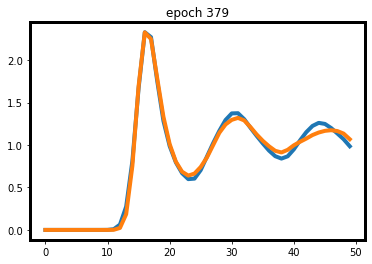

0.0559411495923996
1.904691 seconds


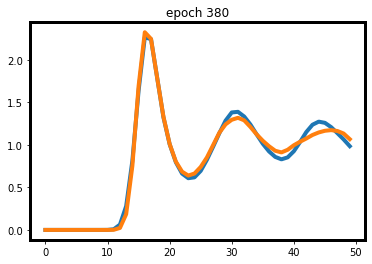

0.06720620393753052
1.889178 seconds


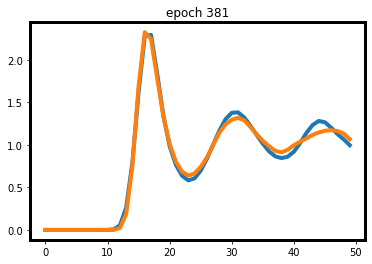

0.06583293527364731
1.968261 seconds


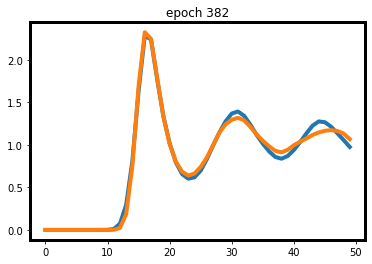

0.06620045006275177
1.897108 seconds


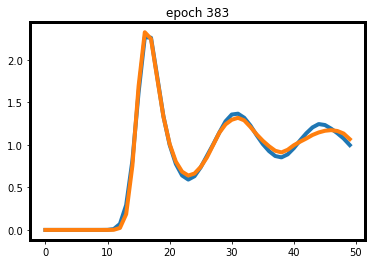

0.04929812252521515
1.869706 seconds


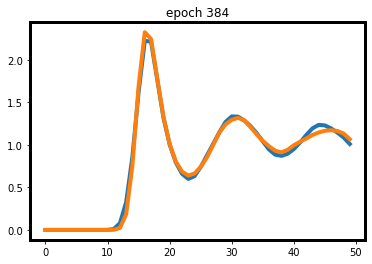

0.05133490264415741
1.878625 seconds


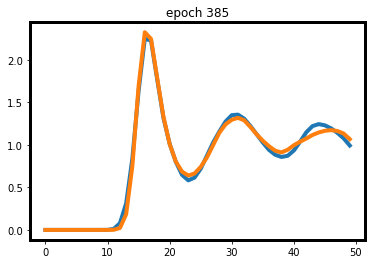

0.058515891432762146
1.863145 seconds


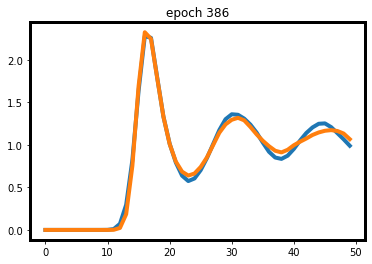

0.06113666296005249
1.845096 seconds


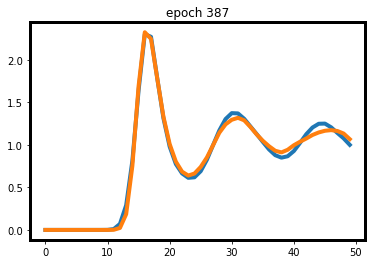

0.05236901342868805
1.771006 seconds


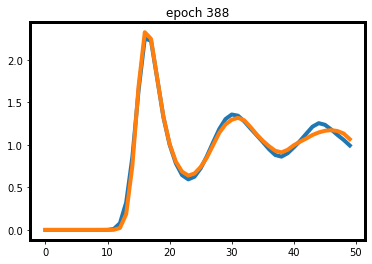

0.06015186011791229
1.841168 seconds


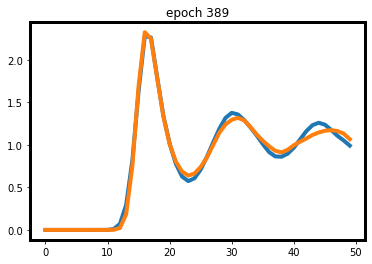

0.06545726954936981
1.866849 seconds


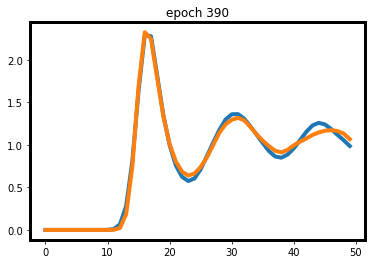

0.05965861678123474
1.833146 seconds


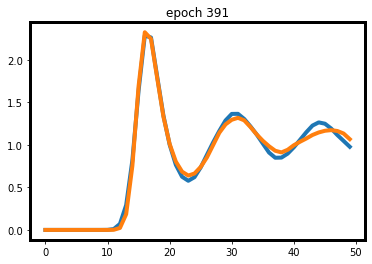

0.06454399228096008
1.8606 seconds


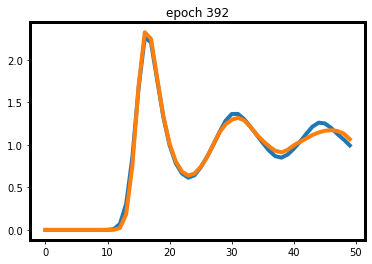

0.05569298565387726
1.870641 seconds


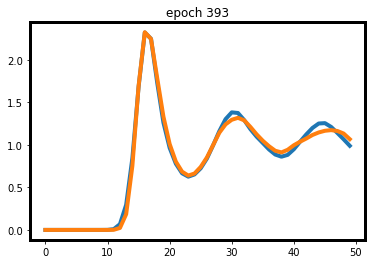

0.054240137338638306
1.824406 seconds


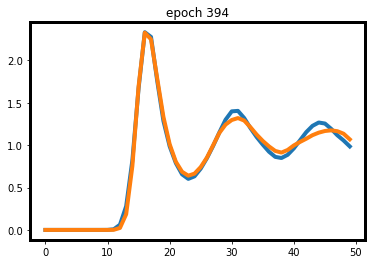

0.06165499985218048
1.95843 seconds


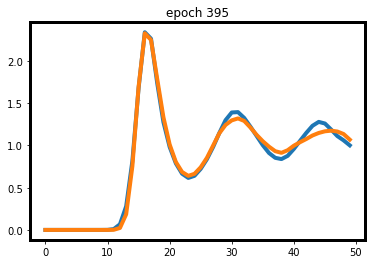

0.0637490451335907
2.221187 seconds


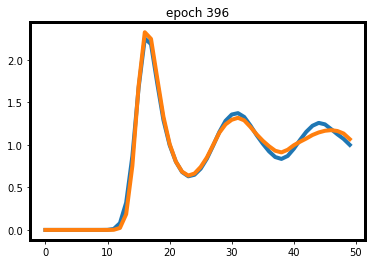

0.06912344694137573
1.791565 seconds


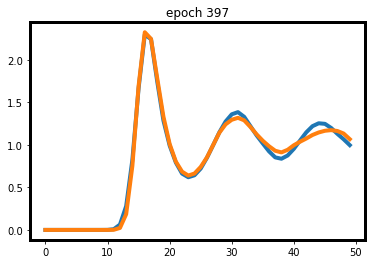

0.05287902057170868
1.875699 seconds


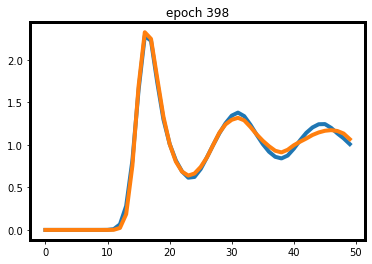

0.048219576478004456
1.844976 seconds


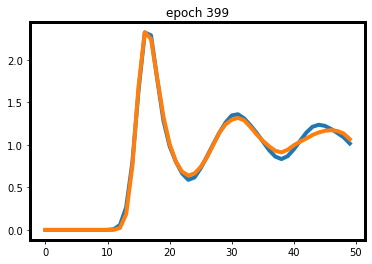

0.0410681813955307
1.89914 seconds


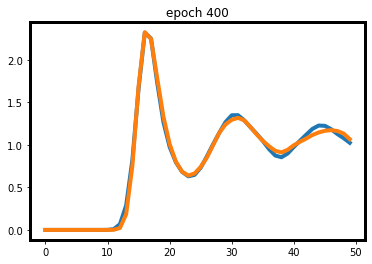

0.035347506403923035
1.808317 seconds


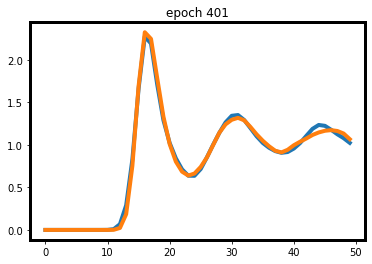

0.03585280478000641
1.861268 seconds


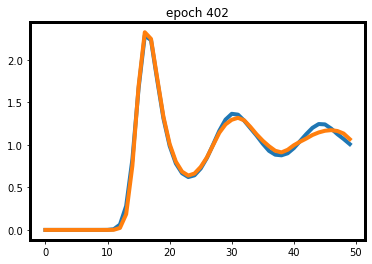

0.040486156940460205
1.860364 seconds


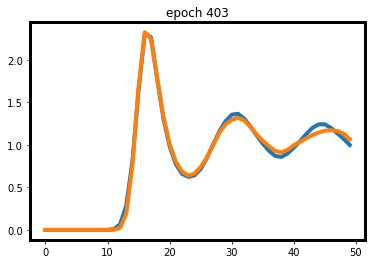

0.04015611112117767
1.807634 seconds


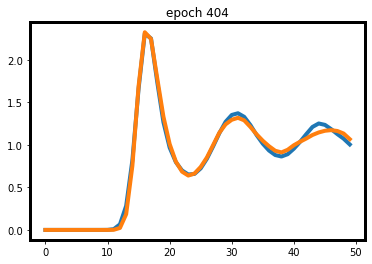

0.044163525104522705
1.901634 seconds


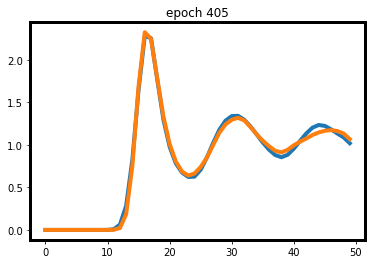

0.03906741738319397
1.903503 seconds


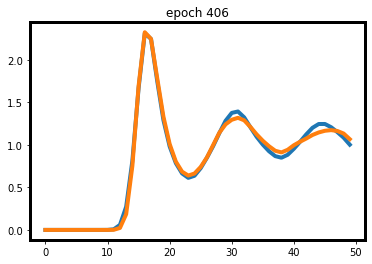

0.044951289892196655
1.900119 seconds


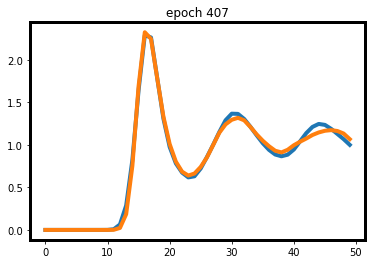

0.045040443539619446
1.906298 seconds


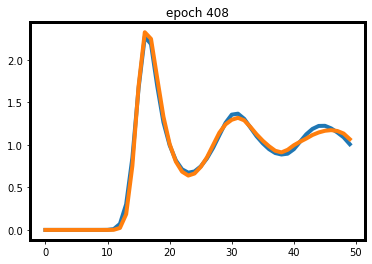

0.04572606086730957
1.847139 seconds


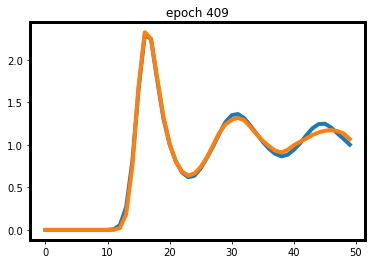

0.034956276416778564
1.89471 seconds


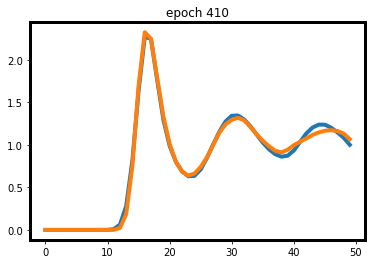

0.03920932114124298
2.009202 seconds


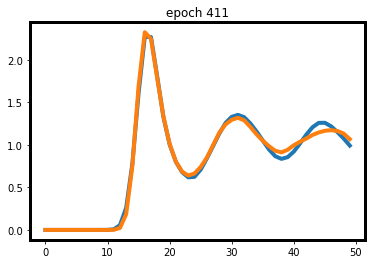

0.047487884759902954
1.885559 seconds


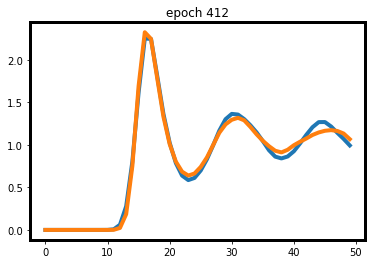

0.05989775061607361
1.897787 seconds


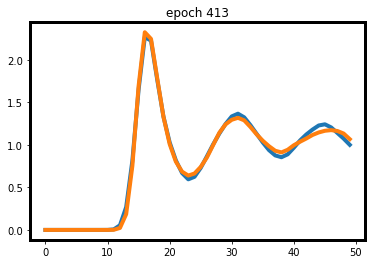

0.03593650460243225
1.842944 seconds


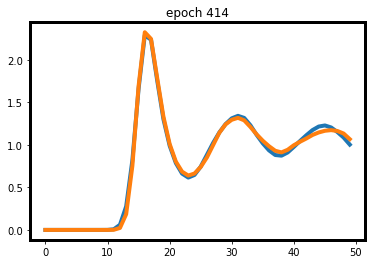

0.029282718896865845
1.882471 seconds


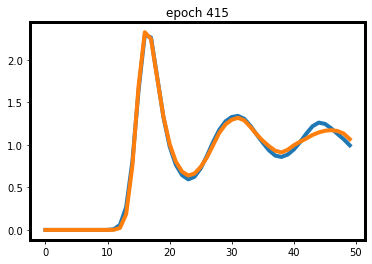

0.04526090621948242
1.80594 seconds


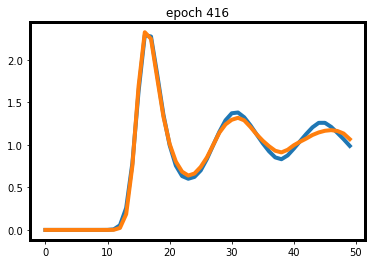

0.053687795996665955
1.886207 seconds


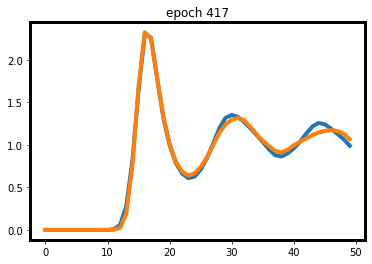

0.04384991526603699
1.917038 seconds


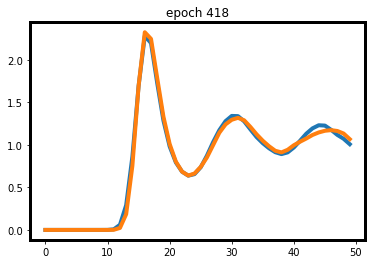

0.04036884009838104
1.908496 seconds


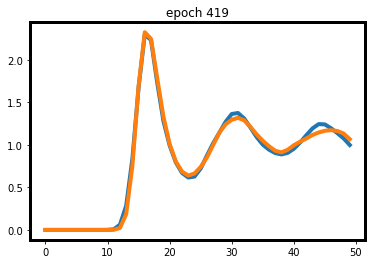

0.04094609618186951
1.824179 seconds


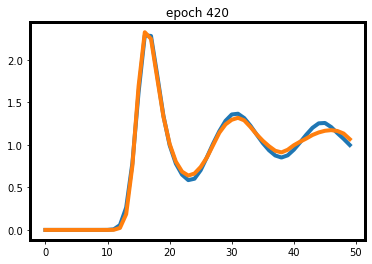

0.04716982692480087
1.925975 seconds


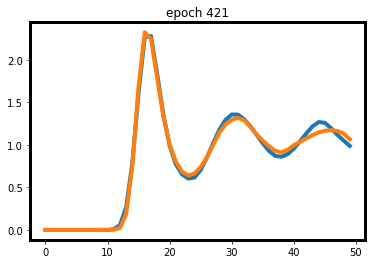

0.05221197009086609
1.887559 seconds


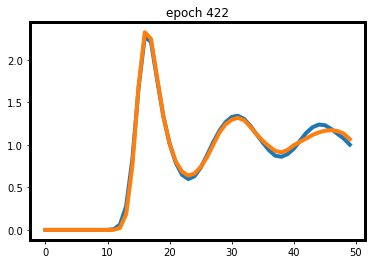

0.04114916920661926
1.933865 seconds


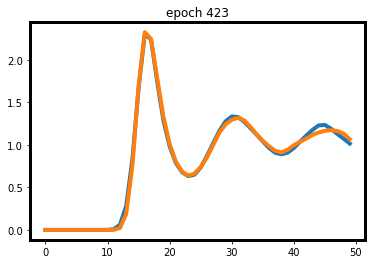

0.029352128505706787
1.915895 seconds


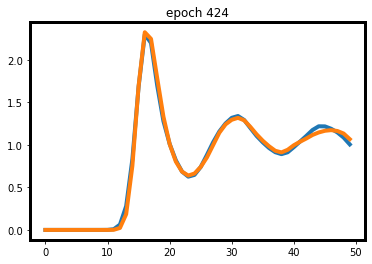

0.029743775725364685
1.831138 seconds


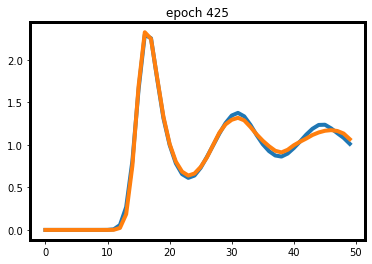

0.034612029790878296
1.901613 seconds


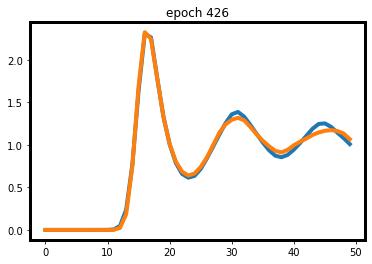

0.03413897752761841
1.787673 seconds


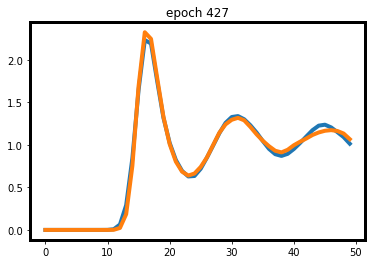

0.03686648607254028
1.801458 seconds


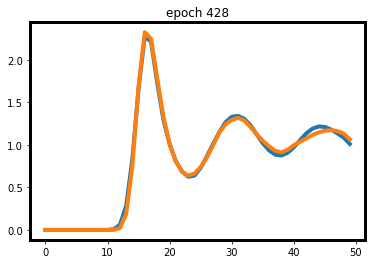

0.032994166016578674
1.867636 seconds


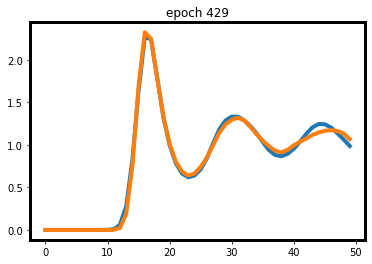

0.04133807122707367
1.872797 seconds


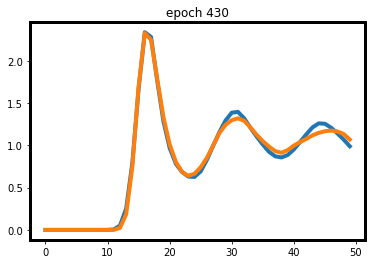

0.04847124218940735
1.937033 seconds


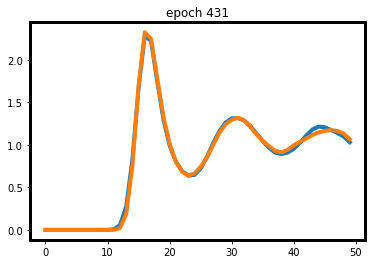

0.02219066023826599
1.88826 seconds


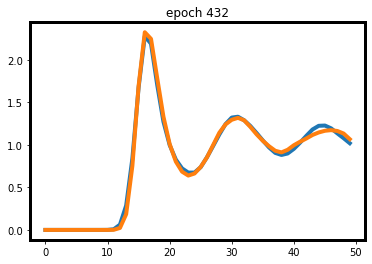

0.03529796004295349
1.903244 seconds


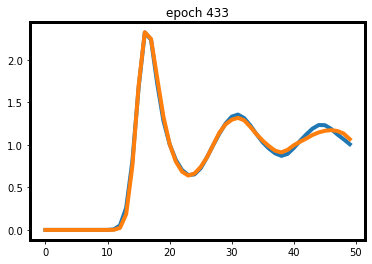

0.02963005006313324
1.852039 seconds


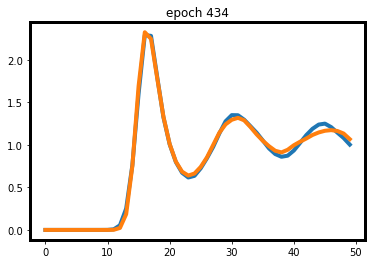

0.033930957317352295
1.843831 seconds


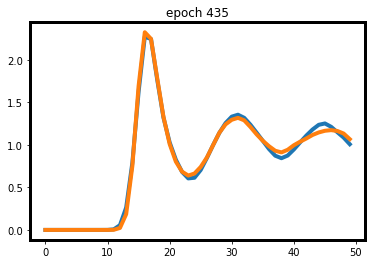

0.03682221472263336
1.849931 seconds


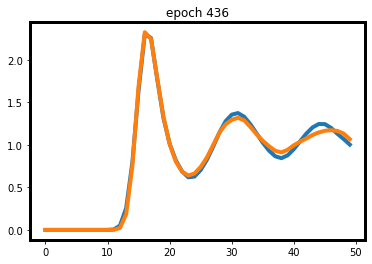

0.04077015817165375
1.794861 seconds


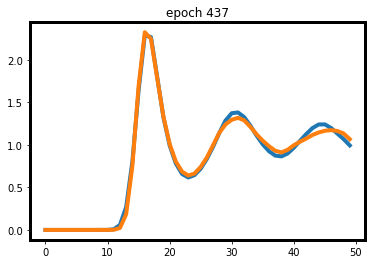

0.04136770963668823
1.903552 seconds


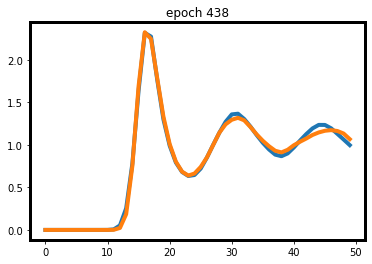

0.03099217265844345
1.868012 seconds


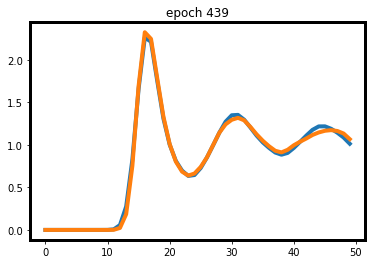

0.026786521077156067
1.902252 seconds


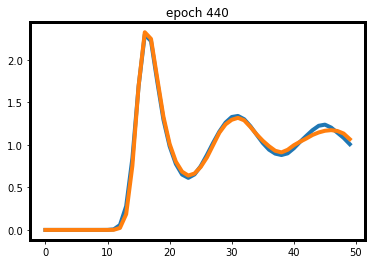

0.03242994844913483
2.020944 seconds


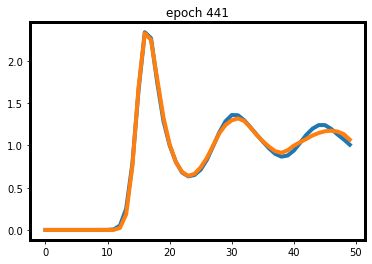

0.031329281628131866
1.955235 seconds


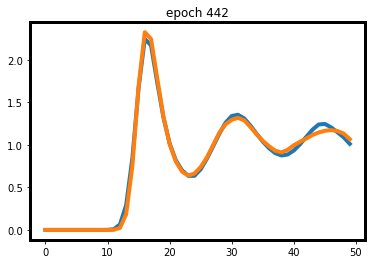

0.04085838794708252
1.91809 seconds


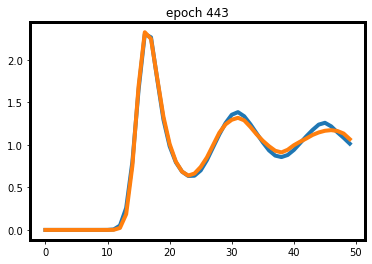

0.037487298250198364
1.749378 seconds


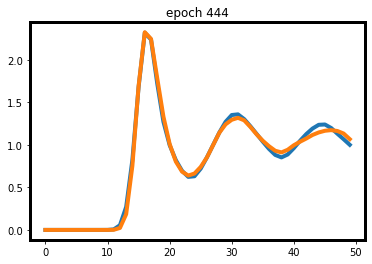

0.03764030337333679
1.830673 seconds


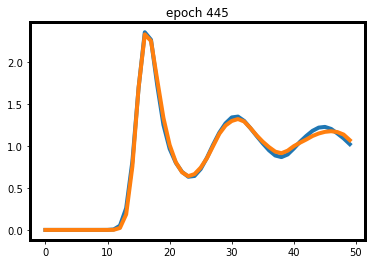

0.028850942850112915
1.840728 seconds


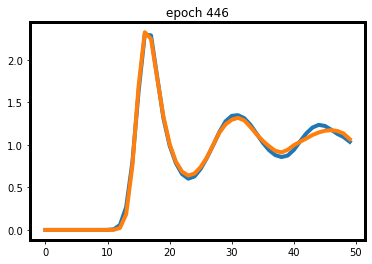

0.035907551646232605
1.915944 seconds


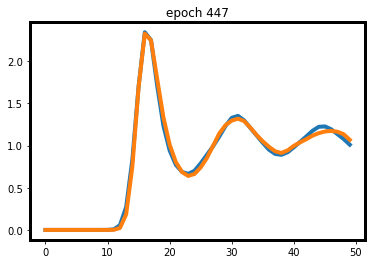

0.03723639249801636
1.786431 seconds


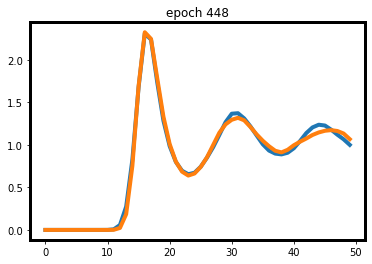

0.03849367797374725
1.872226 seconds


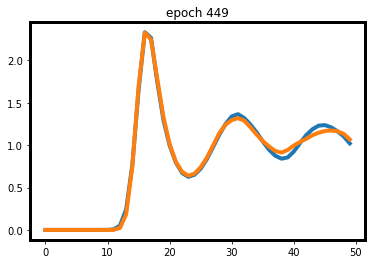

0.032077088952064514
1.818888 seconds


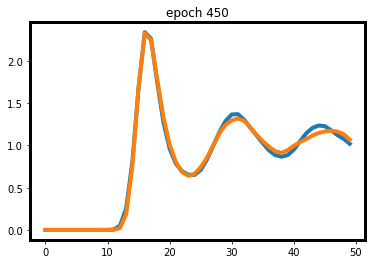

0.036116406321525574
1.925894 seconds


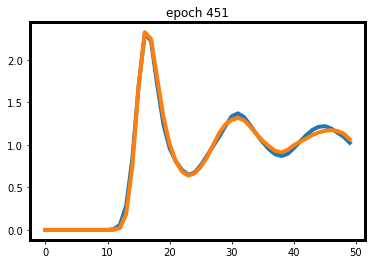

0.03688175976276398
1.870239 seconds


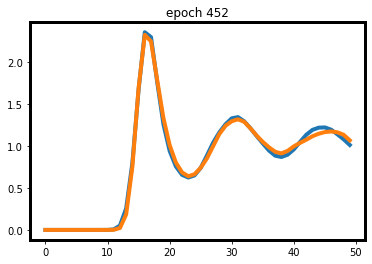

0.03299561142921448
1.919423 seconds


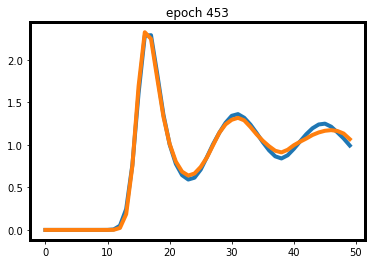

0.04220351576805115
1.789208 seconds


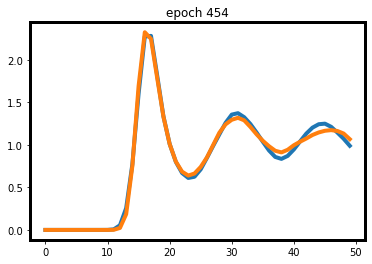

0.04588460922241211
1.932712 seconds


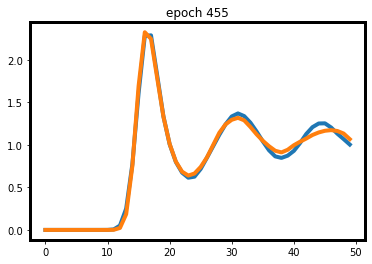

0.04446005821228027
1.920183 seconds


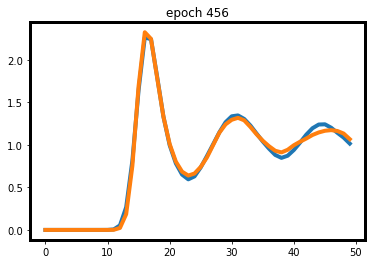

0.03687681257724762
1.834044 seconds


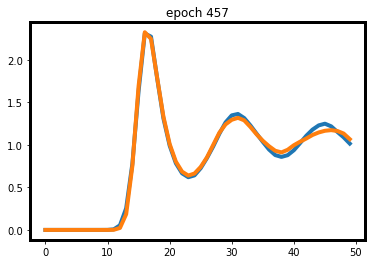

0.030911460518836975
1.873363 seconds


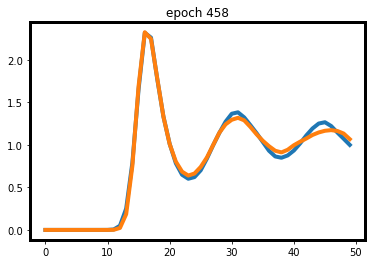

0.04340767860412598
1.930625 seconds


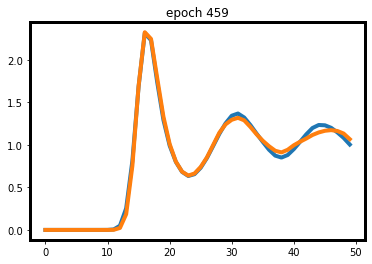

0.032407015562057495
1.862225 seconds


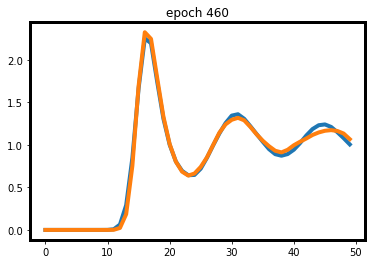

0.03967735171318054
1.780313 seconds


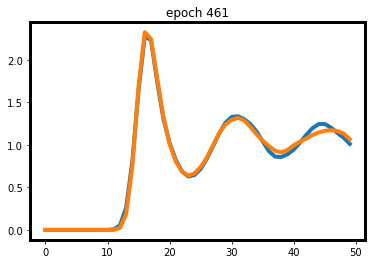

0.03585390746593475
1.898474 seconds


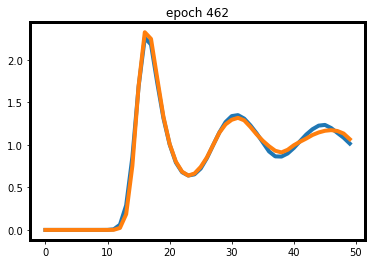

0.04072830080986023
1.844413 seconds


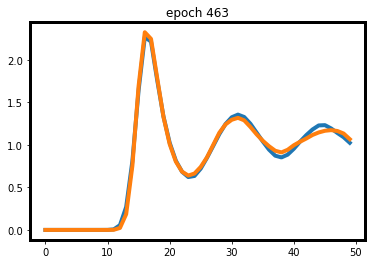

0.03197529911994934
1.933855 seconds


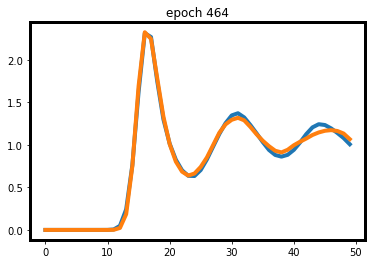

0.03384634852409363
2.287051 seconds


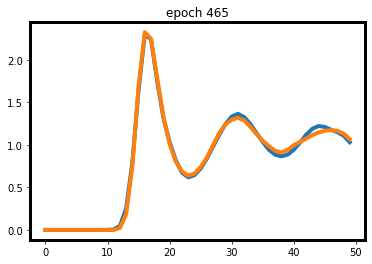

0.02565784752368927
1.890859 seconds


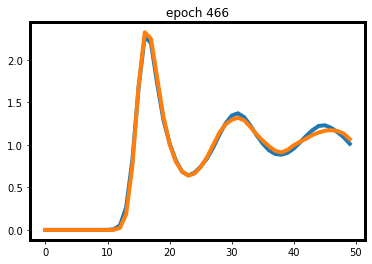

0.02992670238018036
1.939282 seconds


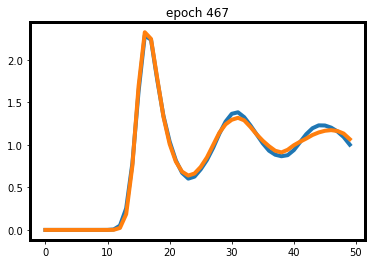

0.036379262804985046
1.808624 seconds


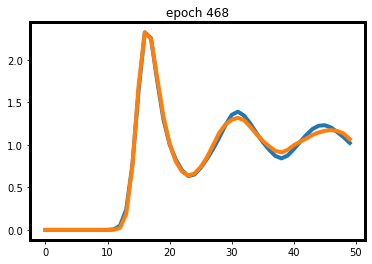

0.032876938581466675
1.869229 seconds


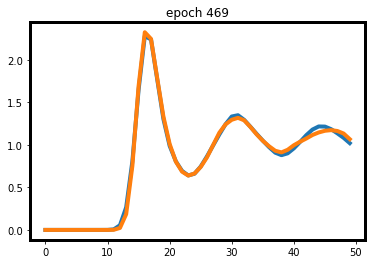

0.02254149317741394
1.70805 seconds


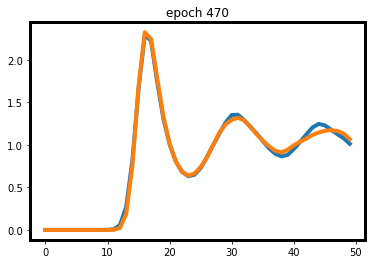

0.03258602321147919
1.816377 seconds


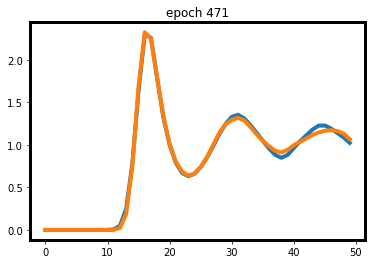

0.02342568337917328
1.819848 seconds


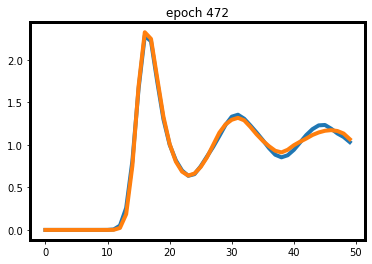

0.029044196009635925
1.905702 seconds


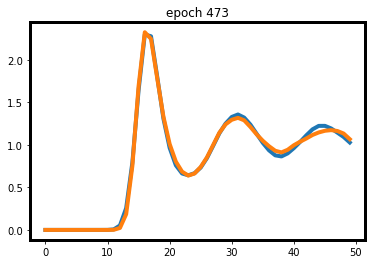

0.026704683899879456
1.804804 seconds


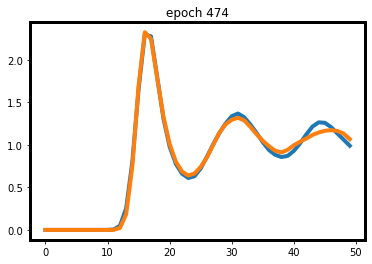

0.044122666120529175
1.901379 seconds


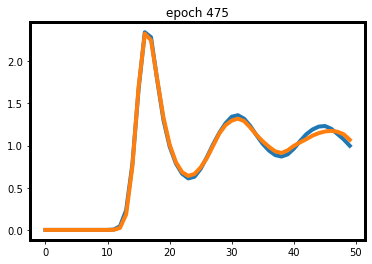

0.027225330471992493
1.85539 seconds


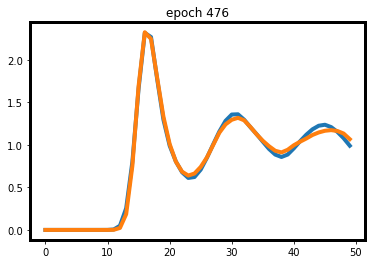

0.0314333438873291
1.90977 seconds


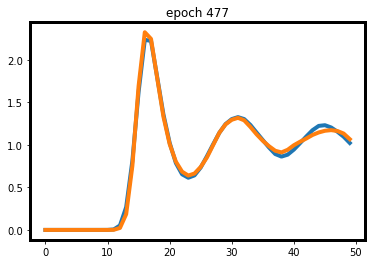

0.02929854393005371
1.827185 seconds


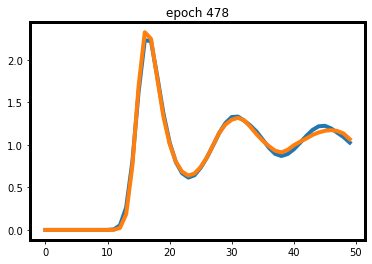

0.027860209345817566
1.949065 seconds


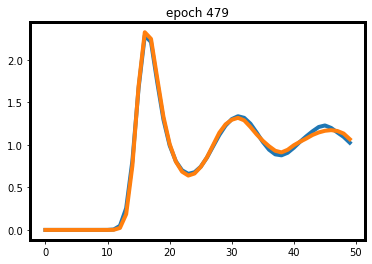

0.021925583481788635
1.828218 seconds


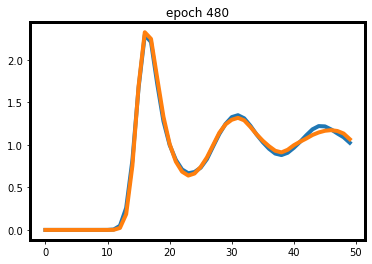

0.025419682264328003
1.760047 seconds


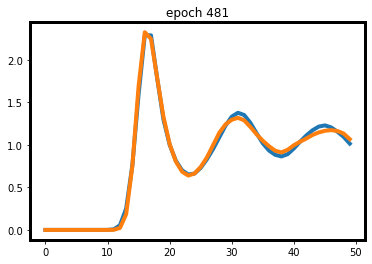

0.03244023025035858
1.887455 seconds


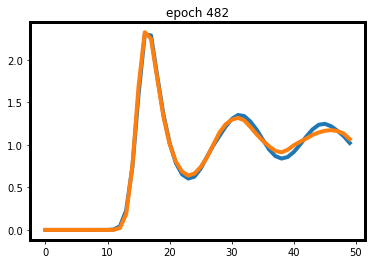

0.03952687978744507
1.838406 seconds


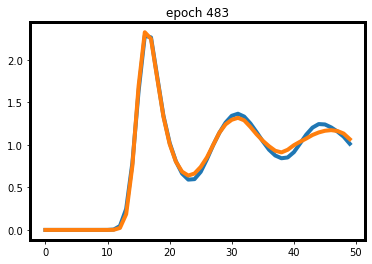

0.04405052959918976
1.850114 seconds


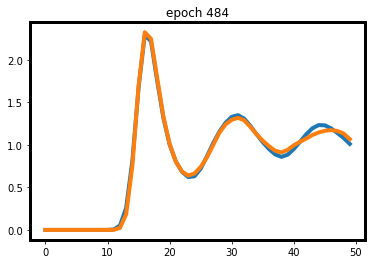

0.029905959963798523
1.859184 seconds


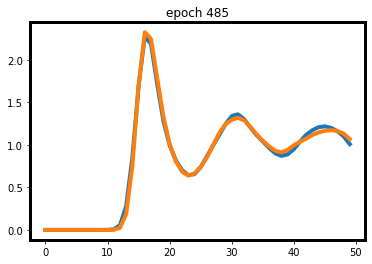

0.032822757959365845
1.950198 seconds


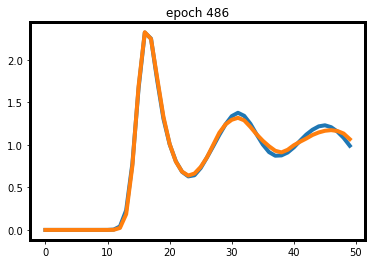

0.026683583855628967
1.90652 seconds


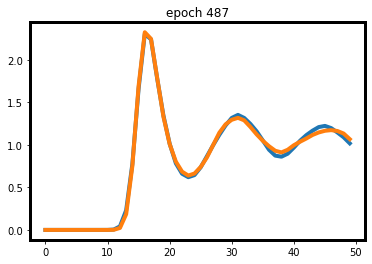

0.020010292530059814
1.912994 seconds


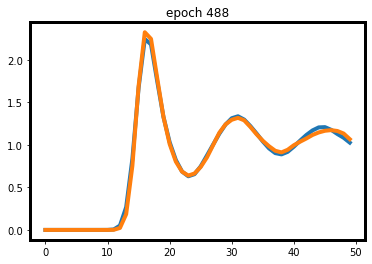

0.023994192481040955
1.852373 seconds


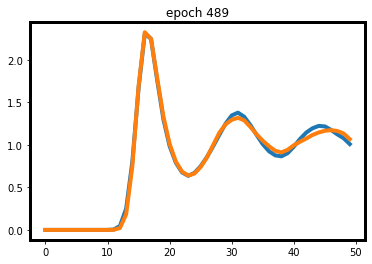

0.030754253268241882
1.887792 seconds


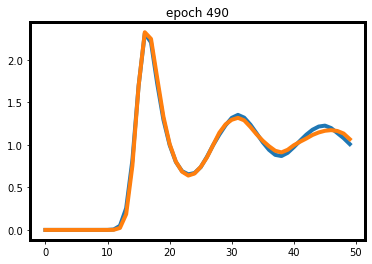

0.026165366172790527
1.894524 seconds


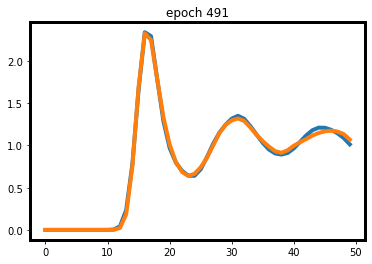

0.0179431289434433
1.870985 seconds


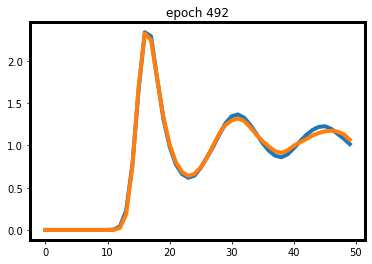

0.02505781501531601
1.85382 seconds


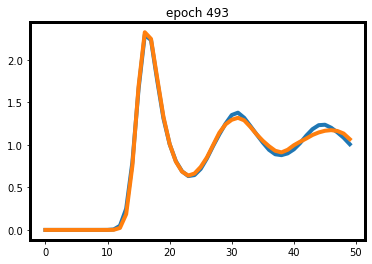

0.026998236775398254
1.928311 seconds


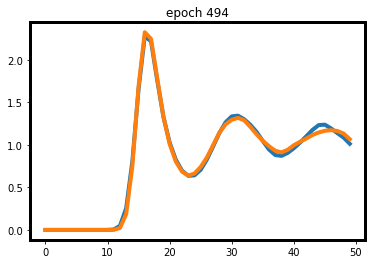

0.026829630136489868
1.895728 seconds


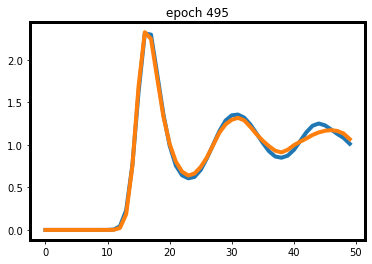

0.04315793514251709
1.81417 seconds


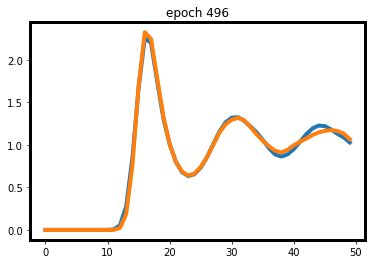

0.03128527104854584
1.945453 seconds


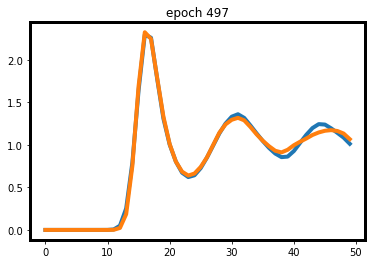

0.03148391842842102
1.869326 seconds


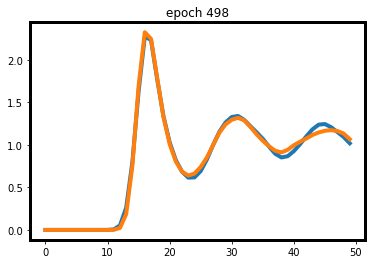

0.03405386209487915
1.977755 seconds


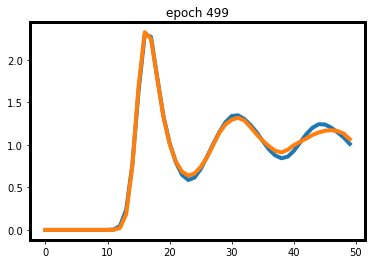

0.03606247901916504
1.851079 seconds


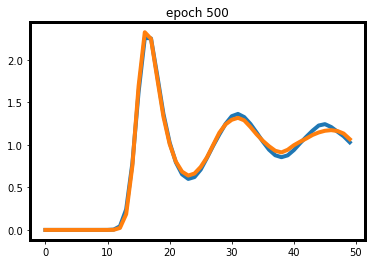

0.031570762395858765
1.782202 seconds


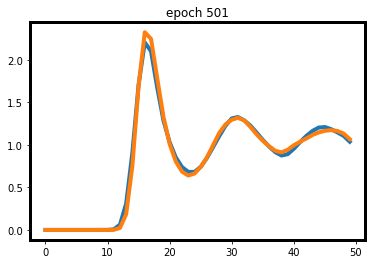

0.05776435136795044
1.822894 seconds


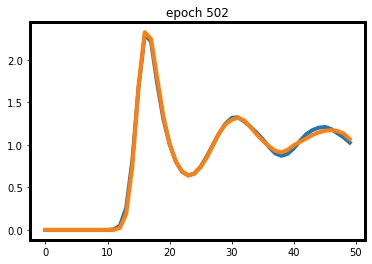

0.021386131644248962
1.93145 seconds


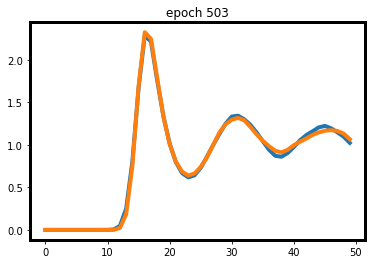

0.02114805579185486
1.904176 seconds


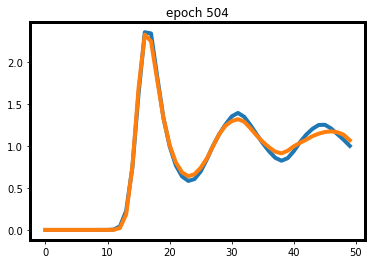

0.052350521087646484
1.837343 seconds


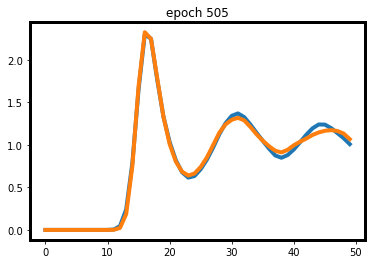

0.031532302498817444
1.881061 seconds


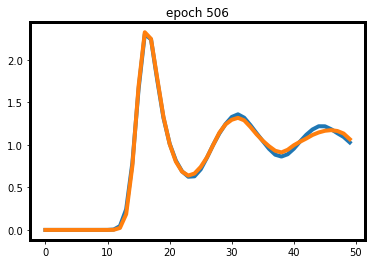

0.021565064787864685
1.868678 seconds


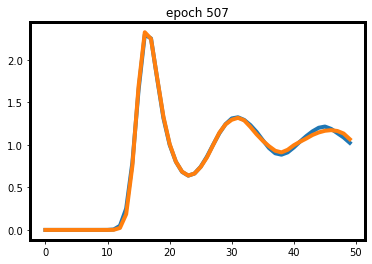

0.015003077685832977
1.777396 seconds


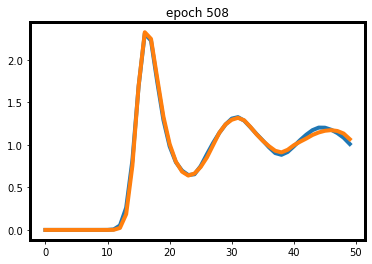

0.020174071192741394
1.871471 seconds


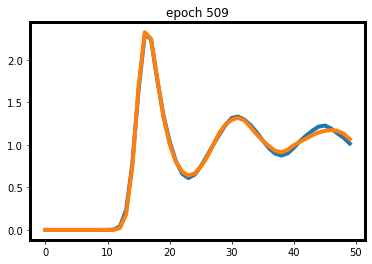

0.018755316734313965
1.871096 seconds


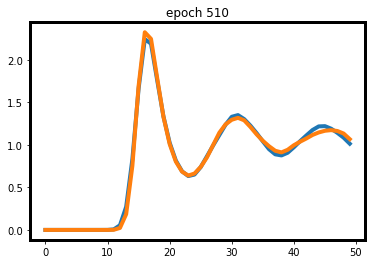

0.028206363320350647
1.930128 seconds


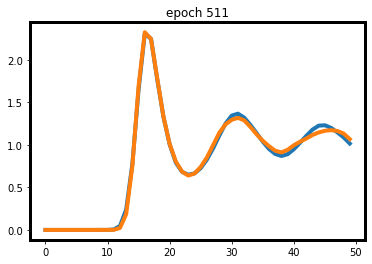

0.02348986268043518
1.909146 seconds


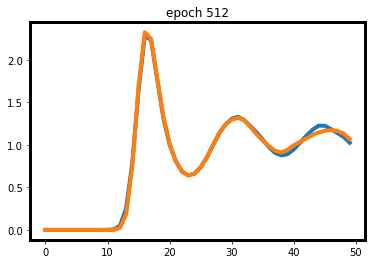

0.020099326968193054
1.83216 seconds


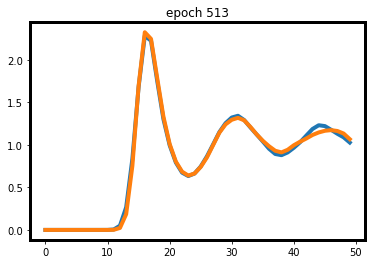

0.024928003549575806
1.902646 seconds


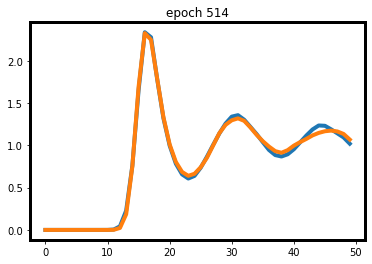

0.0226241797208786
1.848428 seconds


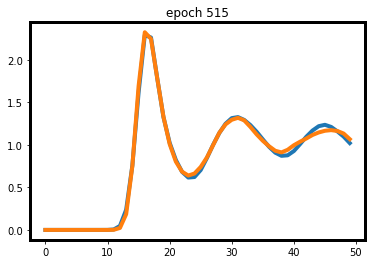

0.02370329201221466
1.963756 seconds


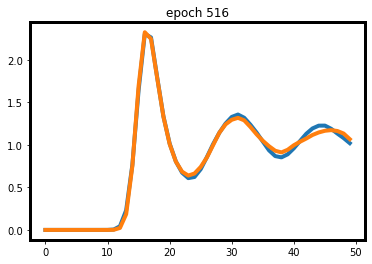

0.02683868259191513
1.887795 seconds


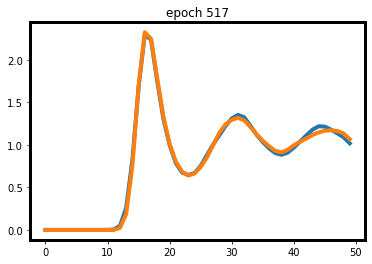

0.02199140191078186
1.820614 seconds


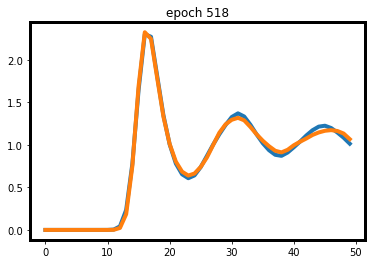

0.022392474114894867
1.89164 seconds


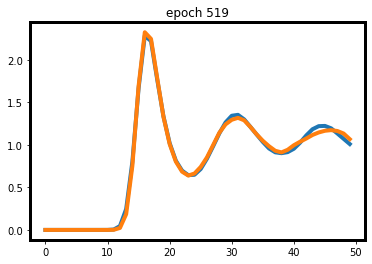

0.0215437114238739
1.872776 seconds


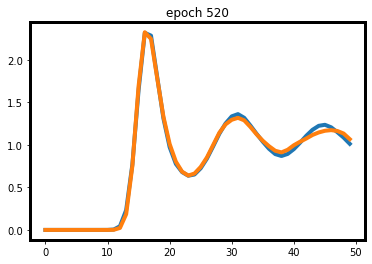

0.02292851358652115
1.926799 seconds


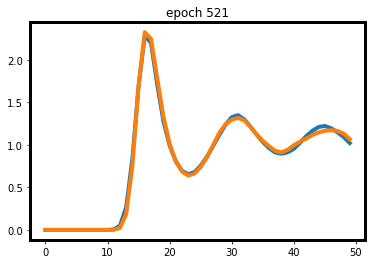

0.025093913078308105
1.884913 seconds


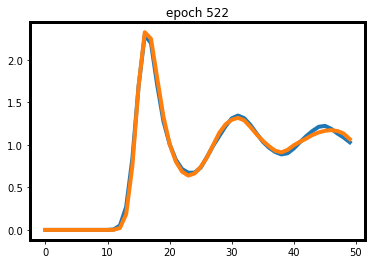

0.028541013598442078
2.008424 seconds


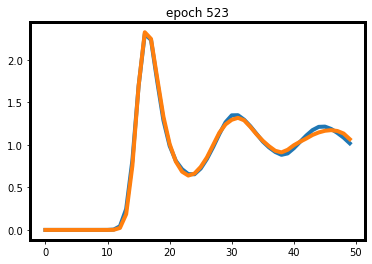

0.020894944667816162
1.901738 seconds


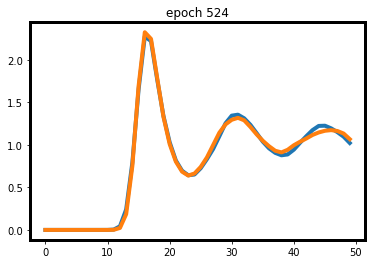

0.023169785737991333
1.939336 seconds


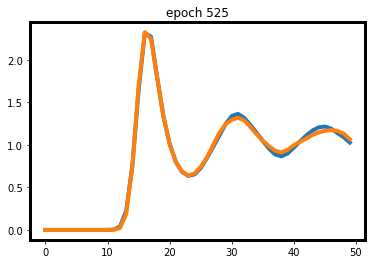

0.01692184805870056
1.937905 seconds


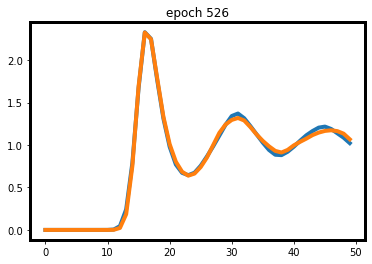

0.01917455345392227
1.87783 seconds


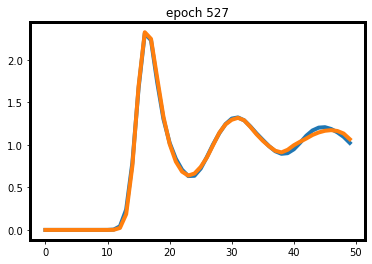

0.015183433890342712
1.758699 seconds


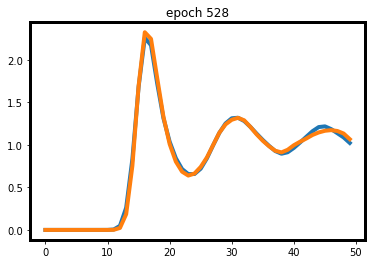

0.023730680346488953
1.905579 seconds


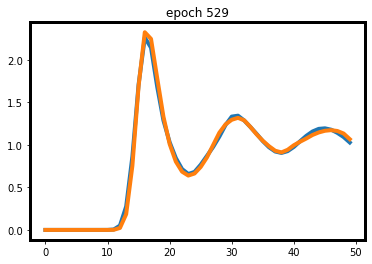

0.03283163905143738
1.875094 seconds


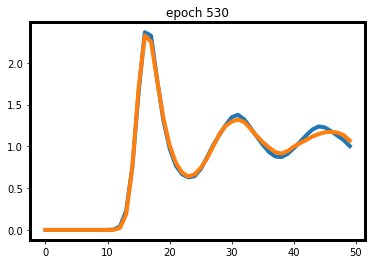

0.03047734498977661
1.920022 seconds


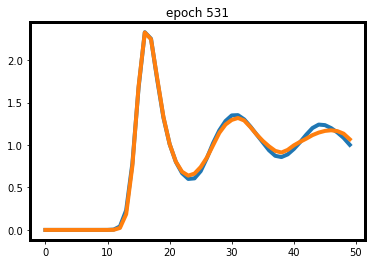

0.031707458198070526
1.841303 seconds


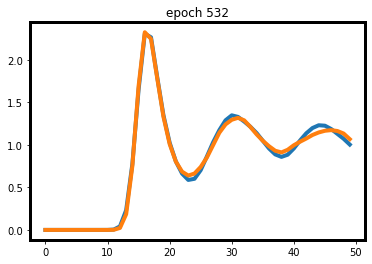

0.031963787972927094
1.842597 seconds


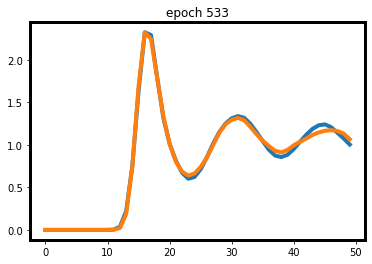

0.02778586745262146
2.278992 seconds


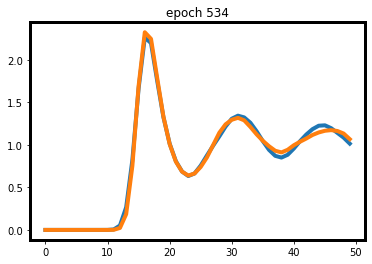

0.03401704132556915
1.924904 seconds


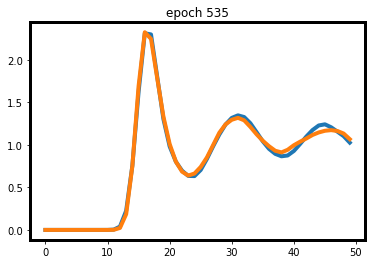

0.02608068287372589
1.908732 seconds


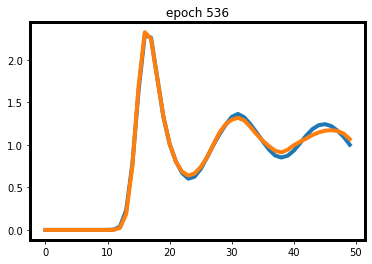

0.030804187059402466
1.889834 seconds


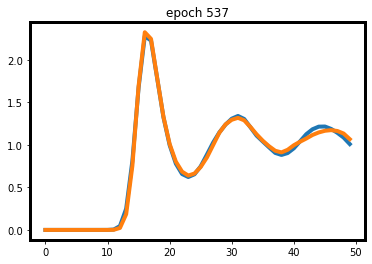

0.021390199661254883
1.914012 seconds


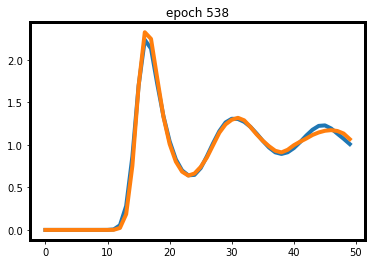

0.03797152638435364
1.890614 seconds


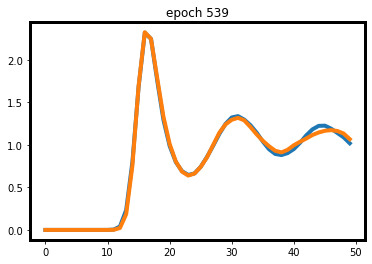

0.01904173195362091
1.823821 seconds


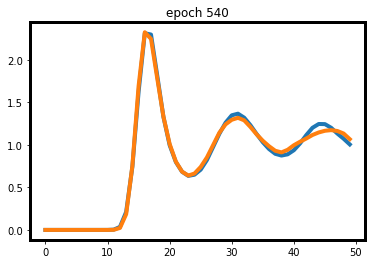

0.029916130006313324
1.78091 seconds


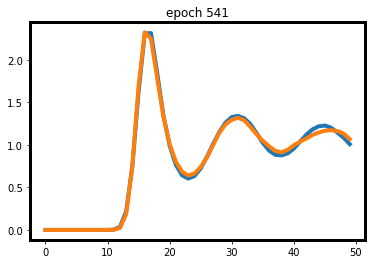

0.026457637548446655
1.848214 seconds


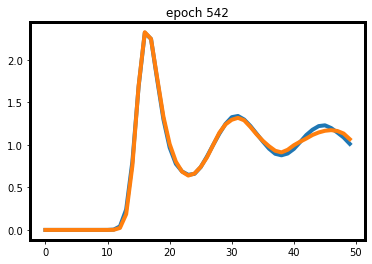

0.020667627453804016
1.902554 seconds


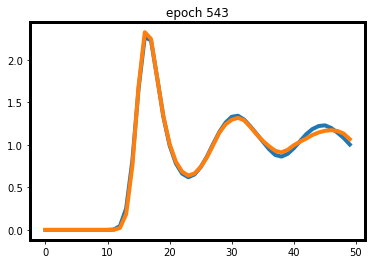

0.02672158181667328
1.837373 seconds


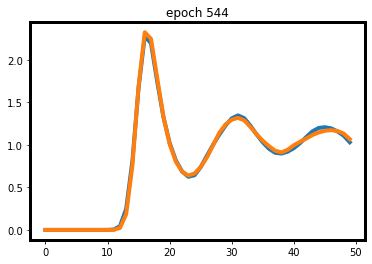

0.01565985381603241
1.872687 seconds


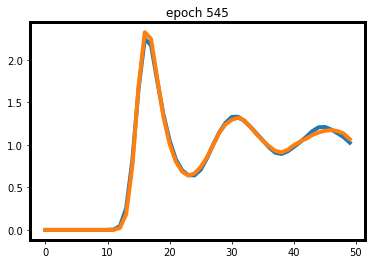

0.02107366919517517
1.888864 seconds


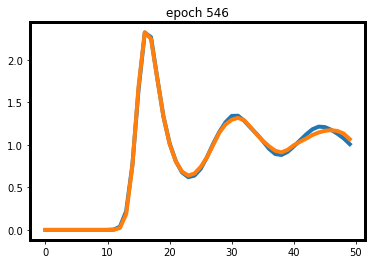

0.016660422086715698
1.797515 seconds


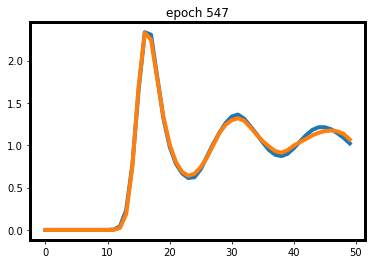

0.021871939301490784
1.695752 seconds


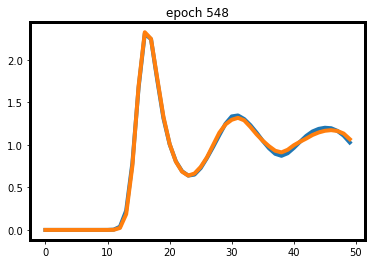

0.012215174734592438
1.824196 seconds


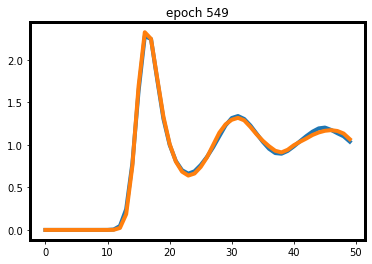

0.01446235179901123
1.940099 seconds


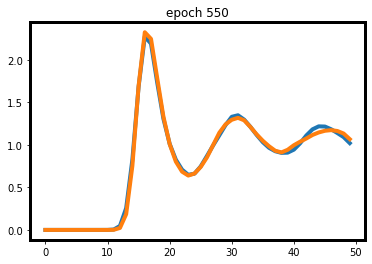

0.0239601731300354
1.786868 seconds


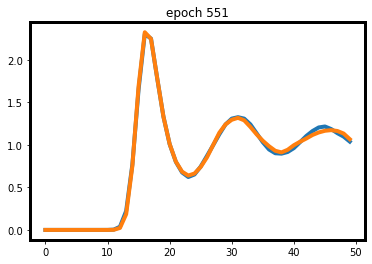

0.011673450469970703
1.959061 seconds


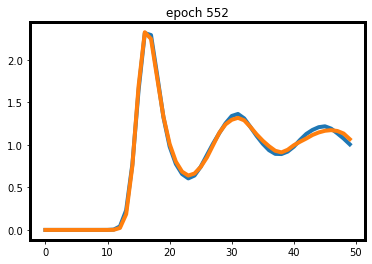

0.02260083705186844
1.966573 seconds


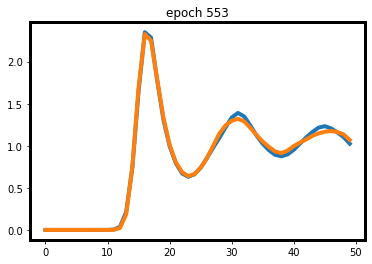

0.021214395761489868
1.804419 seconds


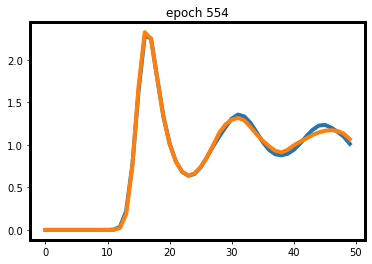

0.02255237102508545
1.967284 seconds


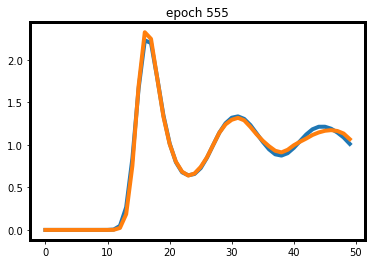

0.027867421507835388
1.856021 seconds


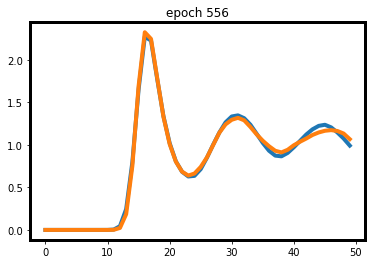

0.027972236275672913
1.913998 seconds


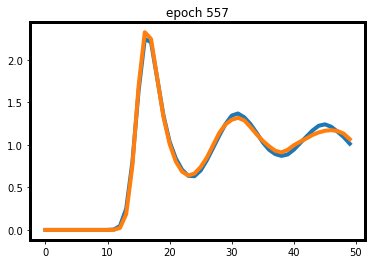

0.03228524327278137
1.874443 seconds


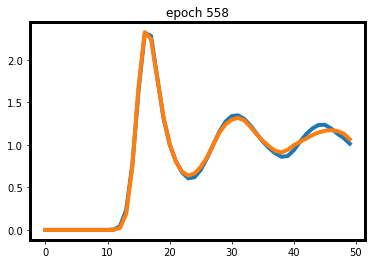

0.028537139296531677
1.8966 seconds


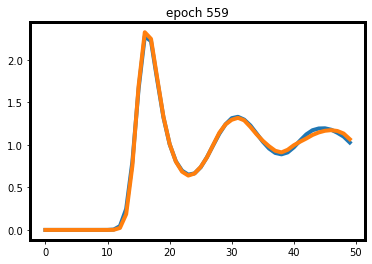

0.014575928449630737
1.904463 seconds


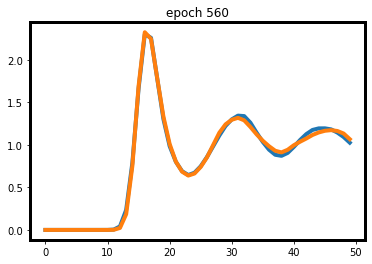

0.018135786056518555
1.902052 seconds


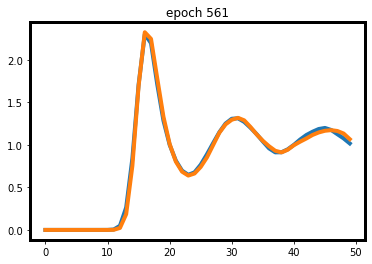

0.022711485624313354
1.84826 seconds


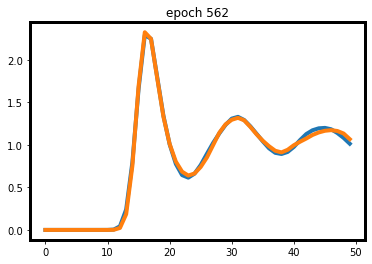

0.01719570904970169
1.8488 seconds


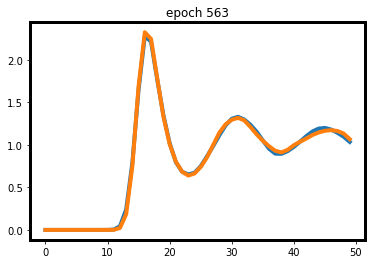

0.012881755828857422
1.782929 seconds


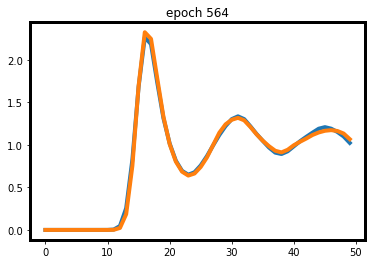

0.017079263925552368
1.845753 seconds


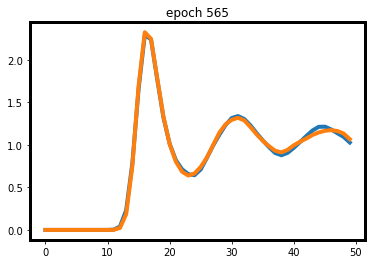

0.01471596211194992
1.925231 seconds


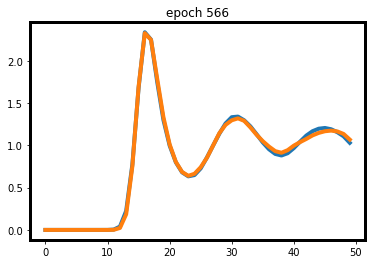

0.012130357325077057
1.920616 seconds


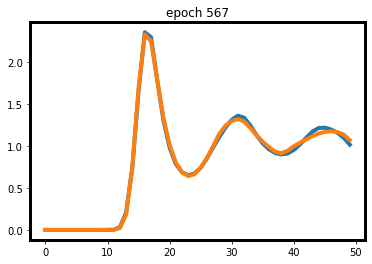

0.015603631734848022
1.651876 seconds


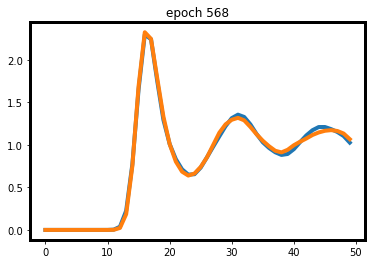

0.017359159886837006
1.865029 seconds


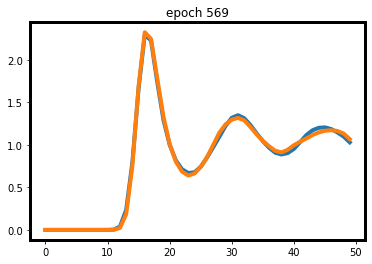

0.017399683594703674
1.894853 seconds


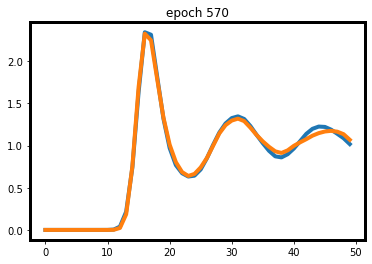

0.02619348093867302
1.810126 seconds


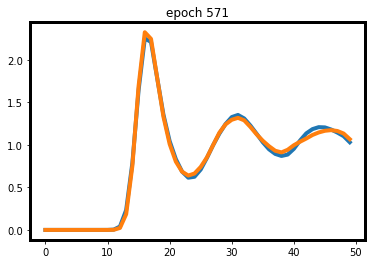

0.02327868342399597
1.852625 seconds


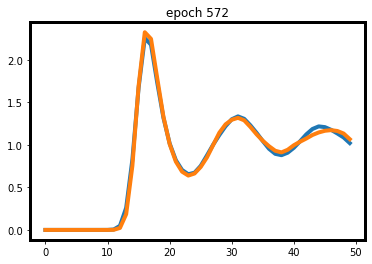

0.026384934782981873
1.846861 seconds


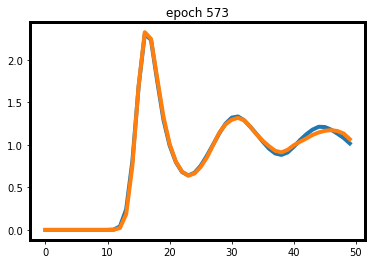

0.017880991101264954
1.964038 seconds


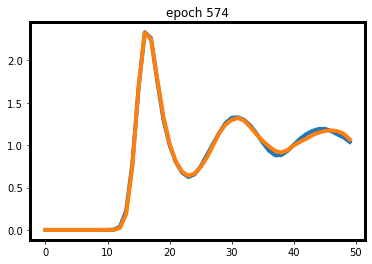

0.014418266713619232
1.814714 seconds


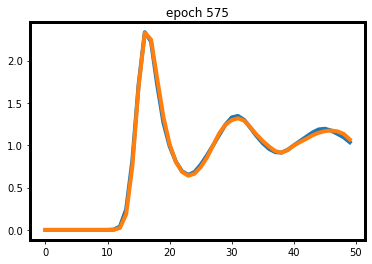

0.016793757677078247
1.851785 seconds


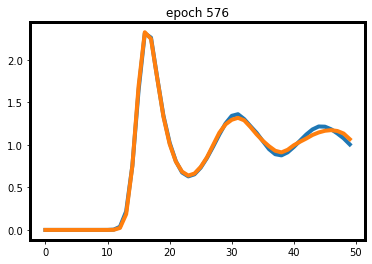

0.0181293785572052
1.923569 seconds


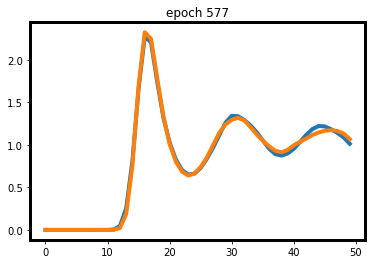

0.02553550899028778
1.826218 seconds


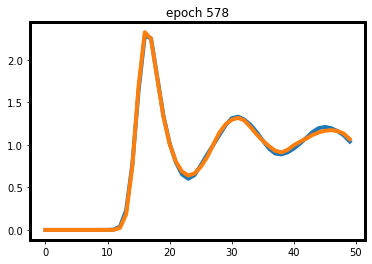

0.013807140290737152
1.888018 seconds


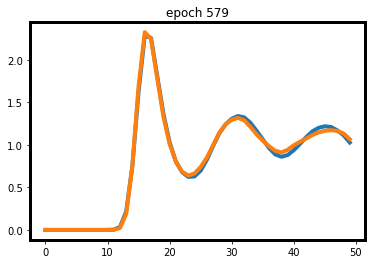

0.020753301680088043
1.898407 seconds


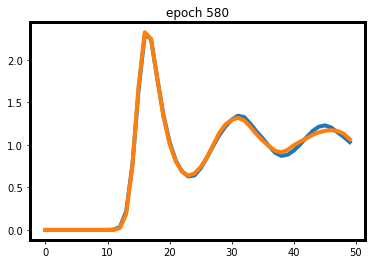

0.01828133314847946
1.891472 seconds


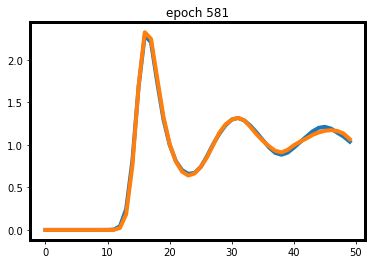

0.015051931142807007
1.899484 seconds


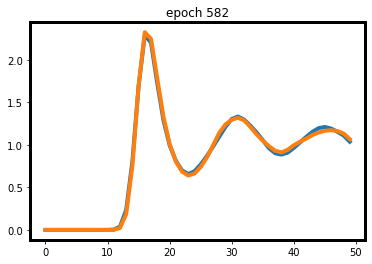

0.01584915816783905
1.904261 seconds


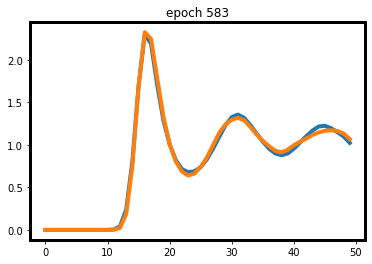

0.024959534406661987
1.950585 seconds


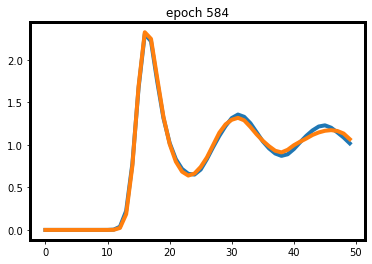

0.02193772792816162
1.829858 seconds


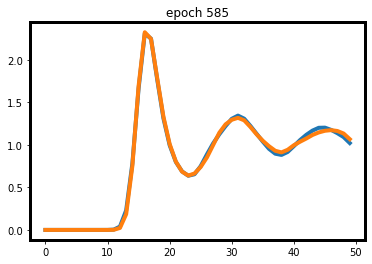

0.013636969029903412
1.781333 seconds


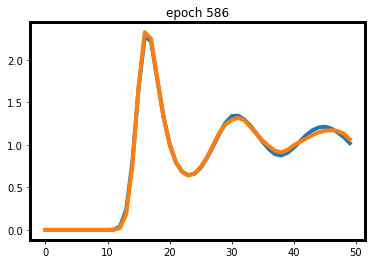

0.016388729214668274
1.824296 seconds


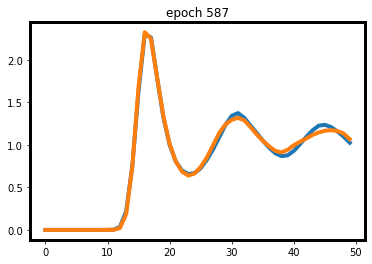

0.02386549860239029
1.891791 seconds


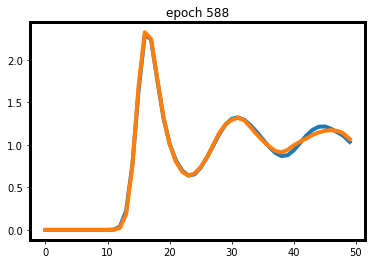

0.016343235969543457
1.809756 seconds


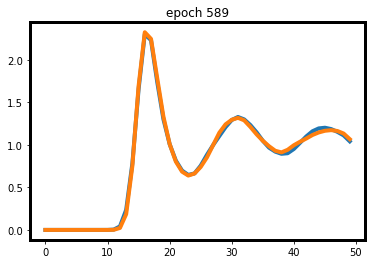

0.013154283165931702
1.916907 seconds


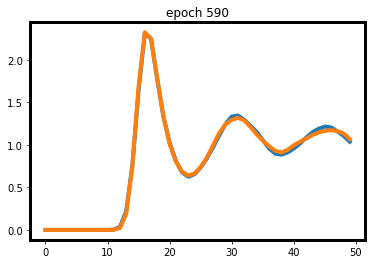

0.011092003434896469
1.860071 seconds


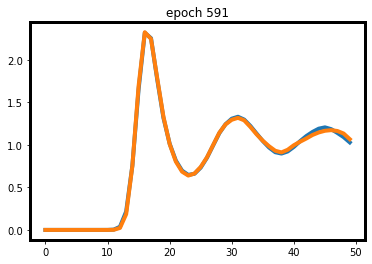

0.0076544806361198425
1.880051 seconds


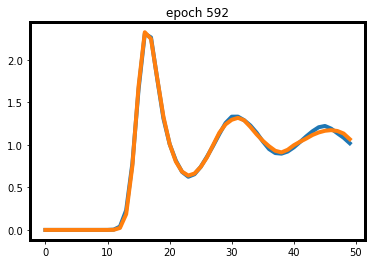

0.01370888203382492
1.851879 seconds


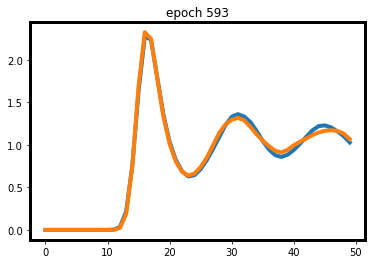

0.026329681277275085
1.891002 seconds


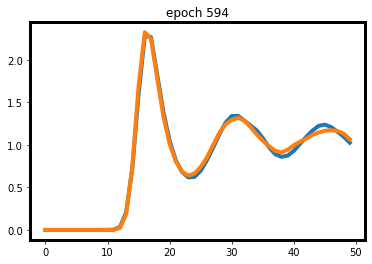

0.03034636750817299
1.835079 seconds


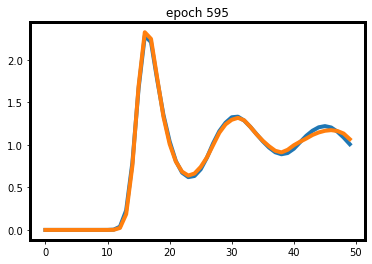

0.017202064394950867
1.790795 seconds


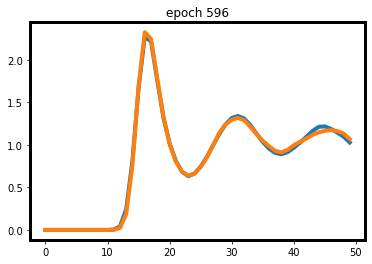

0.015180960297584534
1.891011 seconds


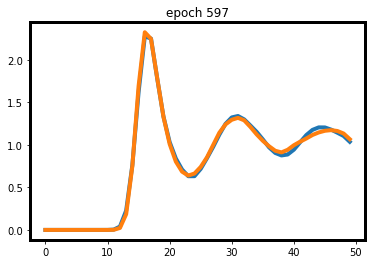

0.01874323934316635
1.851287 seconds


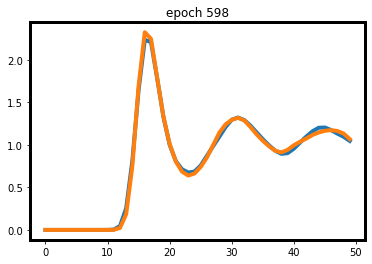

0.02086016535758972
1.845569 seconds


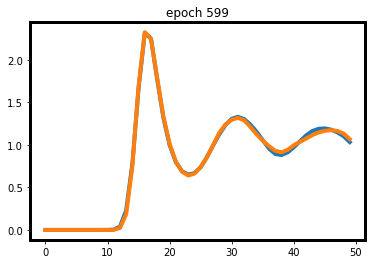

0.010578319430351257
1.835425 seconds


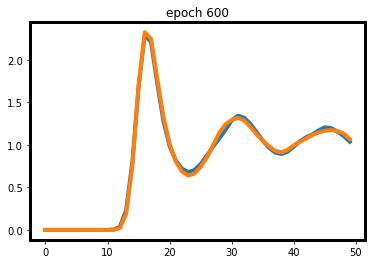

0.019173145294189453
1.938195 seconds


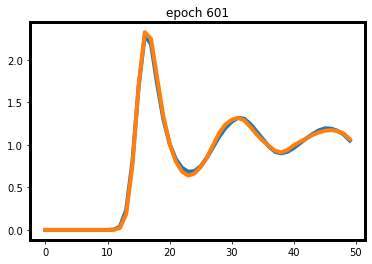

0.016239330172538757
1.887107 seconds


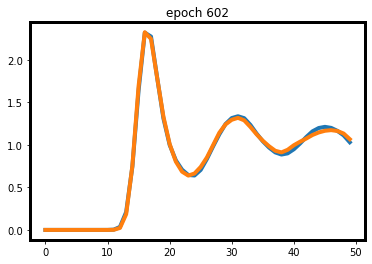

0.012451272457838058
2.32429 seconds


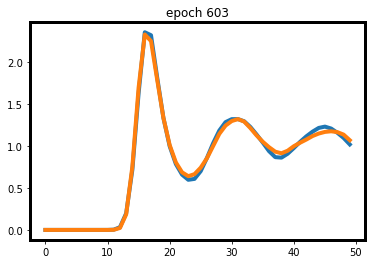

0.026078231632709503
1.907654 seconds


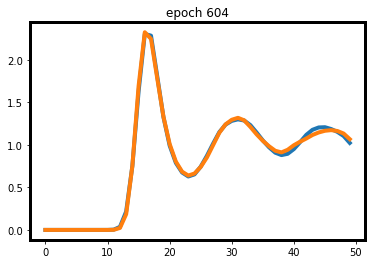

0.014470383524894714
1.959452 seconds


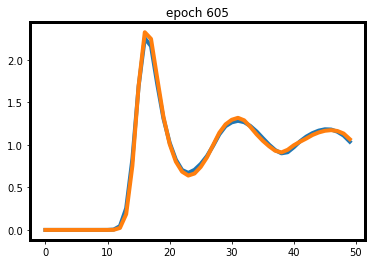

0.021995529532432556
1.93489 seconds


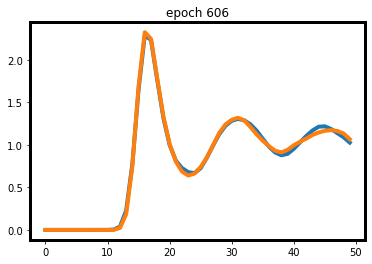

0.01762084662914276
1.813013 seconds


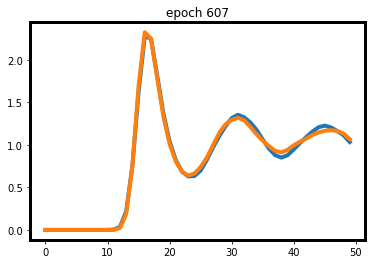

0.024642176926136017
1.899634 seconds


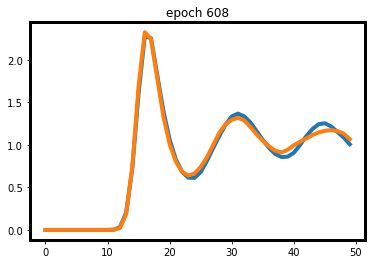

0.04399363696575165
1.904672 seconds


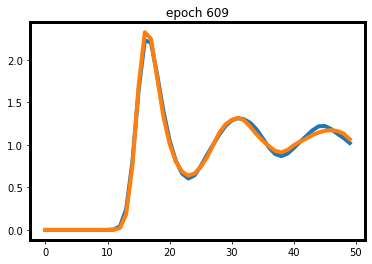

0.028750717639923096
1.94693 seconds


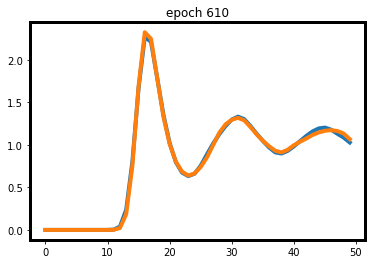

0.012929312884807587
1.956792 seconds


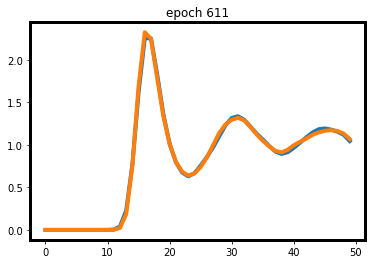

0.011113673448562622
1.869432 seconds


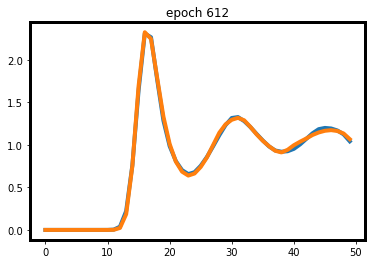

0.008989334106445312
1.898298 seconds


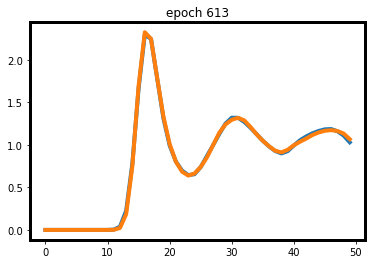

0.0057856738567352295
1.886946 seconds


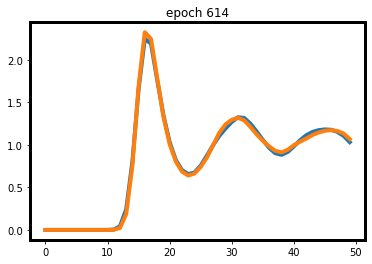

0.017069324851036072
1.851371 seconds


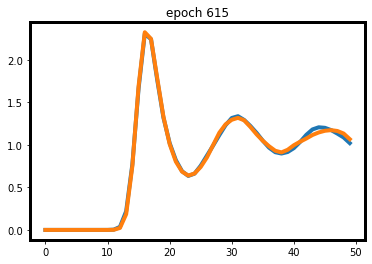

0.012584932148456573
1.878477 seconds


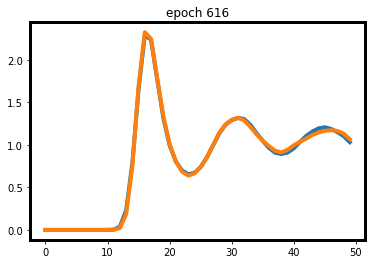

0.010931834578514099
1.907694 seconds


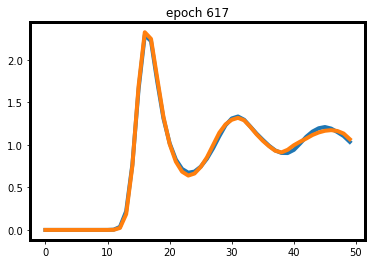

0.013844884932041168
1.825206 seconds


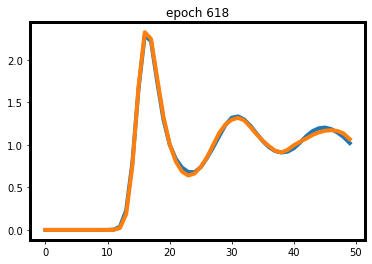

0.015458658337593079
1.840604 seconds


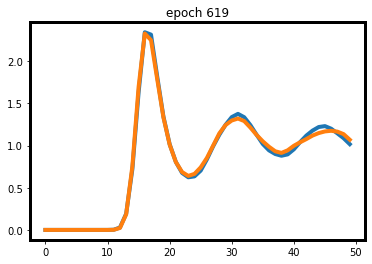

0.023534532636404037
1.823492 seconds


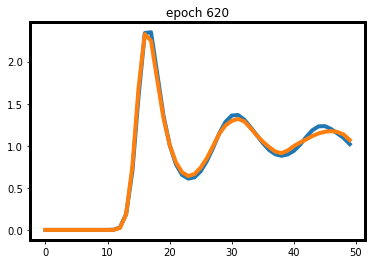

0.03396214544773102
1.887446 seconds


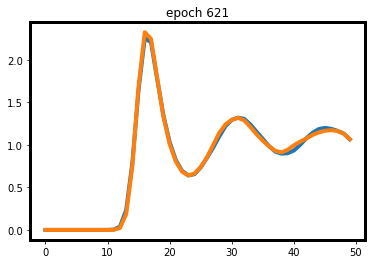

0.014087475836277008
1.880946 seconds


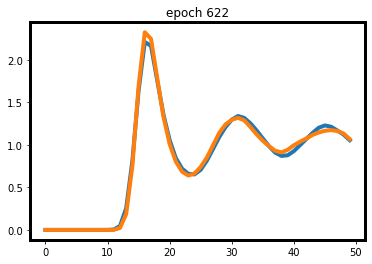

0.034660786390304565
1.841389 seconds


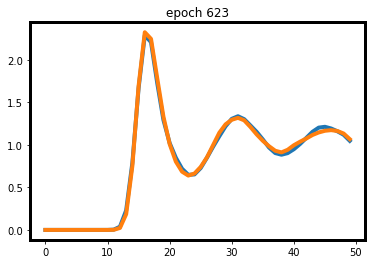

0.016591593623161316
1.938792 seconds


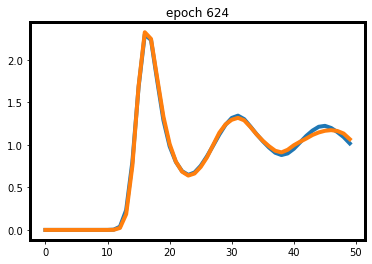

0.01675356924533844
1.830225 seconds


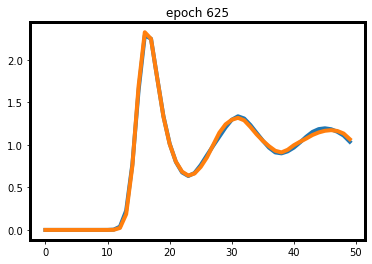

0.010112464427947998
1.962762 seconds


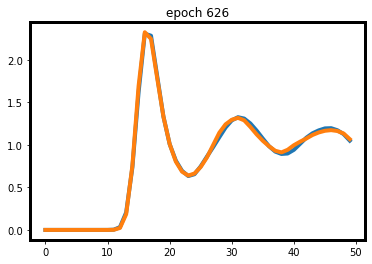

0.012448225170373917
1.874956 seconds


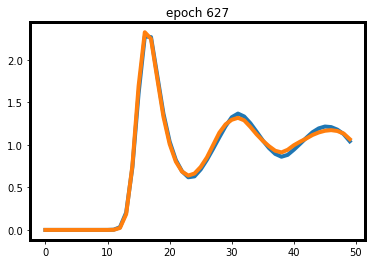

0.02361208200454712
1.804473 seconds


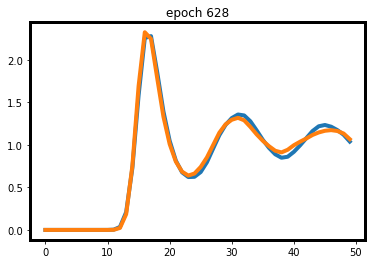

0.04066617786884308
1.793153 seconds


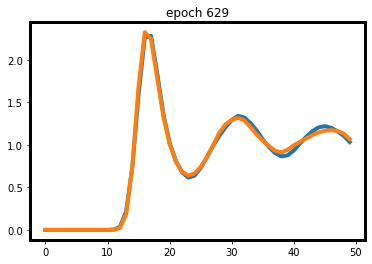

0.02404496818780899
1.929581 seconds


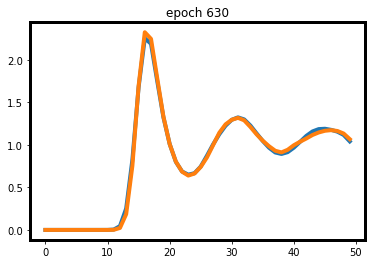

0.014934629201889038
1.919638 seconds


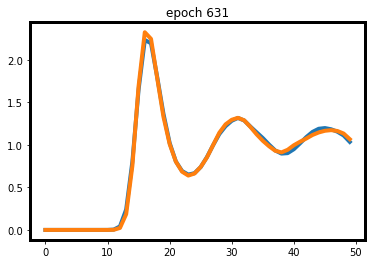

0.015612050890922546
1.900781 seconds


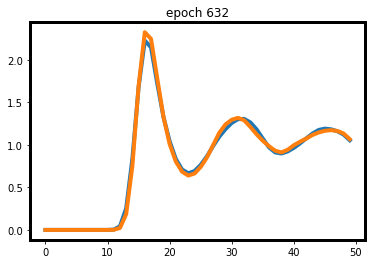

0.026913046836853027
1.906059 seconds


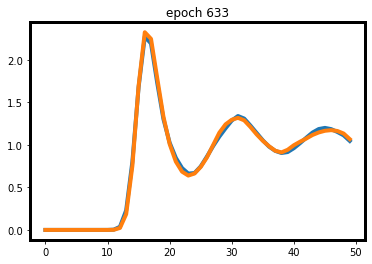

0.015181481838226318
2.019492 seconds


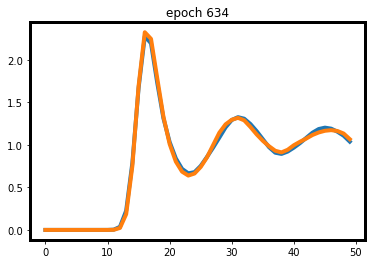

0.01561826467514038
1.824727 seconds


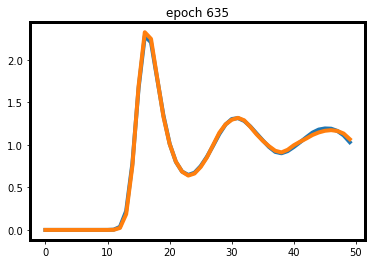

0.006434231996536255
1.874902 seconds


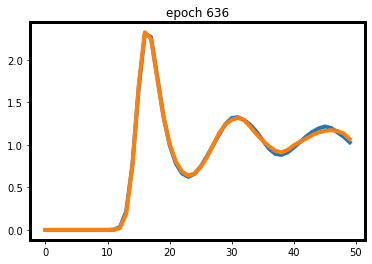

0.011333450675010681
1.931316 seconds


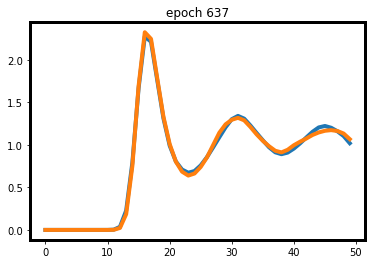

0.016763418912887573
1.934838 seconds


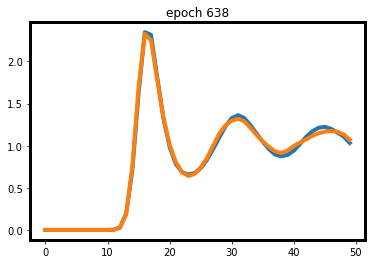

0.021708626300096512
1.815173 seconds


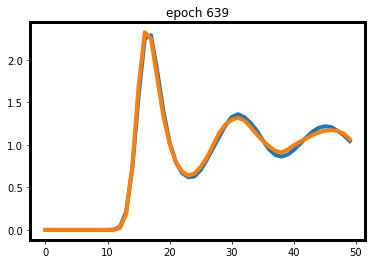

0.03170490637421608
1.931061 seconds


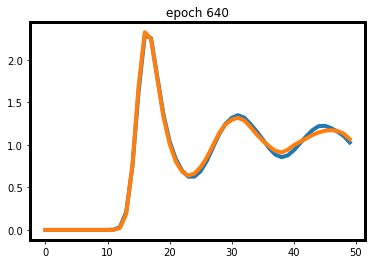

0.024473324418067932
1.829977 seconds


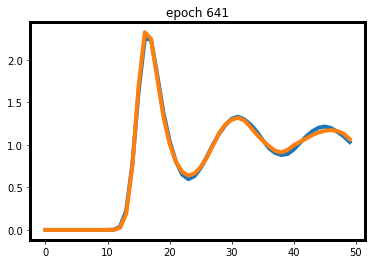

0.02047433704137802
1.924739 seconds


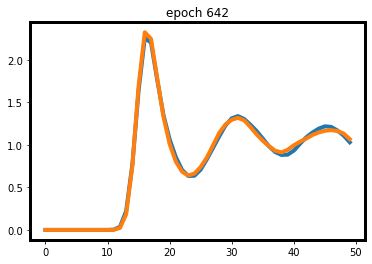

0.021251477301120758
1.915577 seconds


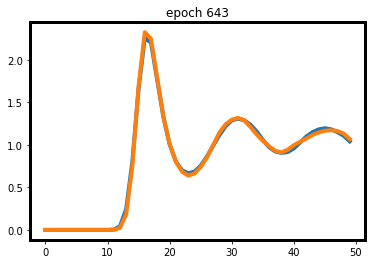

0.013787999749183655
1.888909 seconds


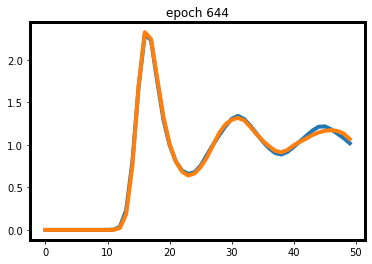

0.015894681215286255
1.88575 seconds


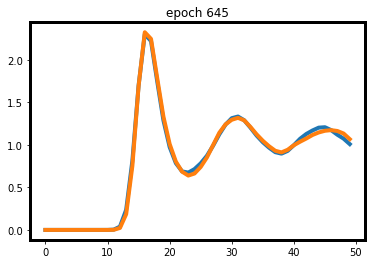

0.021588623523712158
1.891702 seconds


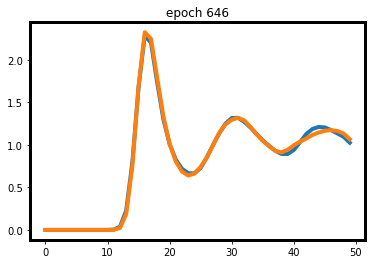

0.018254786729812622
1.793892 seconds


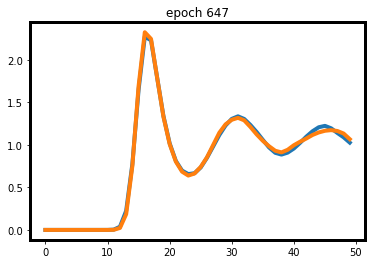

0.014117002487182617
1.87371 seconds


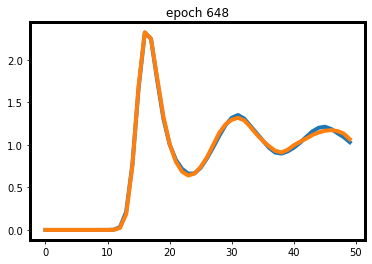

0.011537283658981323
1.909212 seconds


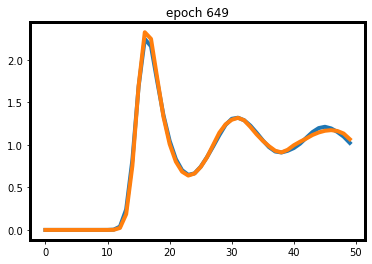

0.018268674612045288
1.865043 seconds


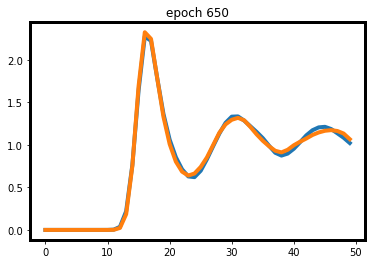

0.021689921617507935
1.935522 seconds


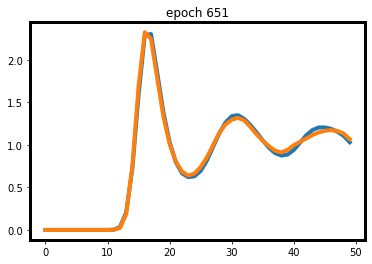

0.02489670366048813
1.889251 seconds


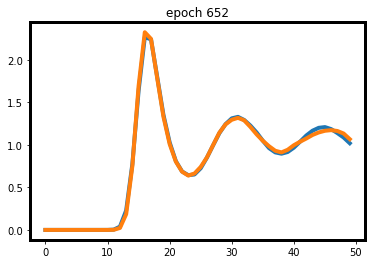

0.013442069292068481
1.904931 seconds


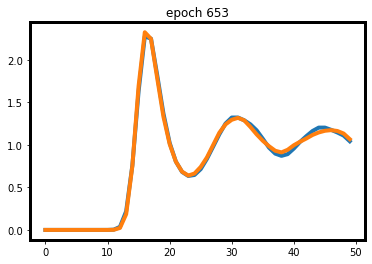

0.01578298956155777
1.83111 seconds


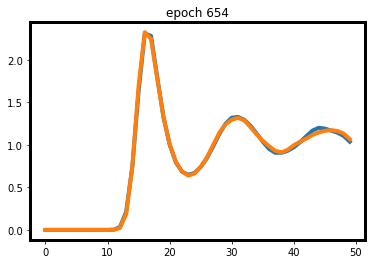

0.009009294211864471
1.865125 seconds


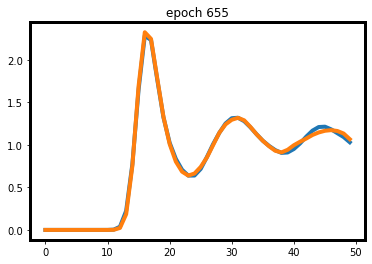

0.013074308633804321
1.857493 seconds


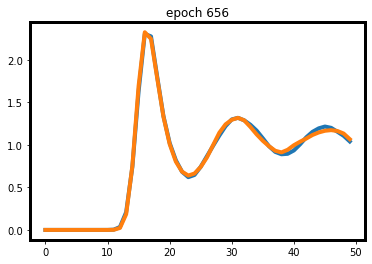

0.013897836208343506
1.847292 seconds


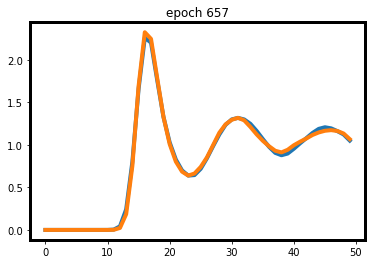

0.0153113454580307
1.849206 seconds


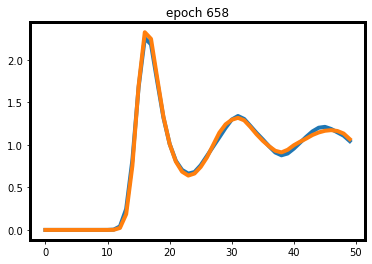

0.02023814618587494
1.774317 seconds


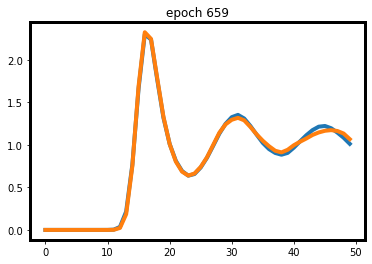

0.014752663671970367
1.947975 seconds


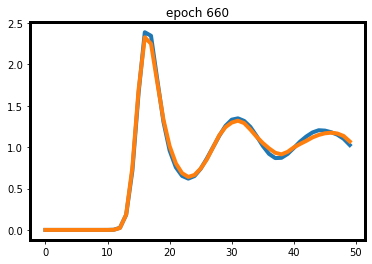

0.02482552081346512
2.003493 seconds


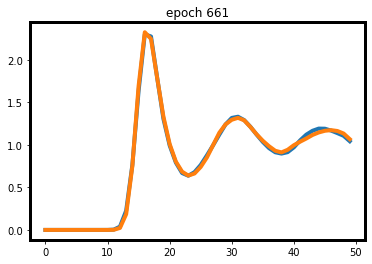

0.011185891926288605
1.90078 seconds


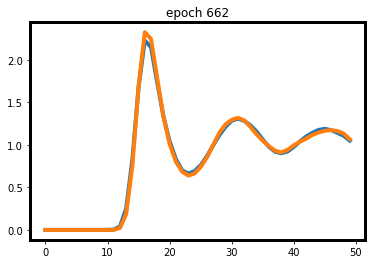

0.020079880952835083
1.875422 seconds


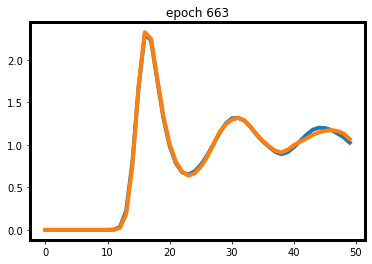

0.011758245527744293
1.842168 seconds


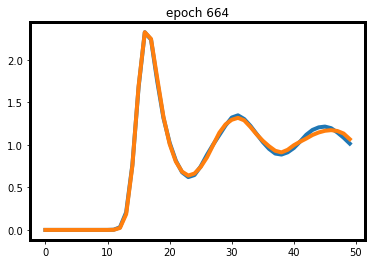

0.014285624027252197
1.859352 seconds


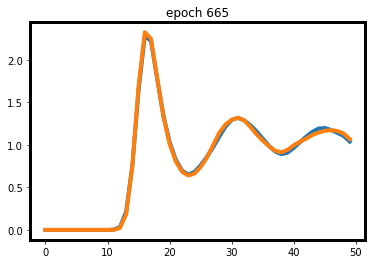

0.010789789259433746
1.968316 seconds


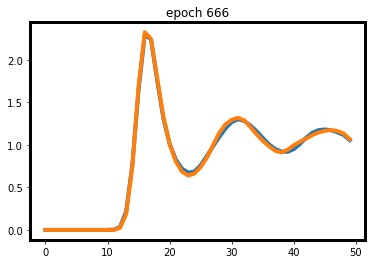

0.012144885957241058
1.922902 seconds


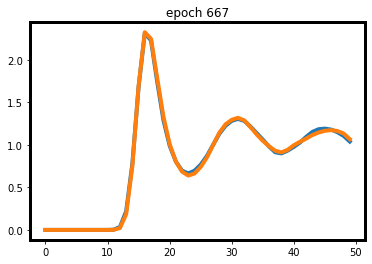

0.008627653121948242
1.794287 seconds


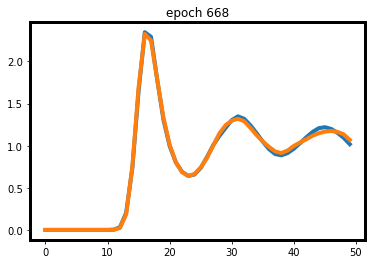

0.013534866273403168
1.837009 seconds


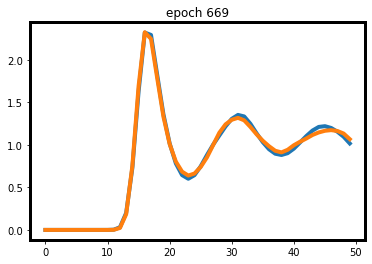

0.02007729932665825
1.999549 seconds


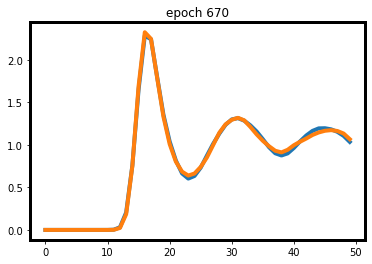

0.012110106647014618
1.826852 seconds


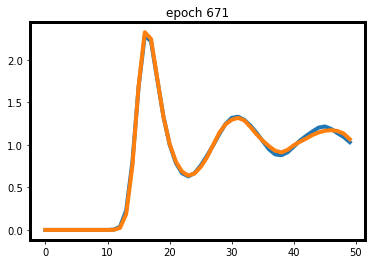

0.013595640659332275
2.285868 seconds


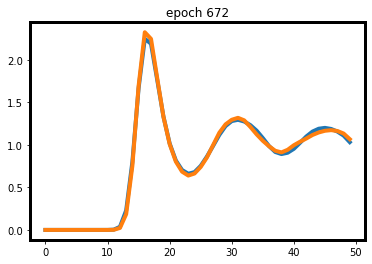

0.01511925458908081
1.87378 seconds


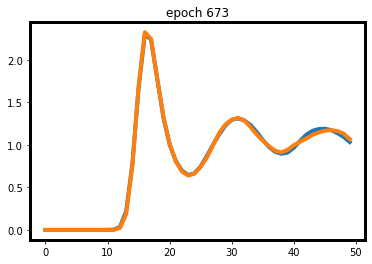

0.009179197251796722
1.903817 seconds


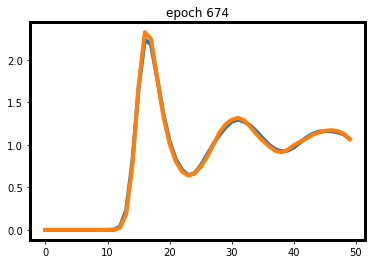

0.012493439018726349
1.870103 seconds


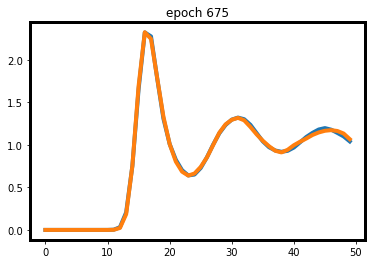

0.005868185311555862
1.876794 seconds


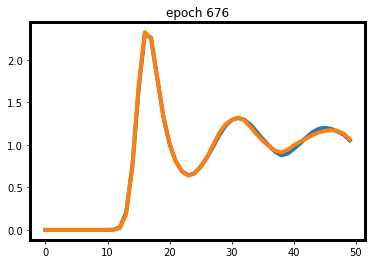

0.008502446115016937
1.817081 seconds


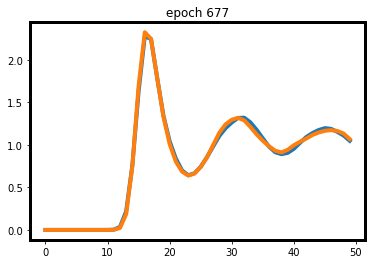

0.01414540410041809
1.928452 seconds


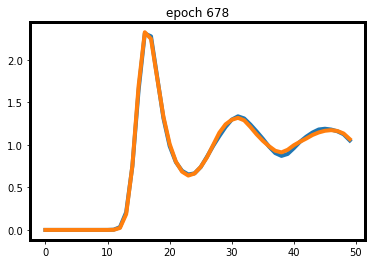

0.010096412152051926
1.880365 seconds


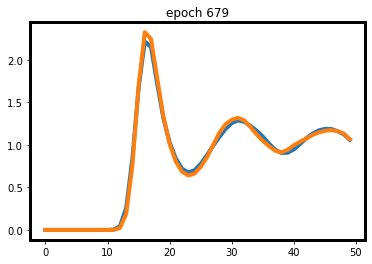

0.03125046193599701
1.93068 seconds


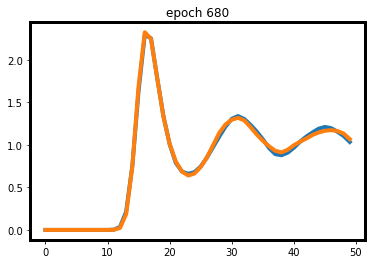

0.011939749121665955
1.904214 seconds


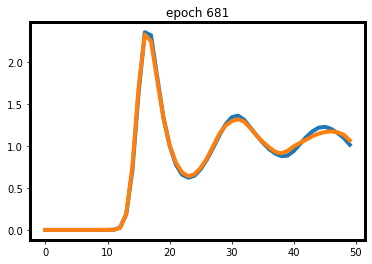

0.02177206426858902
1.885527 seconds


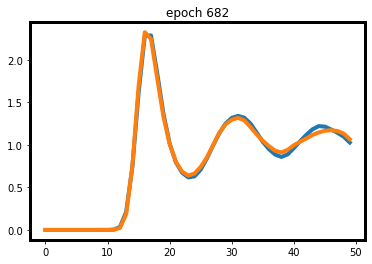

0.02351946383714676
1.926181 seconds


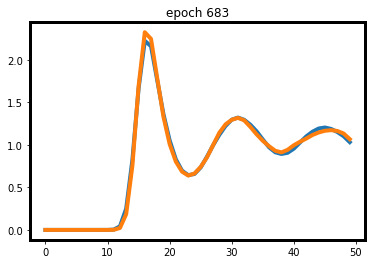

0.02136768400669098
1.883348 seconds


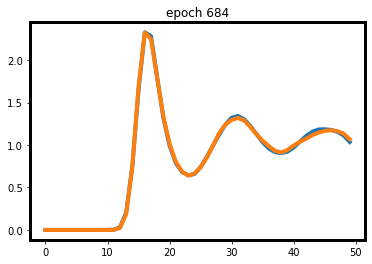

0.006716914474964142
1.955697 seconds


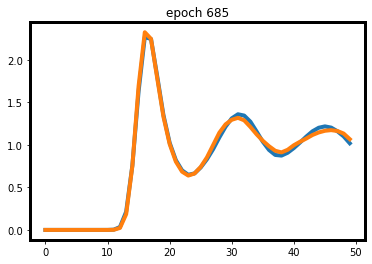

0.021967753767967224
1.855424 seconds


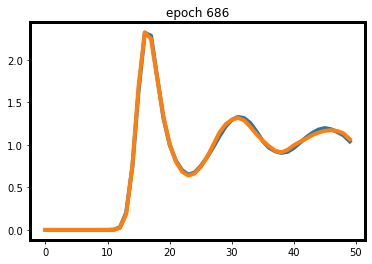

0.00899612158536911
1.949834 seconds


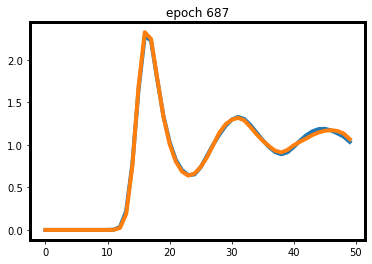

0.009532943367958069
1.904649 seconds


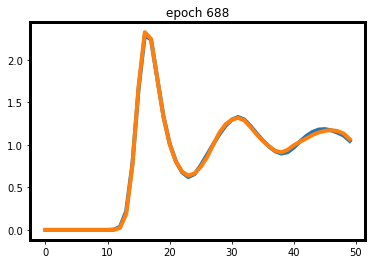

0.006654515862464905
1.89405 seconds


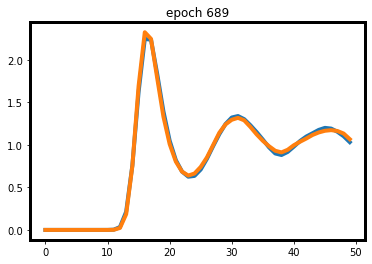

0.014996867626905441
1.929727 seconds


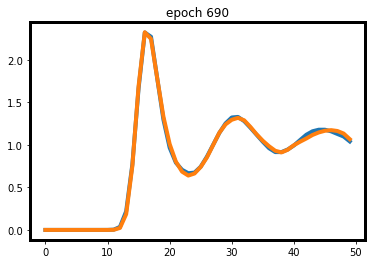

0.009360626339912415
1.839524 seconds


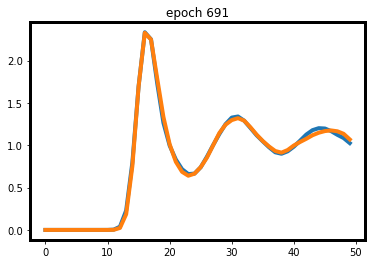

0.01641349494457245
1.886002 seconds


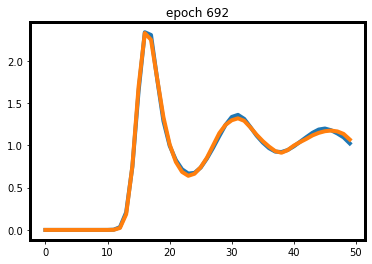

0.01196308434009552
1.910524 seconds


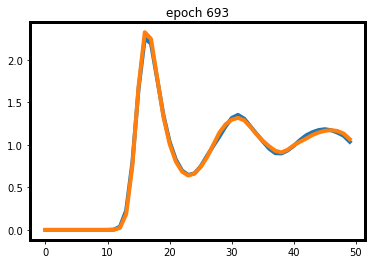

0.01252426952123642
1.96867 seconds


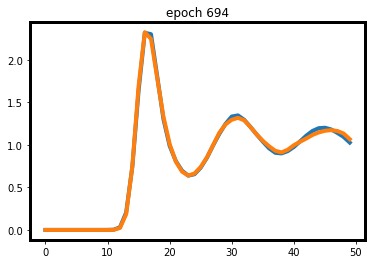

0.010805673897266388
1.942119 seconds


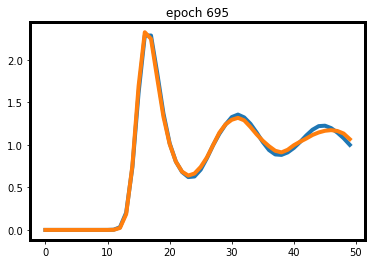

0.024163898080587387
1.848687 seconds


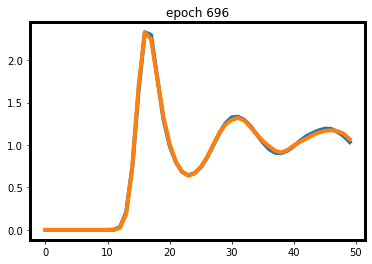

0.00720156729221344
1.867395 seconds


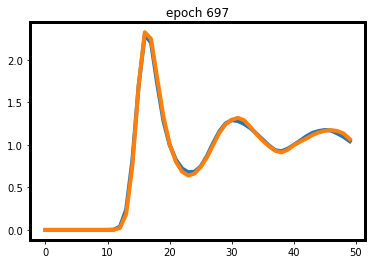

0.015186883509159088
2.077975 seconds


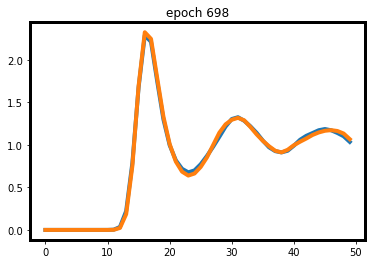

0.011780820786952972
1.942928 seconds


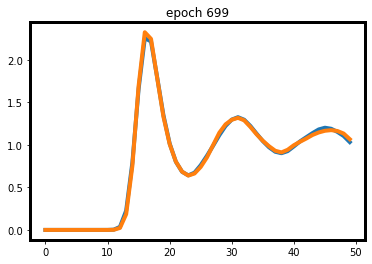

0.00914435088634491
1.942725 seconds


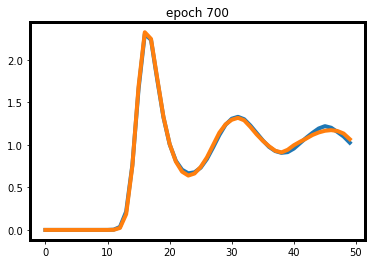

0.00998077541589737
1.803326 seconds


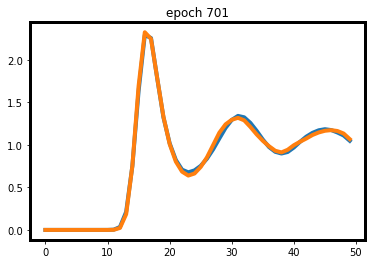

0.014451153576374054
1.980424 seconds


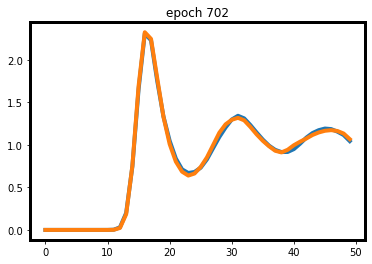

0.010993048548698425
1.893578 seconds


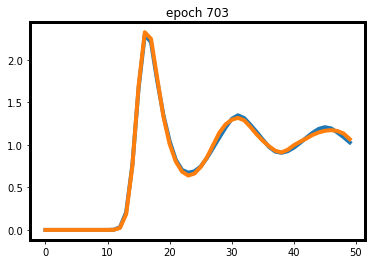

0.01297711580991745
1.838837 seconds


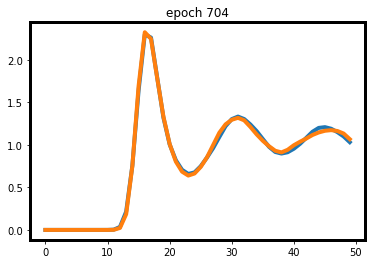

0.012664087116718292
1.859045 seconds


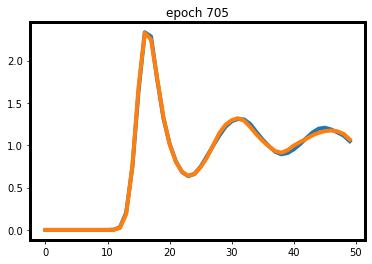

0.009095869958400726
1.937676 seconds


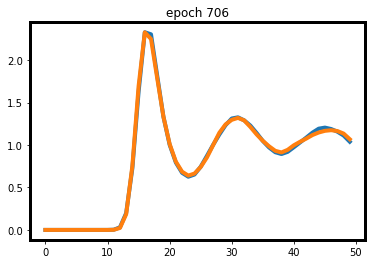

0.008653685450553894
1.825421 seconds


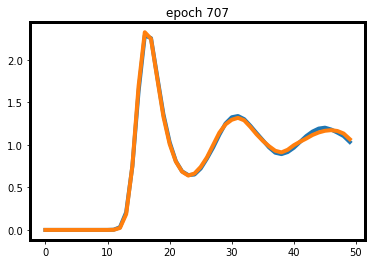

0.010329172015190125
1.889269 seconds


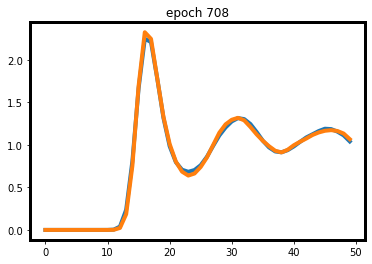

0.013581842184066772
1.869389 seconds


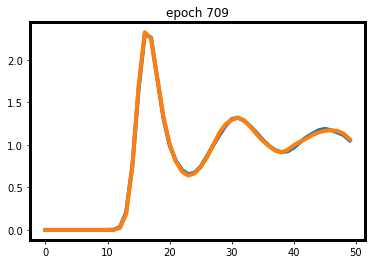

0.004772067070007324
1.894741 seconds


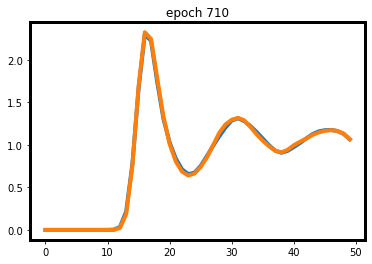

0.0070918649435043335
1.840108 seconds


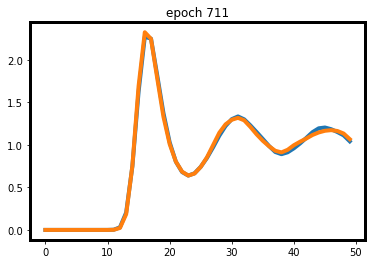

0.011128772050142288
1.894648 seconds


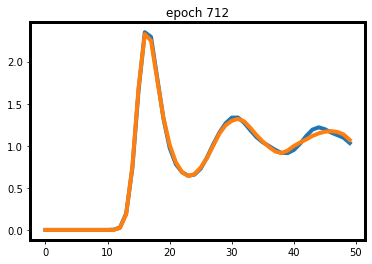

0.015058089047670364
1.86113 seconds


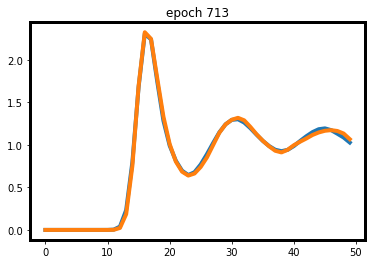

0.011868946254253387
1.904817 seconds


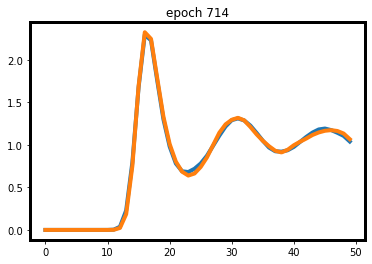

0.012593261897563934
1.911409 seconds


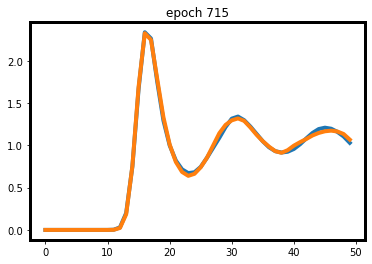

0.0106620192527771
1.896791 seconds


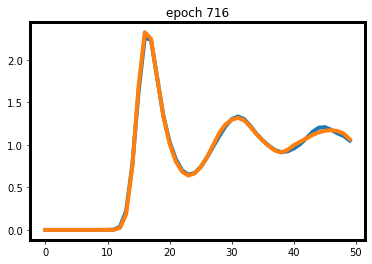

0.011674128472805023
1.88254 seconds


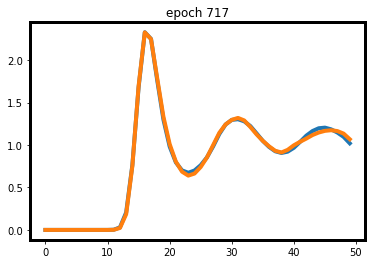

0.01023293286561966
1.874689 seconds


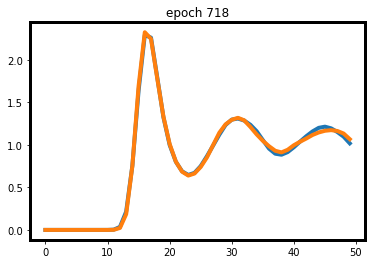

0.011787079274654388
1.948111 seconds


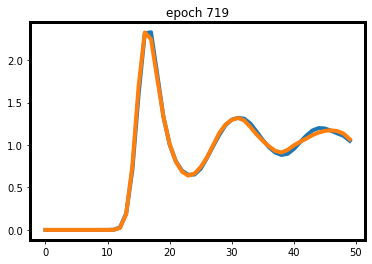

0.017509400844573975
1.91827 seconds


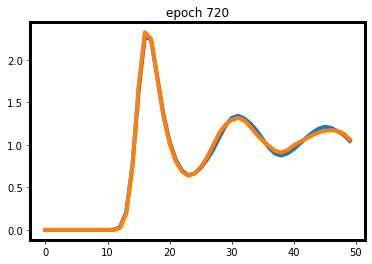

0.01749371364712715
1.870092 seconds


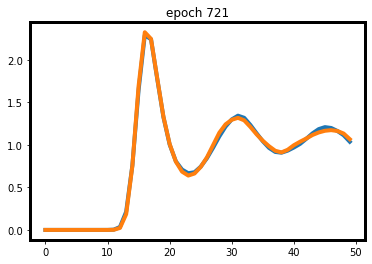

0.009503990411758423
1.976669 seconds


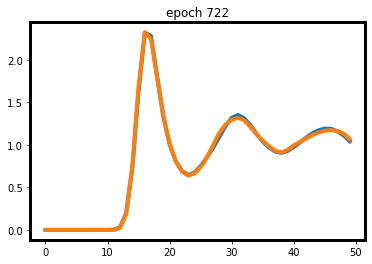

0.007354956120252609
1.904983 seconds


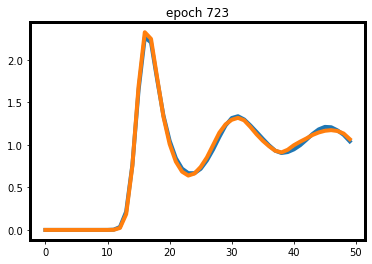

0.01641497015953064
1.952806 seconds


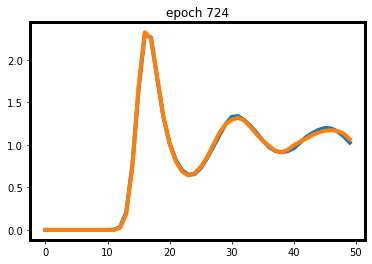

0.007482443004846573
1.941402 seconds


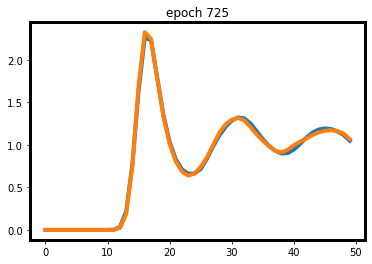

0.012700259685516357
1.925002 seconds


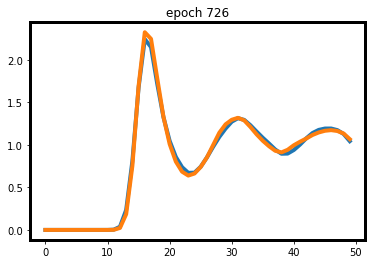

0.02473914623260498
1.780497 seconds


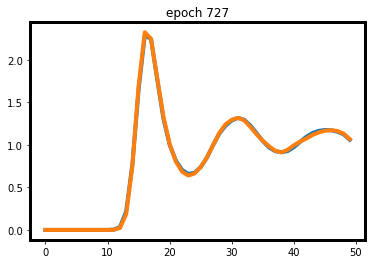

0.00451727956533432
1.859351 seconds


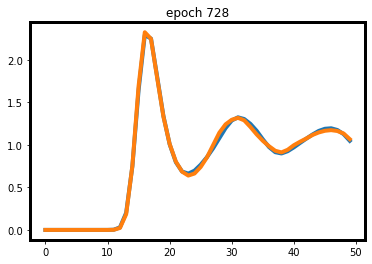

0.010065525770187378
1.858279 seconds


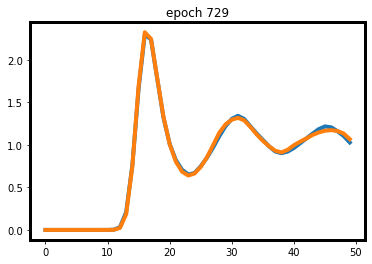

0.008476056158542633
1.741517 seconds


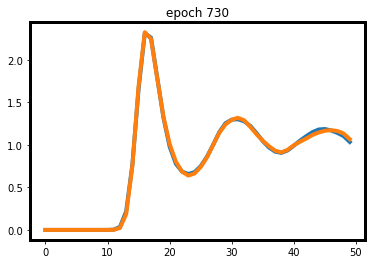

0.0065033286809921265
1.841045 seconds


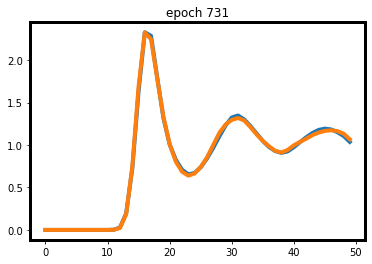

0.007968664169311523
1.825093 seconds


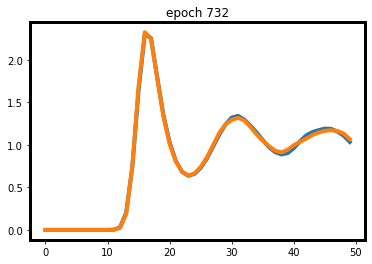

0.008071590214967728
1.856126 seconds


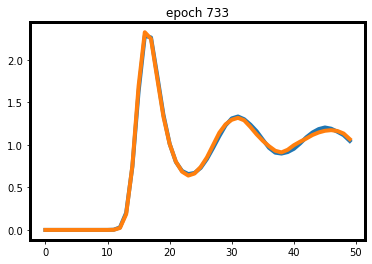

0.01092875748872757
1.957016 seconds


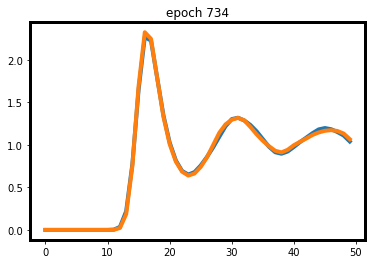

0.00950990617275238
1.898684 seconds


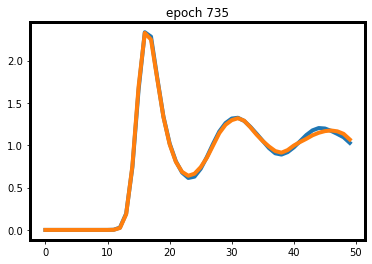

0.011383768171072006
1.921031 seconds


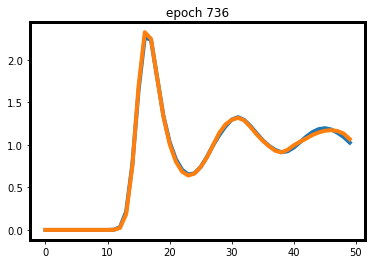

0.009262725710868835
1.885502 seconds


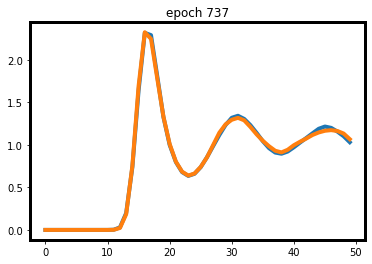

0.008617419749498367
1.876212 seconds


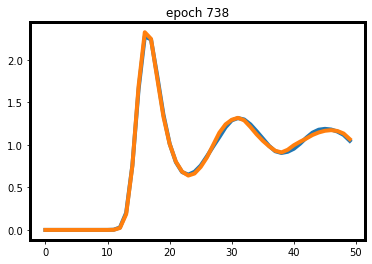

0.009007051587104797
1.836392 seconds


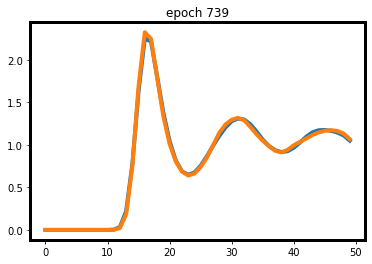

0.011237859725952148
1.873153 seconds


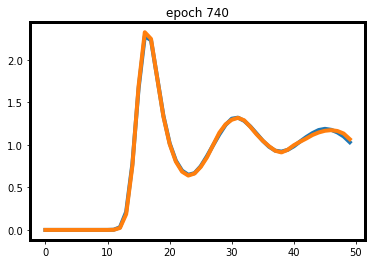

0.005247320979833603
2.275926 seconds


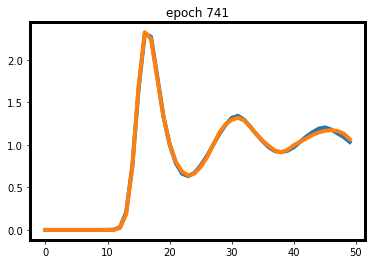

0.007547274231910706
1.854855 seconds


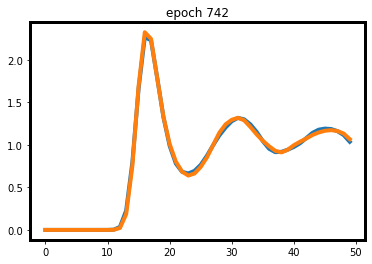

0.010942220687866211
1.913069 seconds


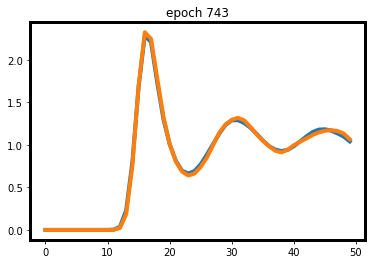

0.011241637170314789
1.776968 seconds


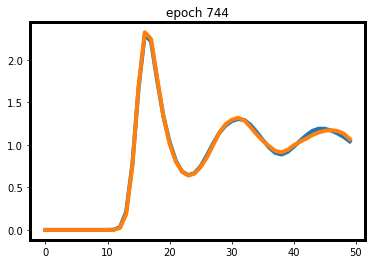

0.009556375443935394
1.930323 seconds


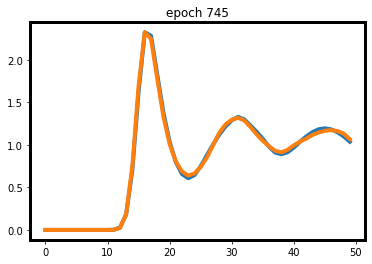

0.012574680149555206
1.926806 seconds


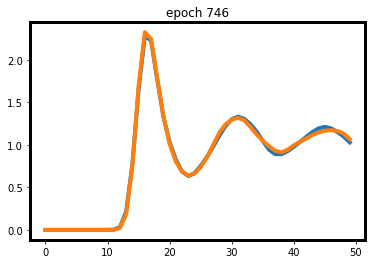

0.01196359097957611
1.813466 seconds


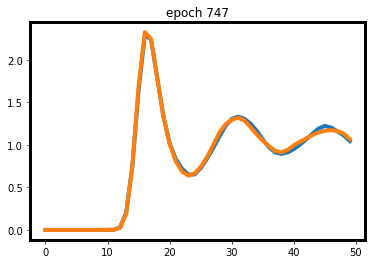

0.013146601617336273
1.858322 seconds


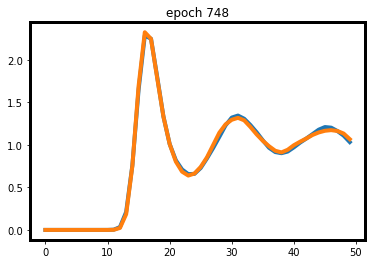

0.009562596678733826
1.776274 seconds


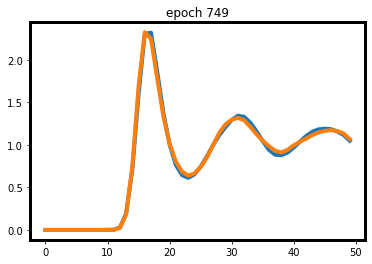

0.020746927708387375
1.920659 seconds


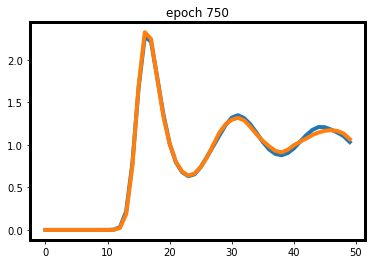

0.015242710709571838
1.910366 seconds


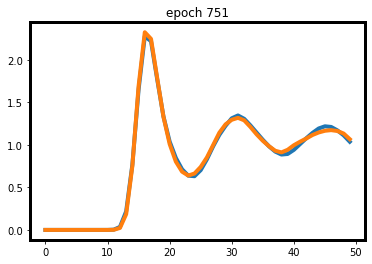

0.015512324869632721
1.939872 seconds


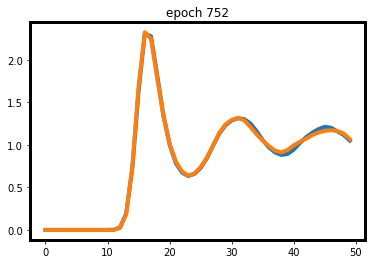

0.011189557611942291
1.901802 seconds


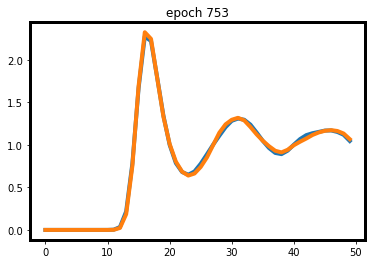

0.009327858686447144
1.884116 seconds


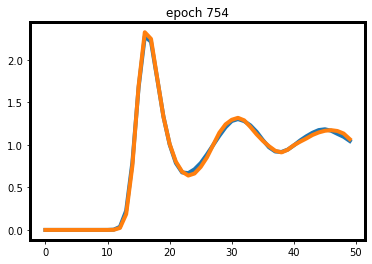

0.012485869228839874
1.881133 seconds


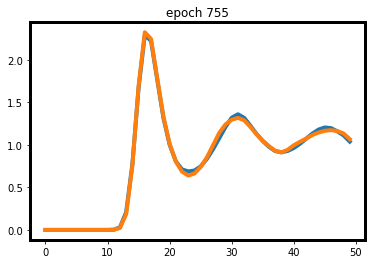

0.012470372021198273
1.827924 seconds


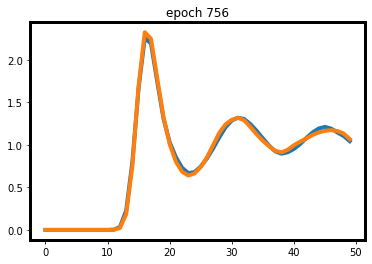

0.019688740372657776
1.902464 seconds


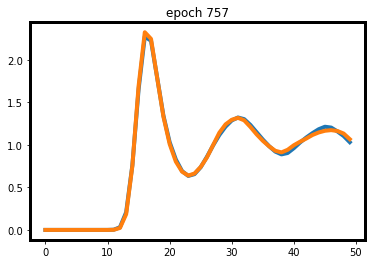

0.009413130581378937
1.876412 seconds


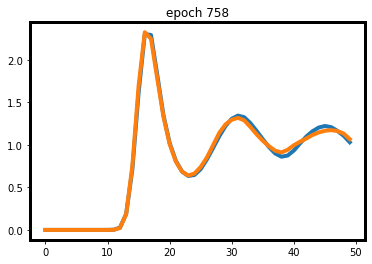

0.02212444692850113
1.921135 seconds


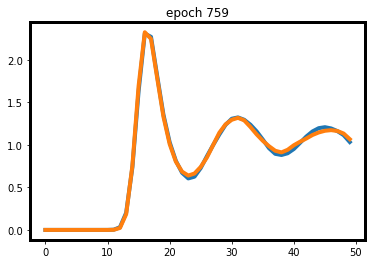

0.013491246849298477
1.891883 seconds


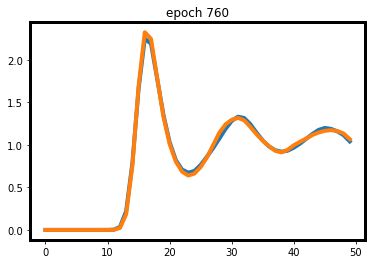

0.015210360288619995
1.851211 seconds


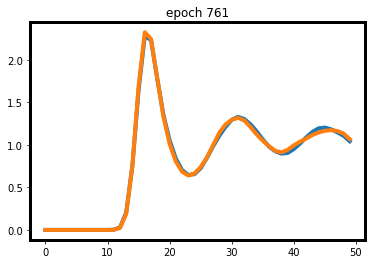

0.011709354817867279
1.89342 seconds


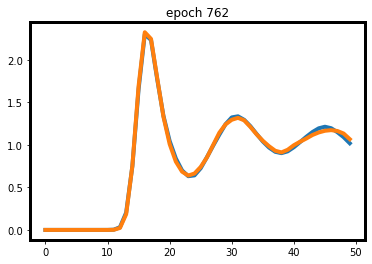

0.00995318591594696
1.835595 seconds


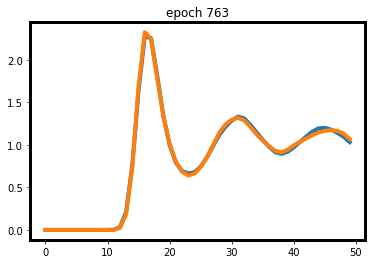

0.01036488264799118
1.869879 seconds


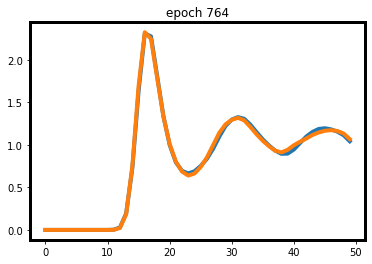

0.011502068489789963
1.846742 seconds


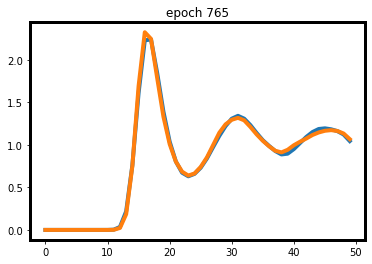

0.016528967767953873
1.863901 seconds


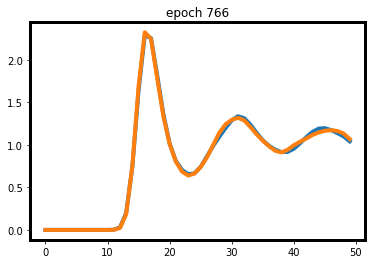

0.010299921035766602
1.763594 seconds


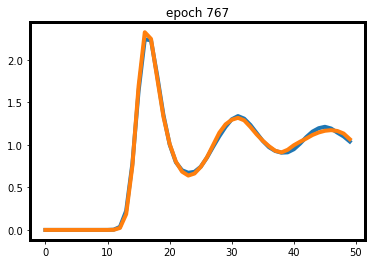

0.015329249203205109
1.941212 seconds


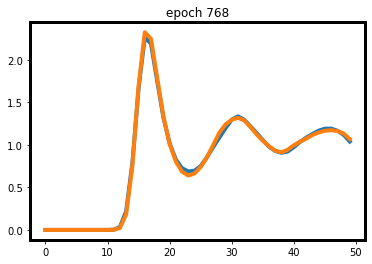

0.012773334980010986
1.806285 seconds


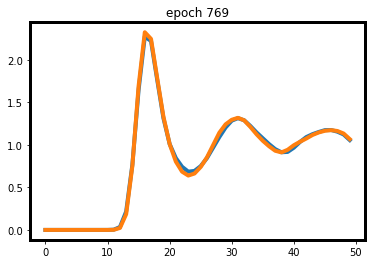

0.01272166520357132
1.962117 seconds


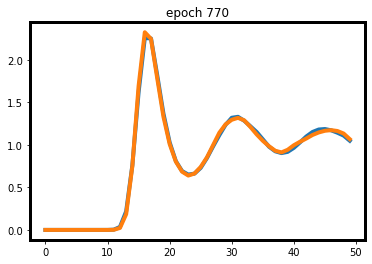

0.010646503418684006
1.821084 seconds


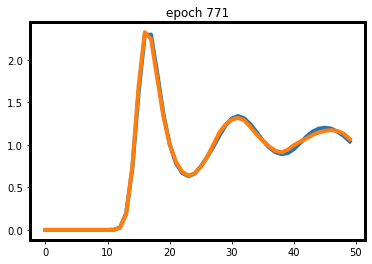

0.01399214193224907
1.861948 seconds


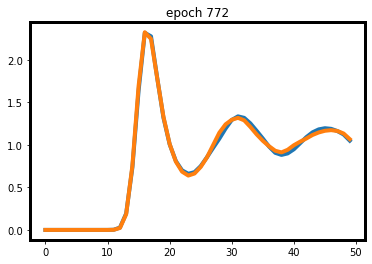

0.013866282999515533
1.990127 seconds


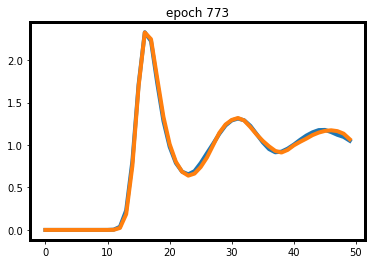

0.015034817159175873
1.86001 seconds


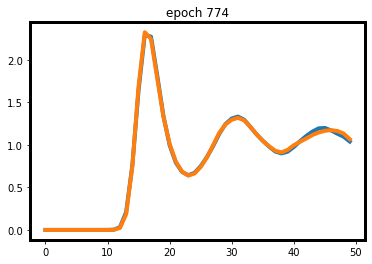

0.007768198847770691
1.86272 seconds


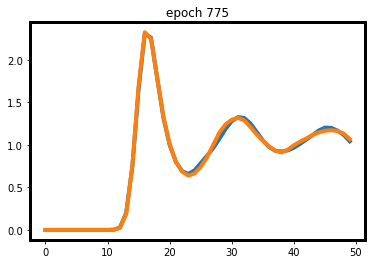

0.01204797625541687
1.811341 seconds


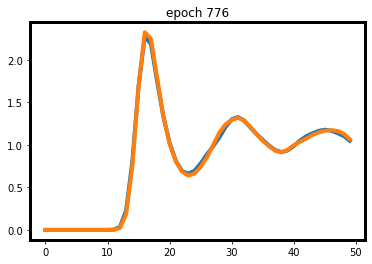

0.012755177915096283
1.855495 seconds


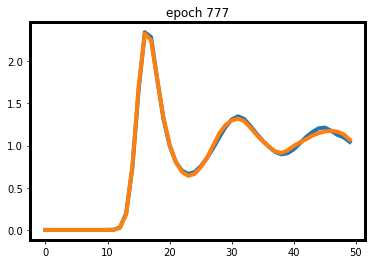

0.012138614431023598
1.760983 seconds


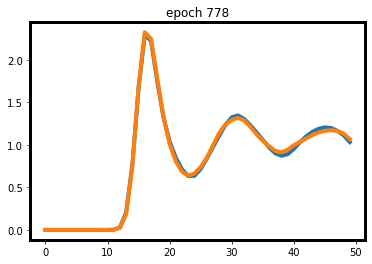

0.013742752373218536
1.895727 seconds


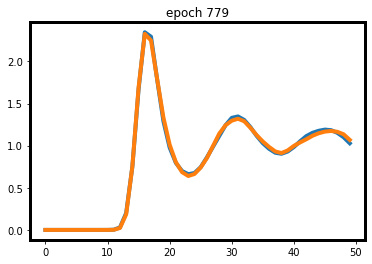

0.008734527975320816
1.80995 seconds


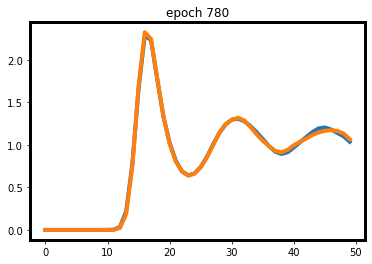

0.007864296436309814
1.833678 seconds


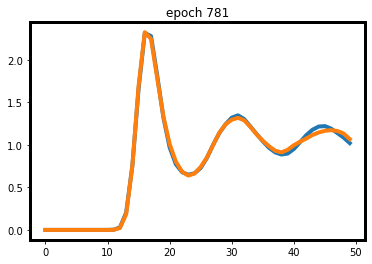

0.015086472034454346
1.882973 seconds


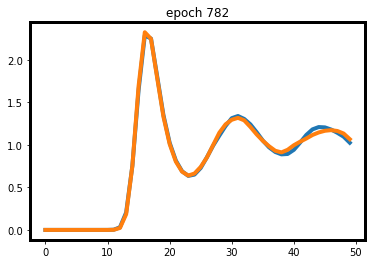

0.01480383425951004
1.776637 seconds


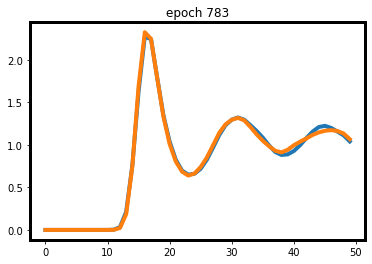

0.01703551411628723
1.814033 seconds


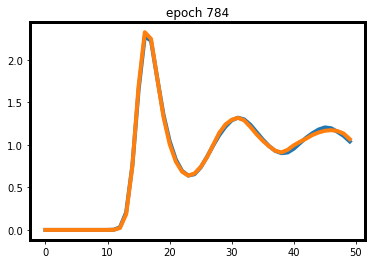

0.008826181292533875
1.900996 seconds


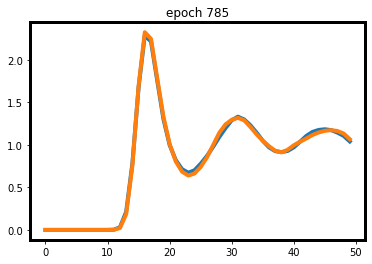

0.011213943362236023
1.941208 seconds


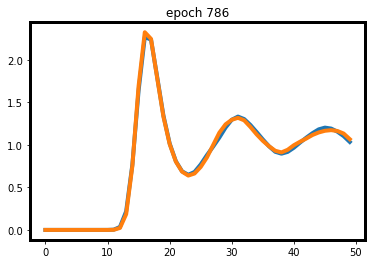

0.011482074856758118
1.912426 seconds


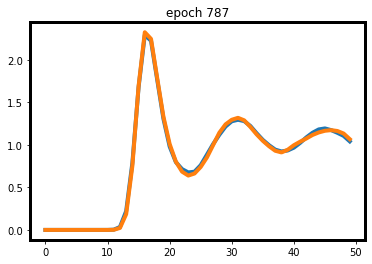

0.009970776736736298
1.938319 seconds


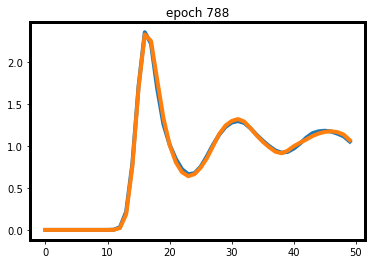

0.014611214399337769
1.857463 seconds


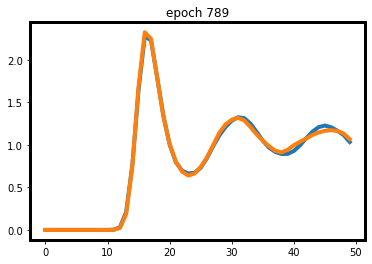

0.015524089336395264
1.863155 seconds


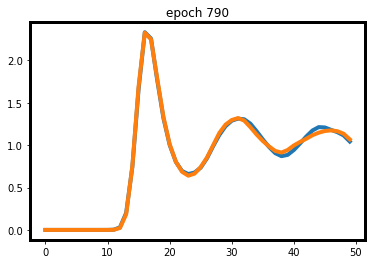

0.01352248340845108
1.893021 seconds


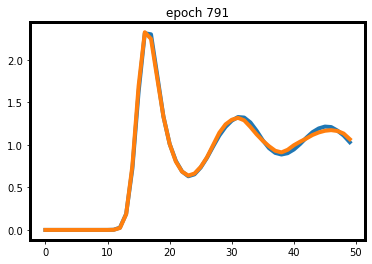

0.015431467443704605
1.855599 seconds


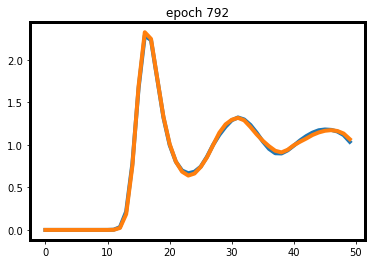

0.0070885345339775085
1.935554 seconds


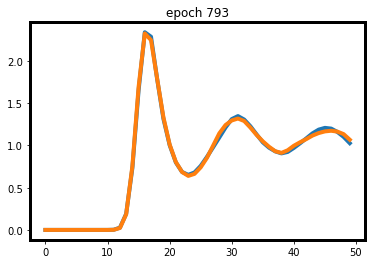

0.008880198001861572
1.951721 seconds


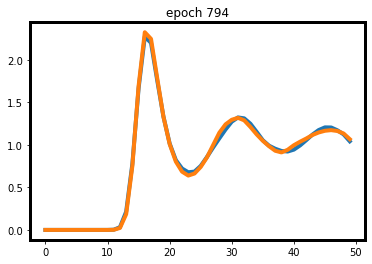

0.016358420252799988
1.887554 seconds


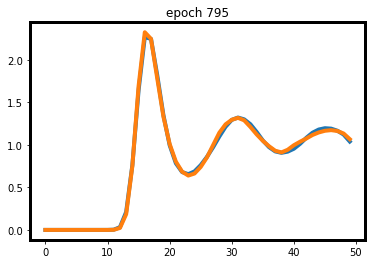

0.010335259139537811
1.90856 seconds


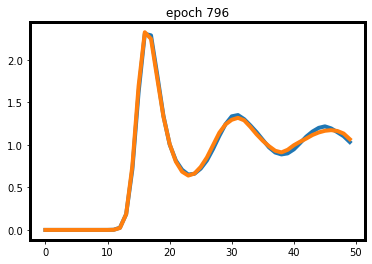

0.016832266002893448
1.849621 seconds


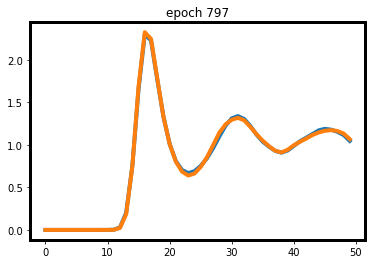

0.005561269819736481
1.924146 seconds


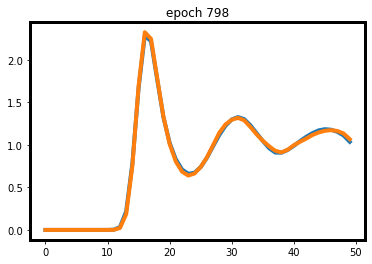

0.006635531783103943
1.83104 seconds


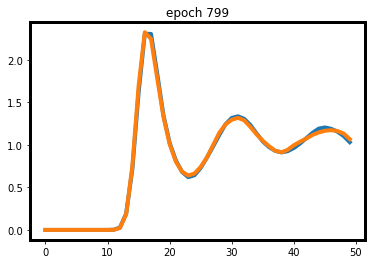

0.011386925354599953
1.929576 seconds


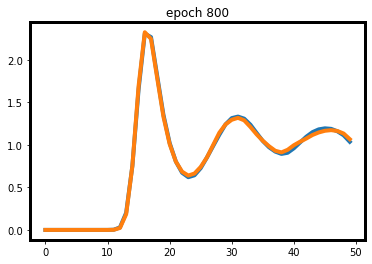

0.007645662873983383
1.862521 seconds


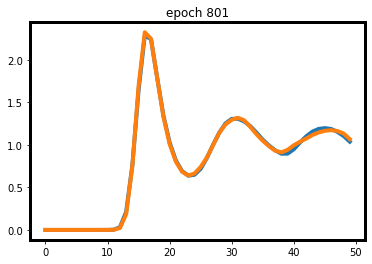

0.00882556289434433
1.829068 seconds


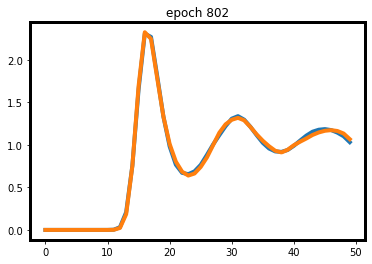

0.009120699018239975
1.821246 seconds


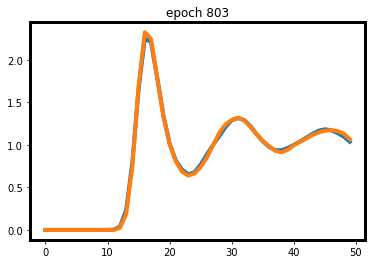

0.011216402053833008
1.87736 seconds


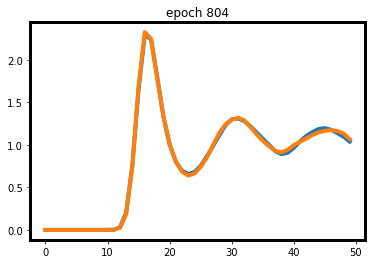

0.008090898394584656
1.852437 seconds


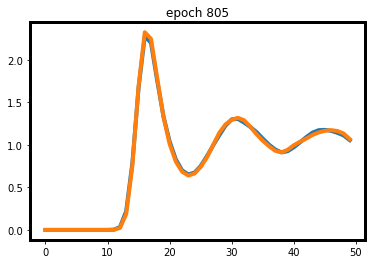

0.008413001894950867
1.824584 seconds


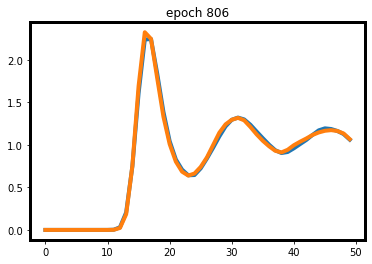

0.014961622655391693
1.898937 seconds


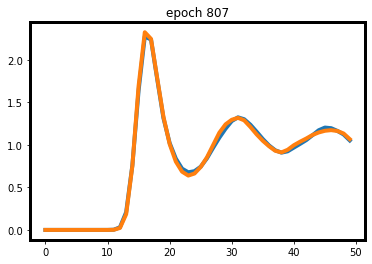

0.012418001890182495
1.872002 seconds


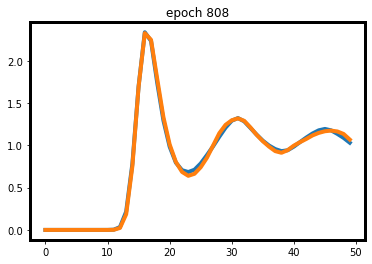

0.013016708195209503
1.925142 seconds


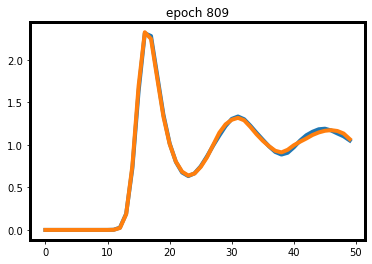

0.009267382323741913
2.178682 seconds


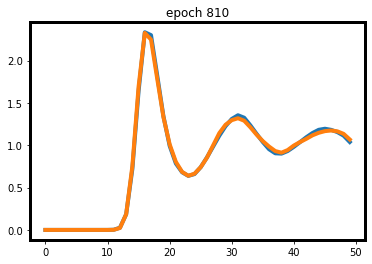

0.009032703936100006
1.888912 seconds


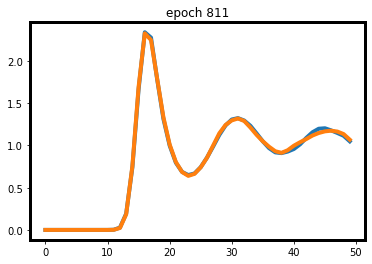

0.006367281079292297
1.952065 seconds


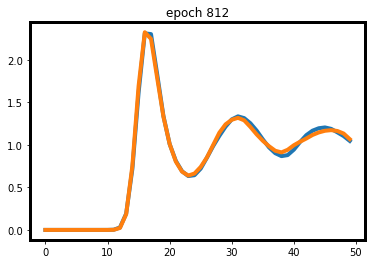

0.018305517733097076
1.913659 seconds


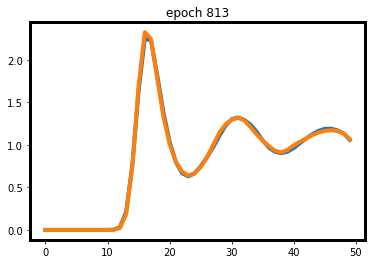

0.009734150022268295
1.953214 seconds


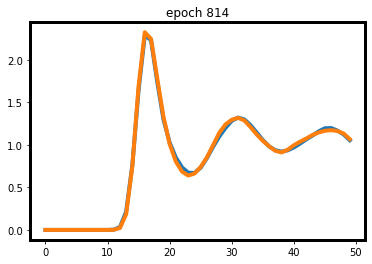

0.01074441522359848
1.809828 seconds


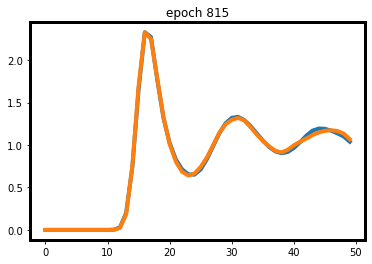

0.009010910987854004
1.884475 seconds


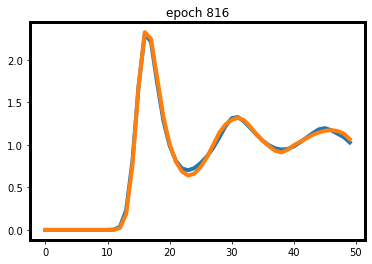

0.019733905792236328
1.912612 seconds


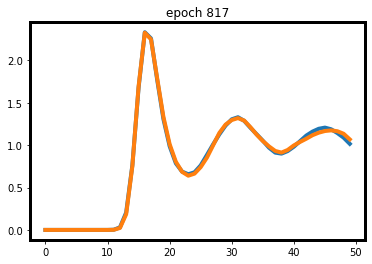

0.009400278329849243
1.900534 seconds


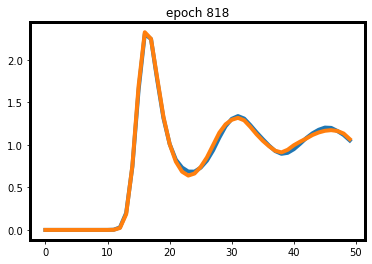

0.014378923922777176
1.870651 seconds


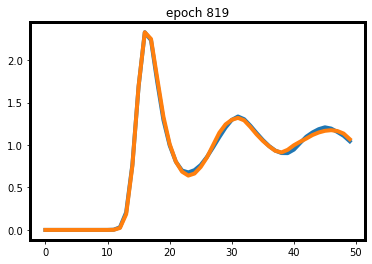

0.012147009372711182
1.913433 seconds


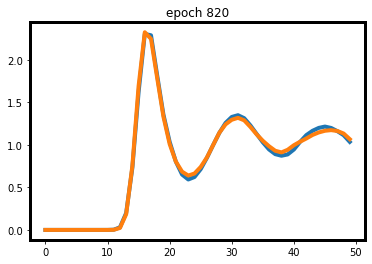

0.01970180869102478
1.906666 seconds


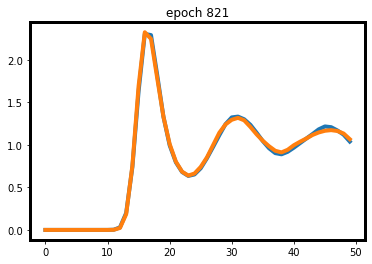

0.009754486382007599
1.83156 seconds


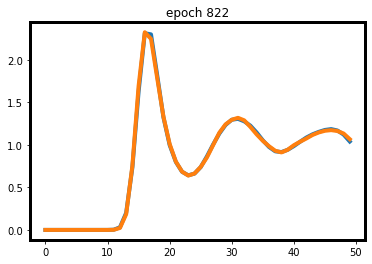

0.0050355736166238785
1.829221 seconds


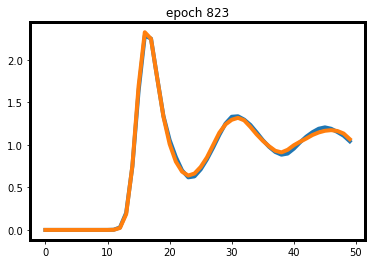

0.014174357056617737
1.779377 seconds


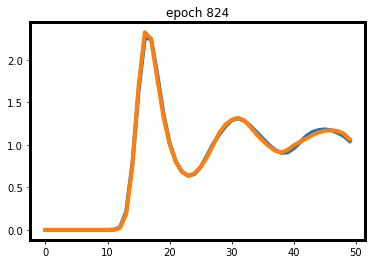

0.00981050729751587
1.844729 seconds


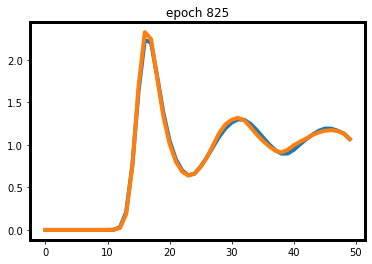

0.016707107424736023
1.989362 seconds


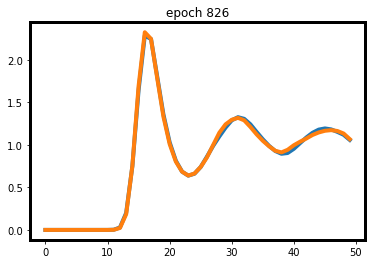

0.008476600050926208
1.896839 seconds


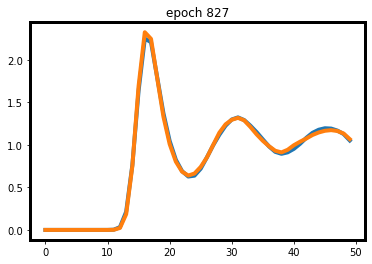

0.011056676506996155
1.855662 seconds


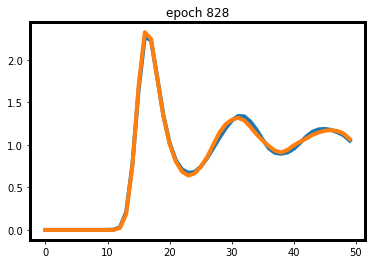

0.01662103831768036
2.035012 seconds


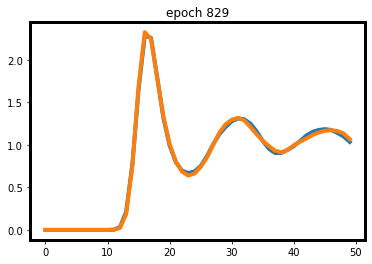

0.009678959846496582
1.94847 seconds


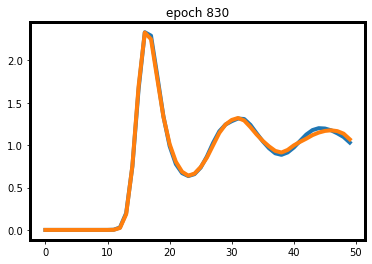

0.011921025812625885
1.881879 seconds


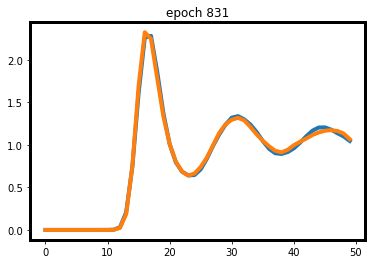

0.016960252076387405
1.856648 seconds


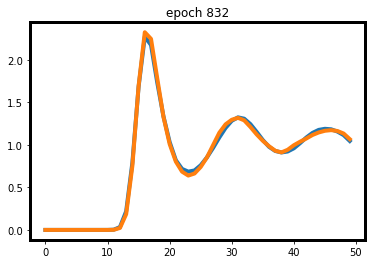

0.015100866556167603
1.900351 seconds


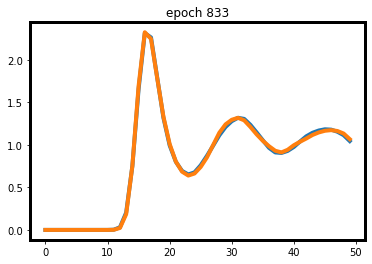

0.005720213055610657
1.920225 seconds


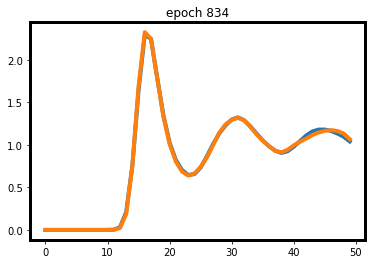

0.006286270916461945
1.988755 seconds


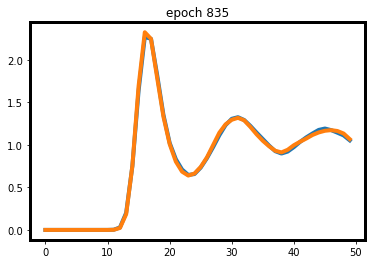

0.007441287860274315
1.933809 seconds


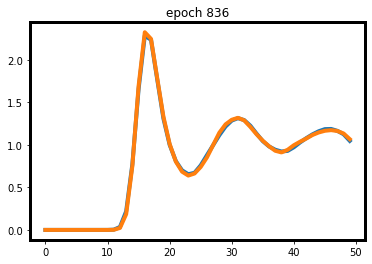

0.005648434162139893
1.856567 seconds


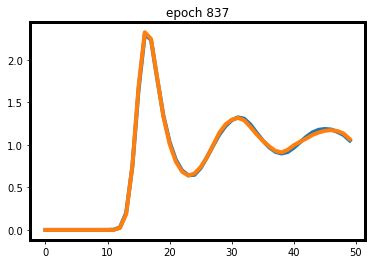

0.005708716809749603
1.83779 seconds


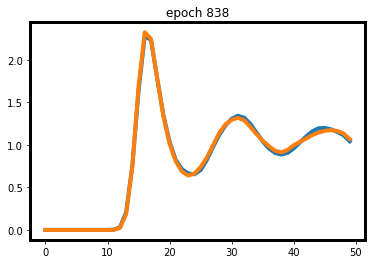

0.012690961360931396
1.835535 seconds


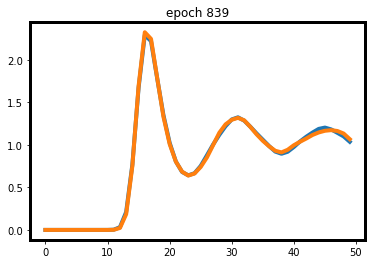

0.006857872009277344
1.868714 seconds


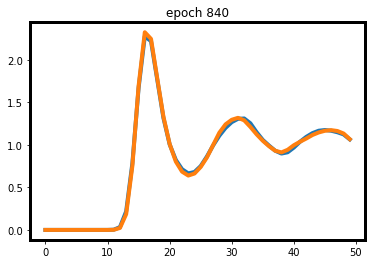

0.00911279022693634
1.856446 seconds


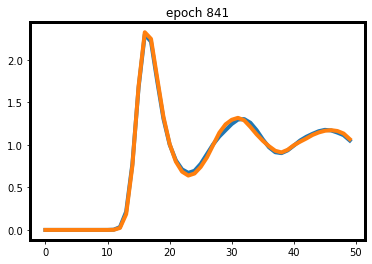

0.013895586133003235
1.967231 seconds


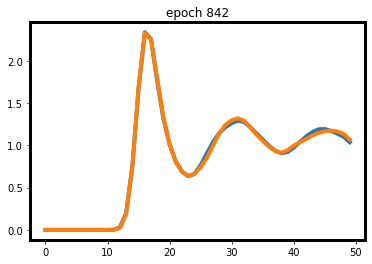

0.009211868047714233
1.894494 seconds


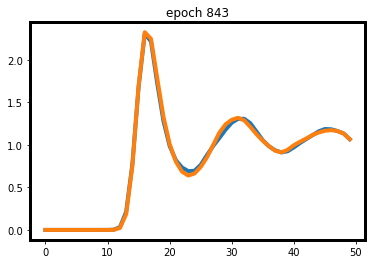

0.015207216143608093
1.915559 seconds


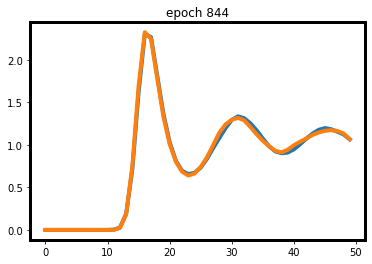

0.014005079865455627
1.934873 seconds


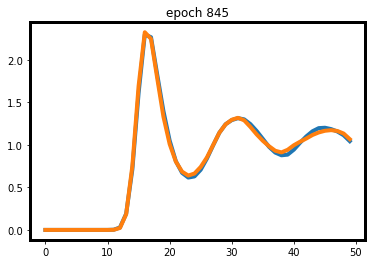

0.018271595239639282
1.869905 seconds


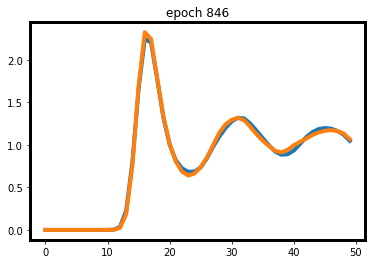

0.01897183060646057
1.925958 seconds


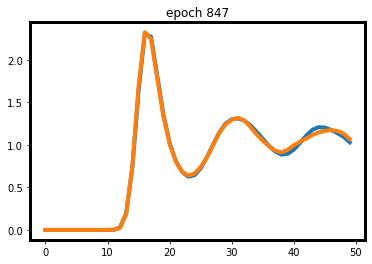

0.013570927083492279
1.862833 seconds


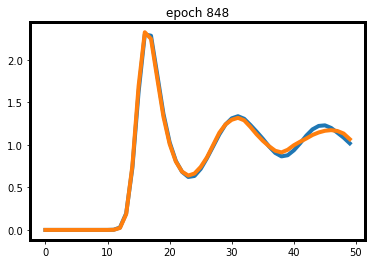

0.022829324007034302
1.800863 seconds


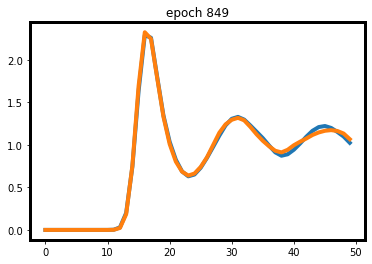

0.01565595716238022
1.904062 seconds


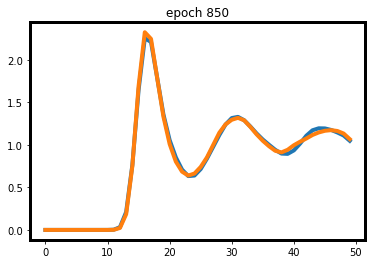

0.01599089428782463
1.874128 seconds


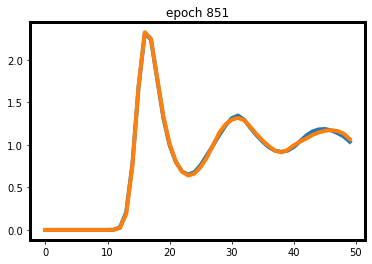

0.006673462688922882
1.943746 seconds


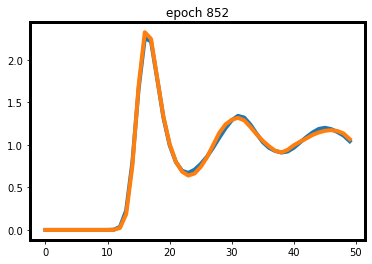

0.015134036540985107
1.928446 seconds


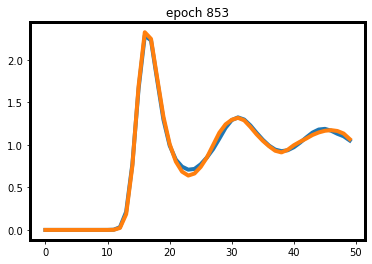

0.017750732600688934
1.927732 seconds


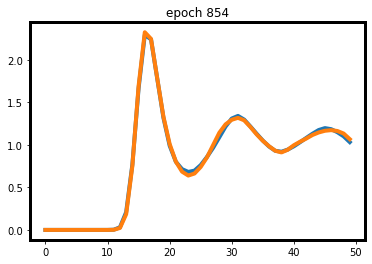

0.009050637483596802
1.856142 seconds


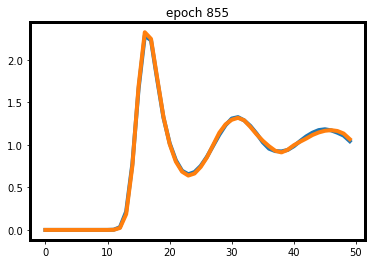

0.006213124841451645
1.841006 seconds


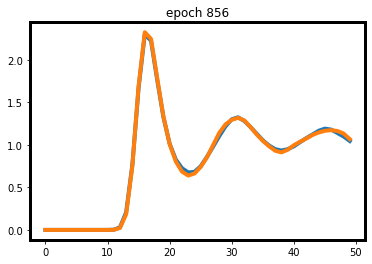

0.00686989352107048
1.918683 seconds


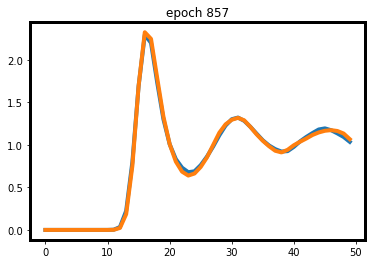

0.01259177178144455
1.844707 seconds


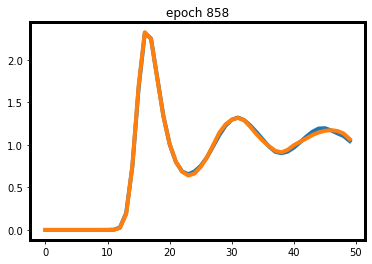

0.006460849195718765
1.85523 seconds


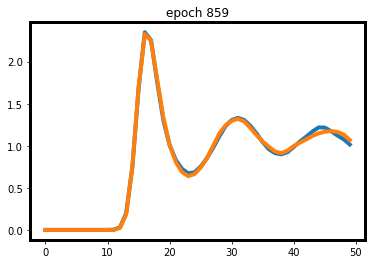

0.01504284143447876
1.779806 seconds


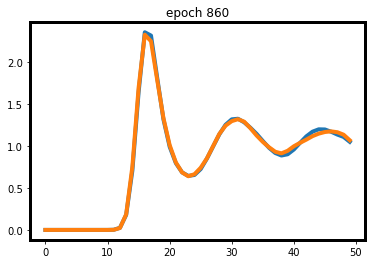

0.0121966153383255
1.915288 seconds


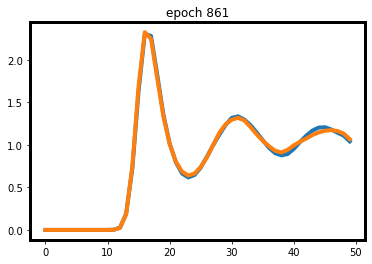

0.013404004275798798
1.932986 seconds


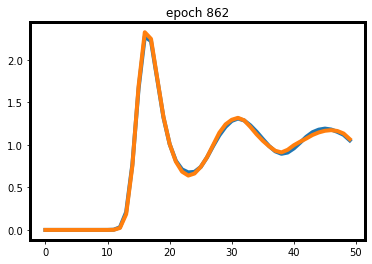

0.008732534945011139
1.817826 seconds


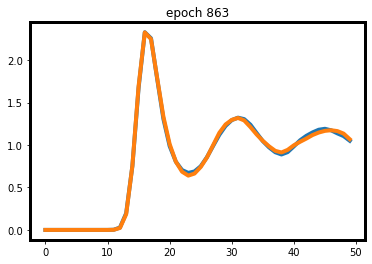

0.00697847455739975
1.810272 seconds


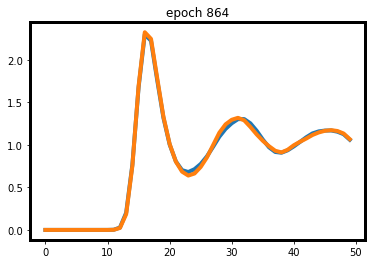

0.010541506111621857
1.874102 seconds


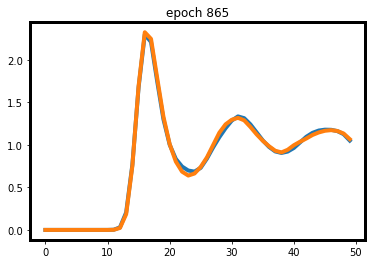

0.013007260859012604
1.82418 seconds


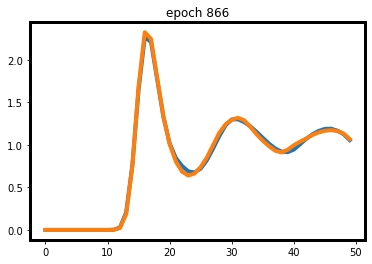

0.015019439160823822
1.88297 seconds


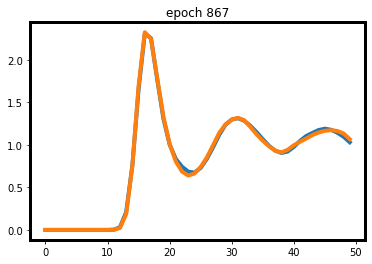

0.010038070380687714
1.906581 seconds


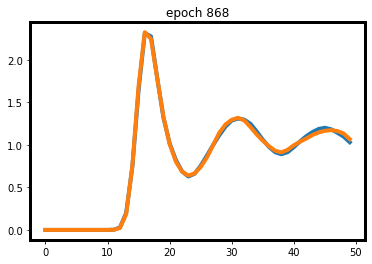

0.008979454636573792
1.893135 seconds


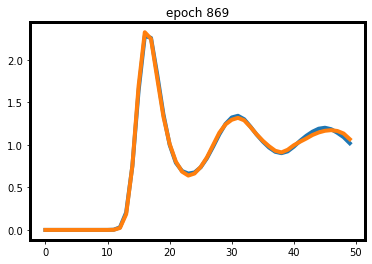

0.010434869676828384
1.808863 seconds


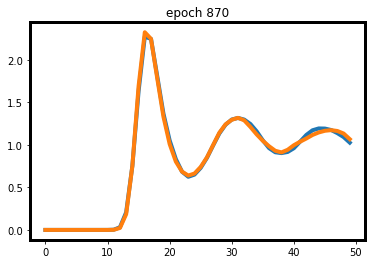

0.01341094821691513
1.920889 seconds


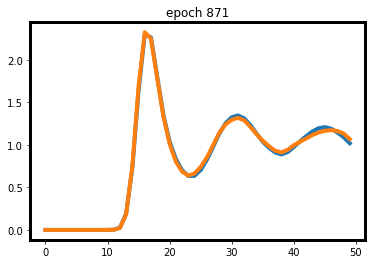

0.012721233069896698
1.820711 seconds


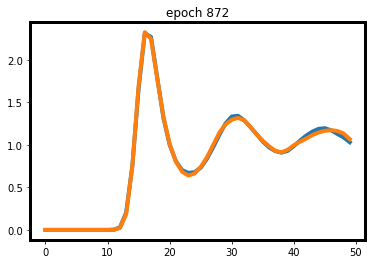

0.00893949344754219
1.870038 seconds


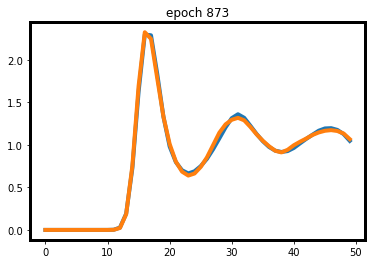

0.01282920315861702
1.823535 seconds


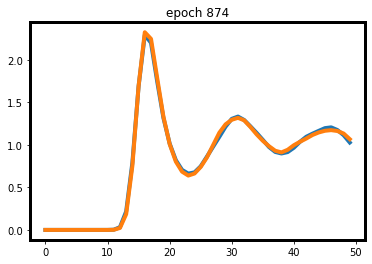

0.009751930832862854
1.886015 seconds


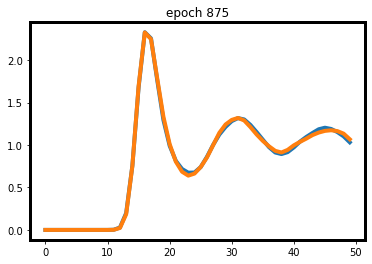

0.008441373705863953
1.749083 seconds


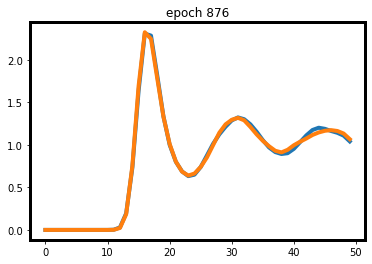

0.01170489750802517
1.86661 seconds


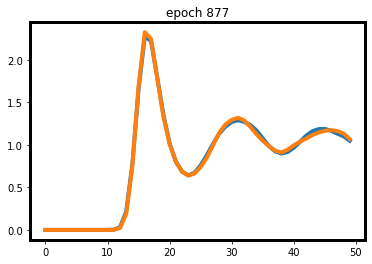

0.010373920202255249
1.867265 seconds


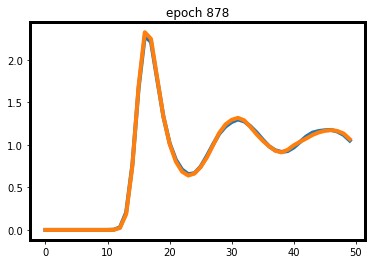

0.00557854026556015
2.203316 seconds


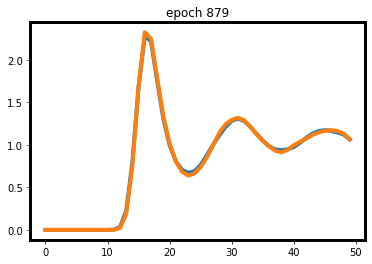

0.007728733122348785
1.971096 seconds


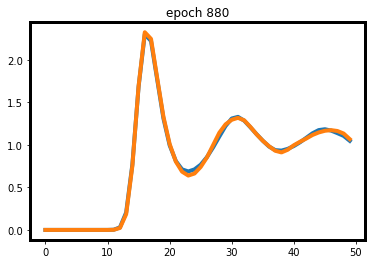

0.008617032319307327
1.871824 seconds


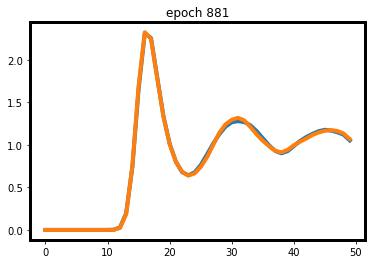

0.0060416944324970245
1.845825 seconds


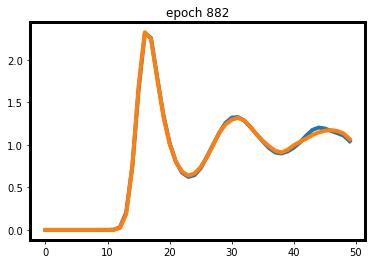

0.008879616856575012
1.804852 seconds


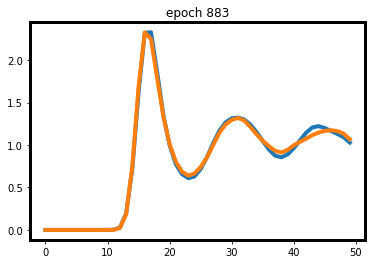

0.028175491839647293
1.926135 seconds


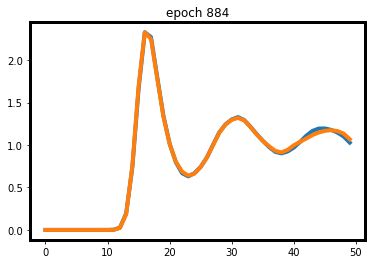

0.0065194107592105865
1.872257 seconds


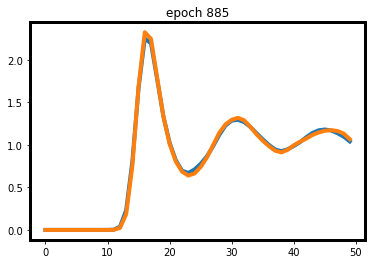

0.01298176497220993
1.842603 seconds


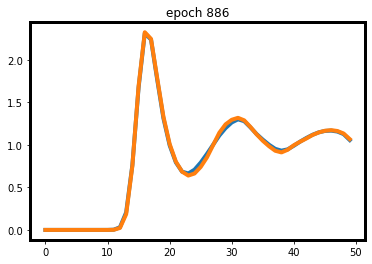

0.00803162157535553
1.866071 seconds


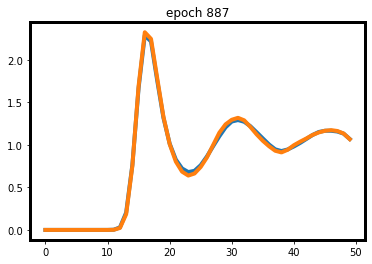

0.008342467248439789
1.876084 seconds


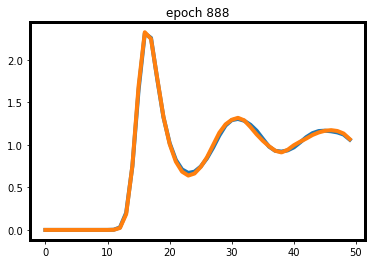

0.006657205522060394
1.855076 seconds


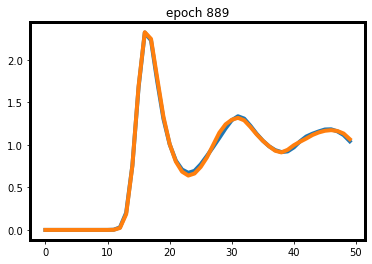

0.008754029870033264
1.882794 seconds


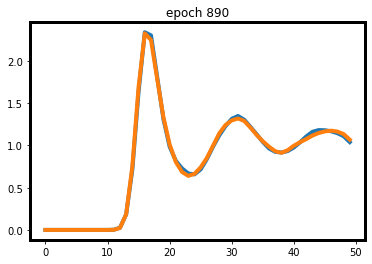

0.010195210576057434
1.870902 seconds


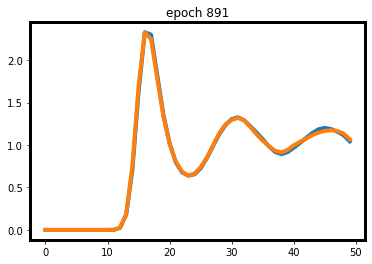

0.009000428020954132
1.869354 seconds


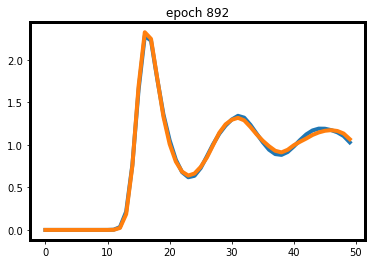

0.013861522078514099
1.901092 seconds


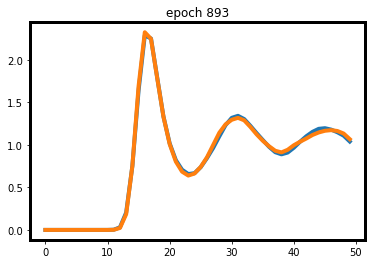

0.009260643273591995
1.884077 seconds


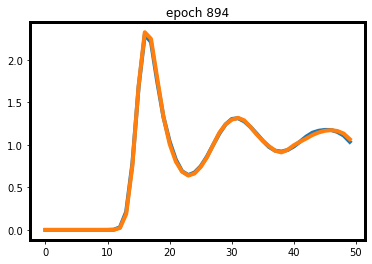

0.0051951780915260315
1.90249 seconds


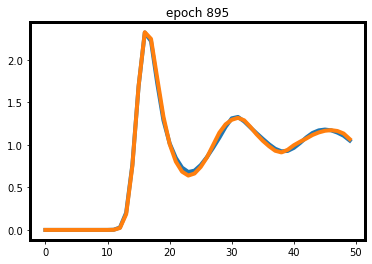

0.012892480939626694
1.795553 seconds


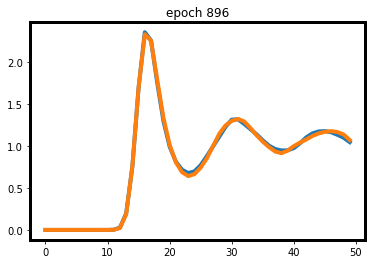

0.009833626449108124
1.90199 seconds


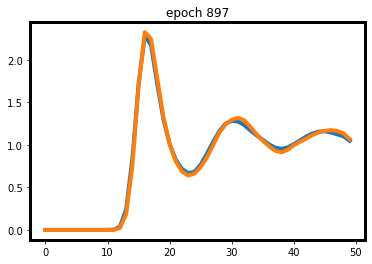

0.022720247507095337
1.890804 seconds


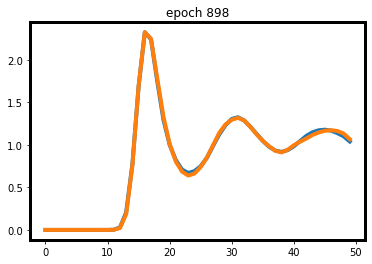

0.006071813404560089
1.936078 seconds


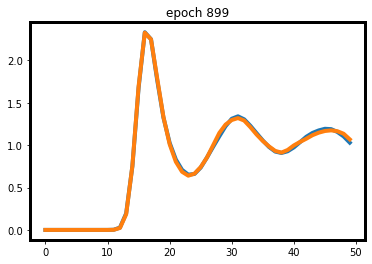

0.006070122122764587
1.888637 seconds


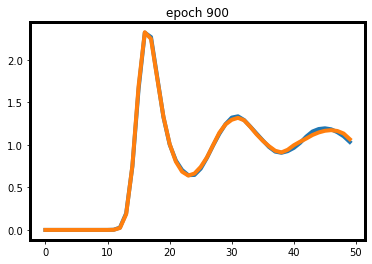

0.006333626806735992
1.865315 seconds


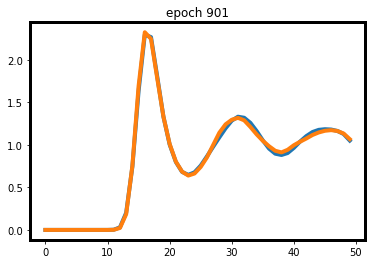

0.011963576078414917
1.842808 seconds


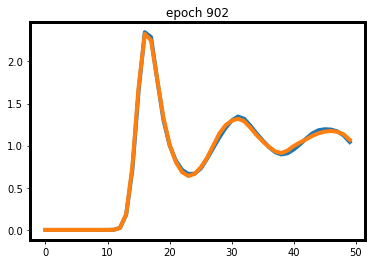

0.010708864778280258
1.9192 seconds


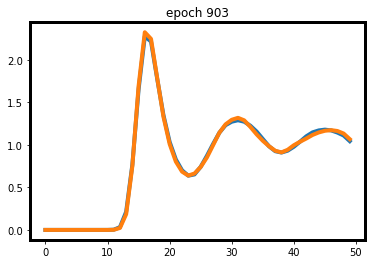

0.0074782595038414
1.868452 seconds


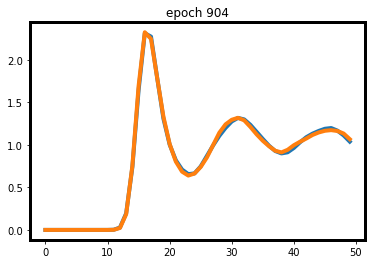

0.007756572216749191
1.908527 seconds


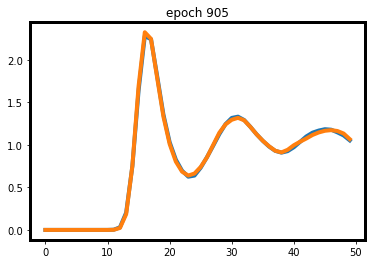

0.005922460928559303
1.868458 seconds


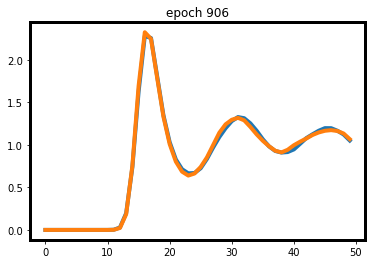

0.012650754302740097
1.900596 seconds


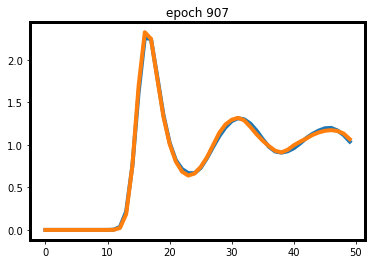

0.012451894581317902
1.958679 seconds


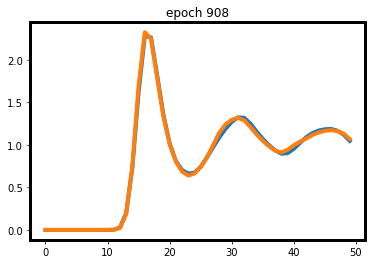

0.012544501572847366
1.897063 seconds


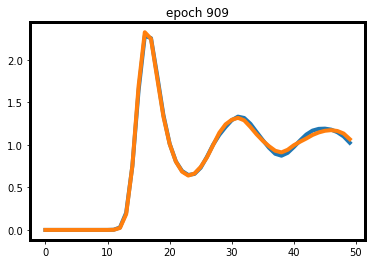

0.012228883802890778
1.799538 seconds


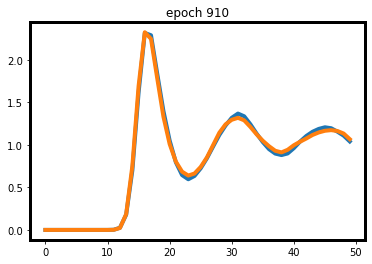

0.021385539323091507
1.856386 seconds


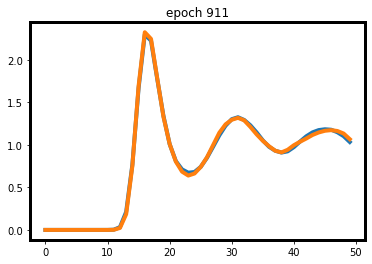

0.006849959492683411
1.850453 seconds


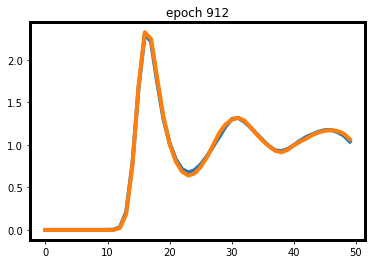

0.008214280009269714
1.853583 seconds


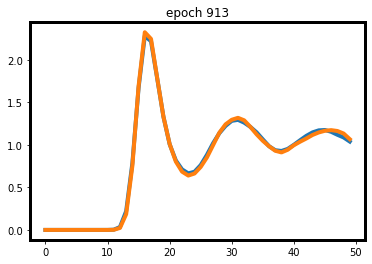

0.010273605585098267
1.811579 seconds


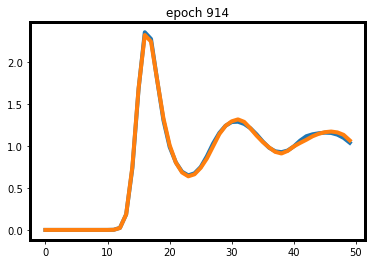

0.006563514471054077
1.869808 seconds


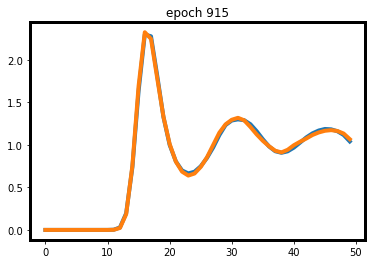

0.007559839636087418
1.79932 seconds


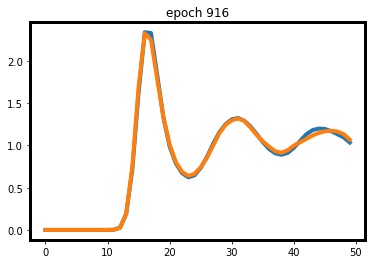

0.015585187822580338
1.999091 seconds


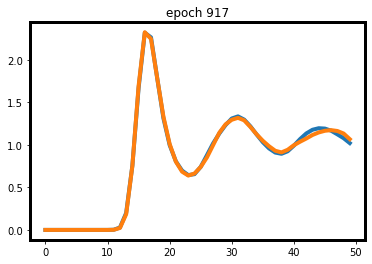

0.011451948434114456
1.891413 seconds


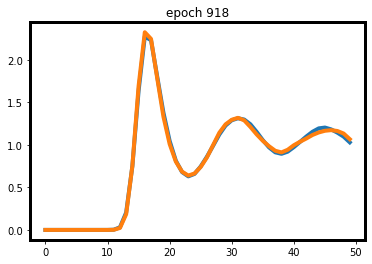

0.010816507041454315
1.944002 seconds


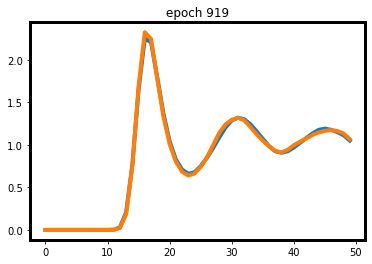

0.011590227484703064
1.886742 seconds


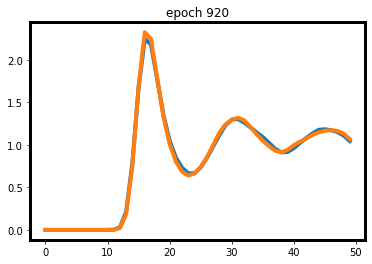

0.014348171651363373
1.850595 seconds


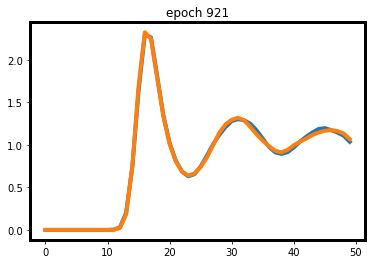

0.009122051298618317
1.841217 seconds


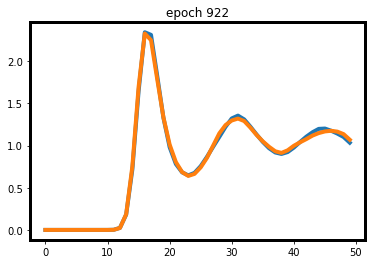

0.011803239583969116
1.844884 seconds


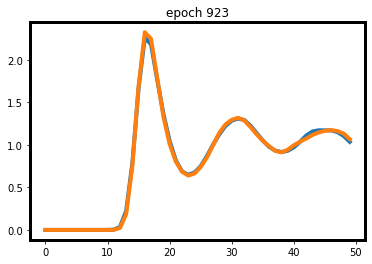

0.010052874684333801
1.827844 seconds


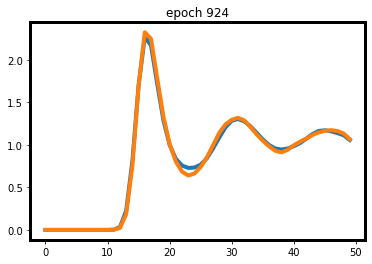

0.025371700525283813
1.870329 seconds


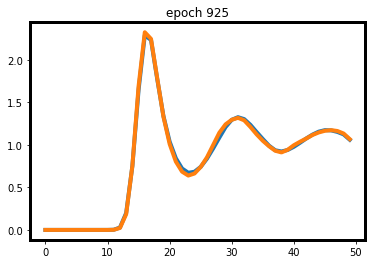

0.008861660957336426
1.793291 seconds


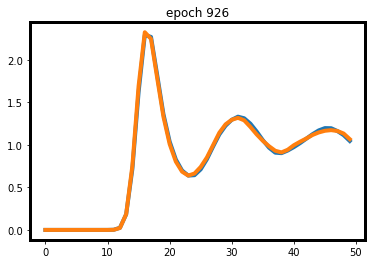

0.010231859982013702
1.985974 seconds


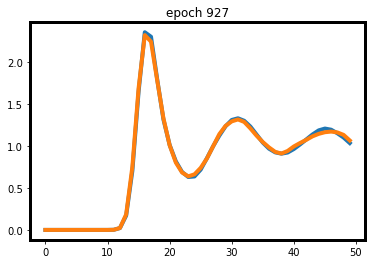

0.009418845176696777
1.929237 seconds


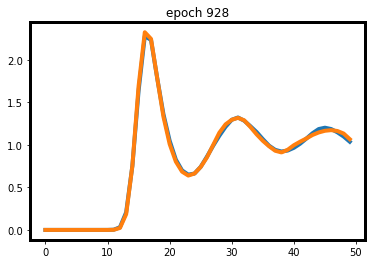

0.009363502264022827
1.885372 seconds


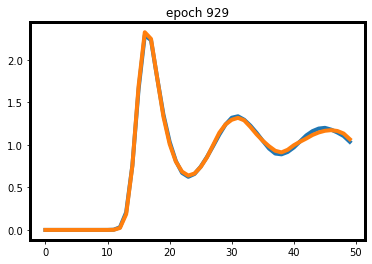

0.009374774992465973
1.961036 seconds


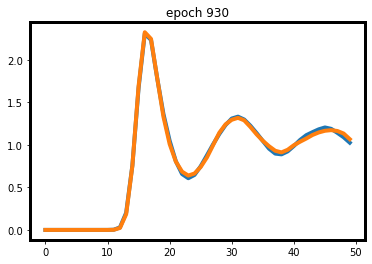

0.010327845811843872
1.848162 seconds


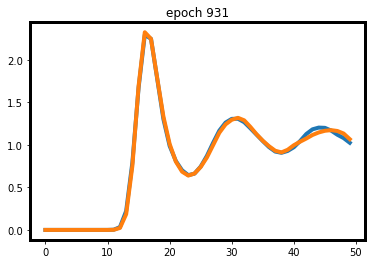

0.0140390545129776
1.878556 seconds


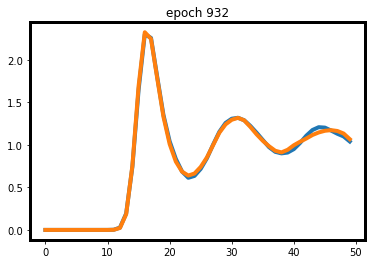

0.012190092355012894
1.851384 seconds


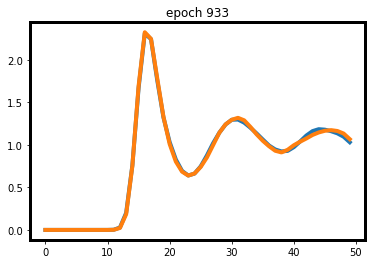

0.007283780723810196
1.88319 seconds


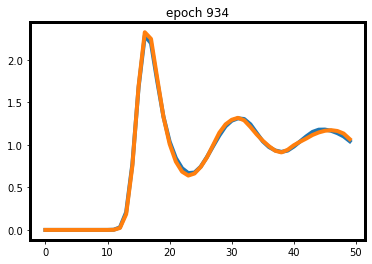

0.010037340223789215
1.871342 seconds


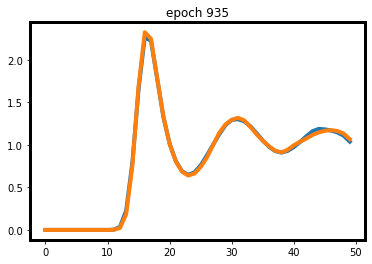

0.008512966334819794
1.974274 seconds


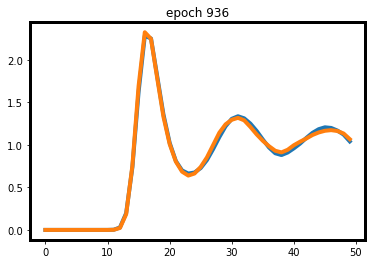

0.014182262122631073
1.925914 seconds


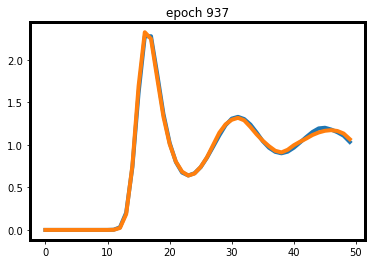

0.011414969339966774
1.765463 seconds


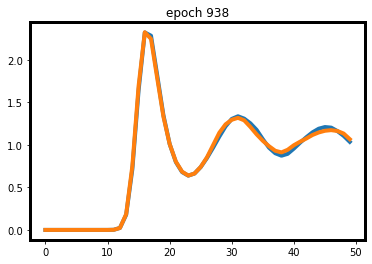

0.014211777597665787
1.781152 seconds


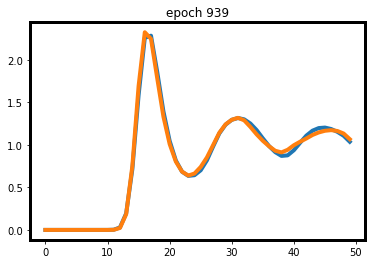

0.02542206645011902
1.887702 seconds


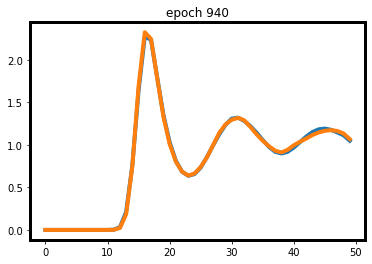

0.006546474993228912
1.848754 seconds


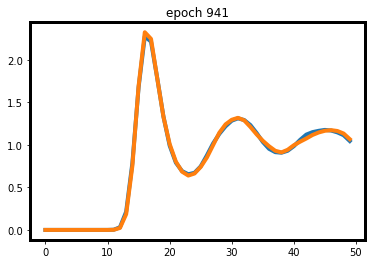

0.007653817534446716
1.862701 seconds


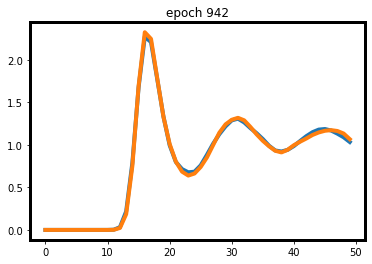

0.010560549795627594
1.85613 seconds


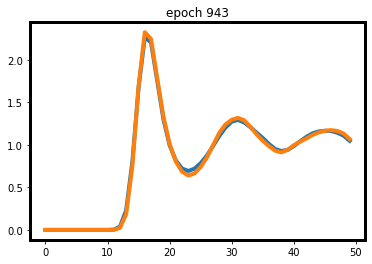

0.016425102949142456
1.904514 seconds


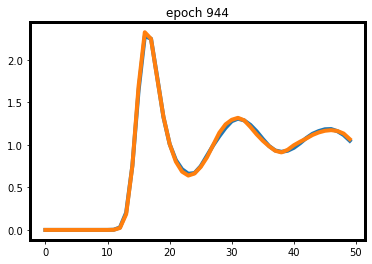

0.007555335760116577
1.872268 seconds


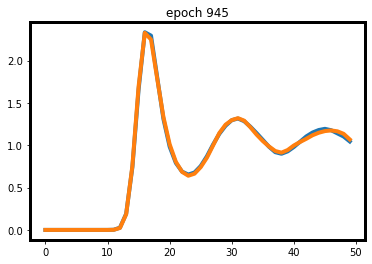

0.006280114874243736
1.863784 seconds


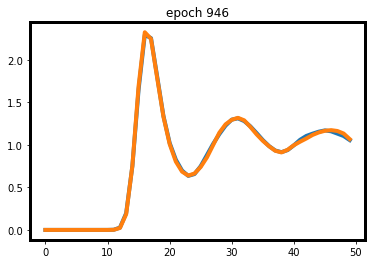

0.004587668925523758
1.771171 seconds


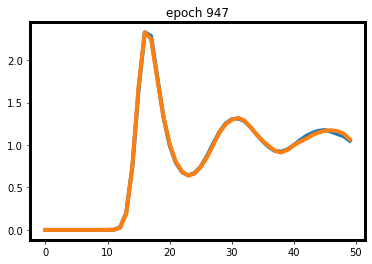

0.0045723505318164825
2.177257 seconds


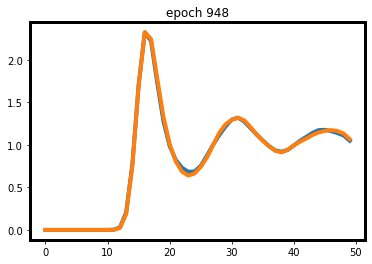

0.00905618816614151
1.94232 seconds


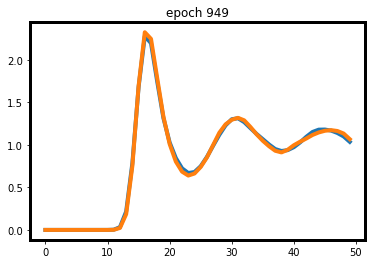

0.01102089136838913
1.940023 seconds


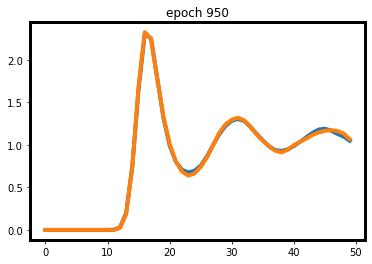

0.006054624915122986
1.943057 seconds


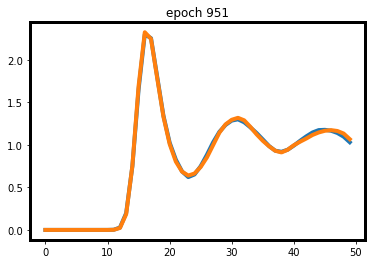

0.006437920033931732
1.873384 seconds


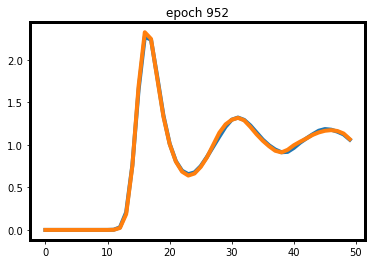

0.006416678428649902
1.841209 seconds


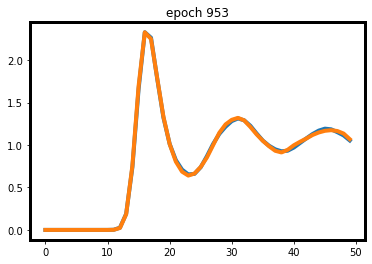

0.004214152693748474
1.902147 seconds


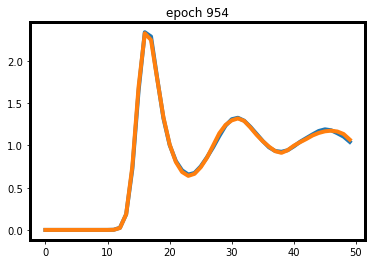

0.0052292924374341965
1.853293 seconds


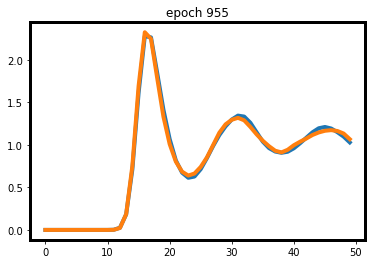

0.02063848078250885
1.953356 seconds


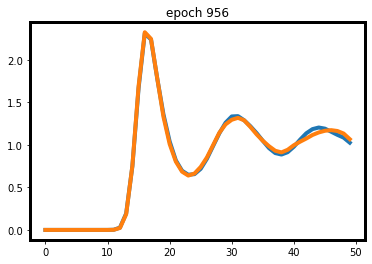

0.013871479779481888
1.930142 seconds


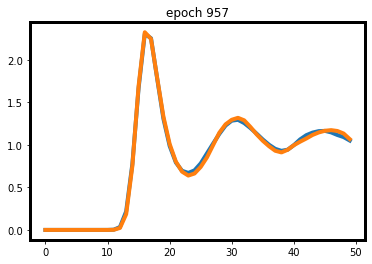

0.011722944676876068
1.87008 seconds


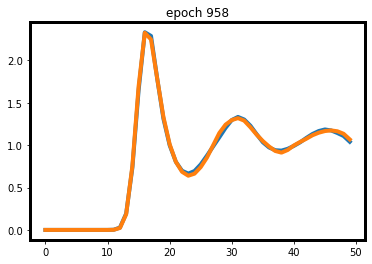

0.008136441931128502
1.929984 seconds


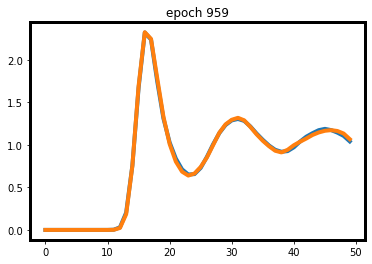

0.005543459206819534
1.84835 seconds


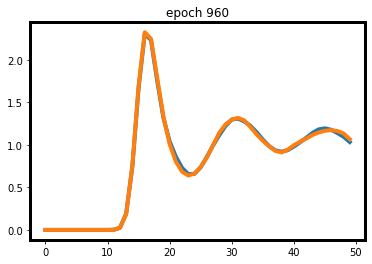

0.008654095232486725
1.864271 seconds


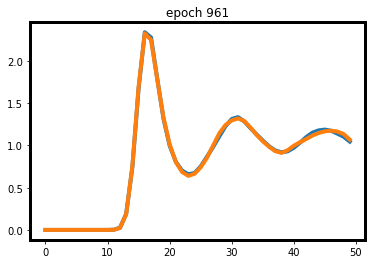

0.005422040820121765
1.847568 seconds


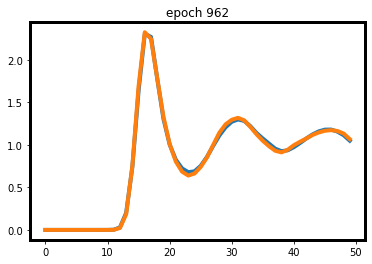

0.008361045271158218
2.009174 seconds


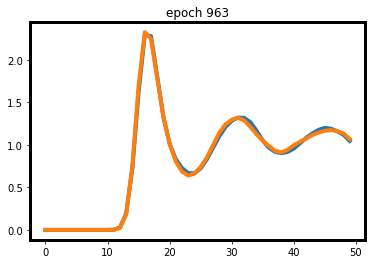

0.013027165085077286
1.871625 seconds


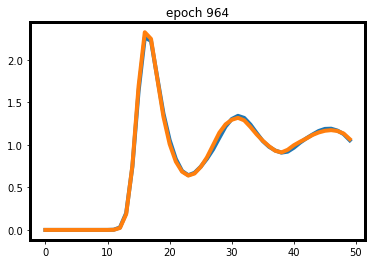

0.011185821145772934
1.996382 seconds


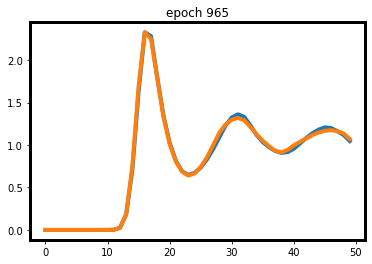

0.012491155415773392
1.87979 seconds


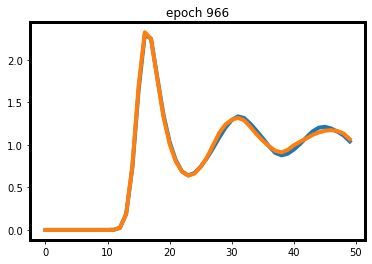

0.014942657202482224
1.852593 seconds


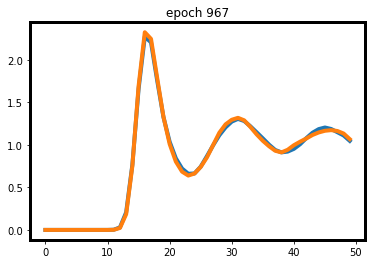

0.011325955390930176
1.848231 seconds


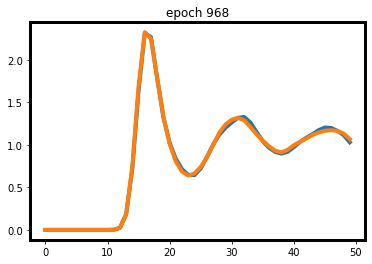

0.010004829615354538
1.85711 seconds


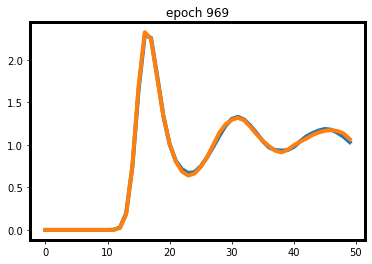

0.0072054751217365265
1.894274 seconds


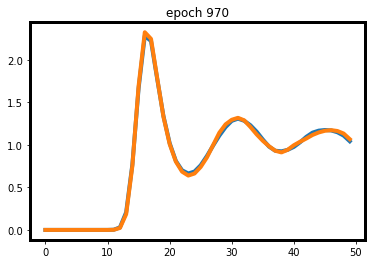

0.00680125504732132
2.07134 seconds


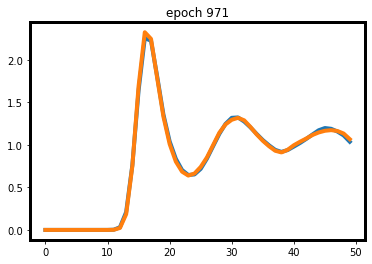

0.008062340319156647
1.800634 seconds


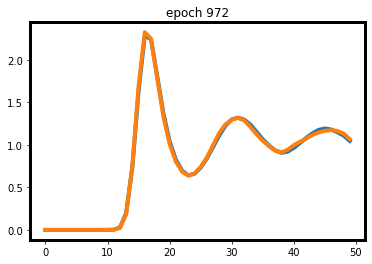

0.007783729583024979
1.881276 seconds


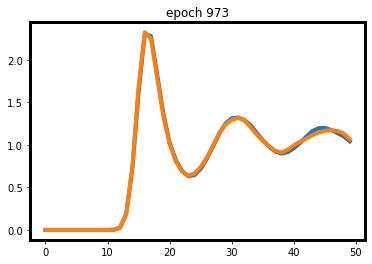

0.011387676000595093
1.859182 seconds


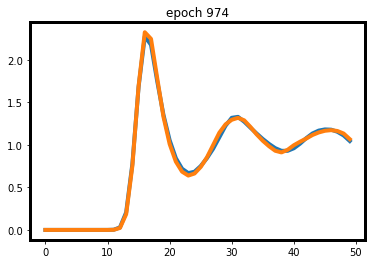

0.013364344835281372
1.862961 seconds


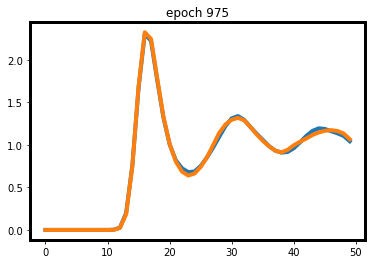

0.010211609303951263
1.865821 seconds


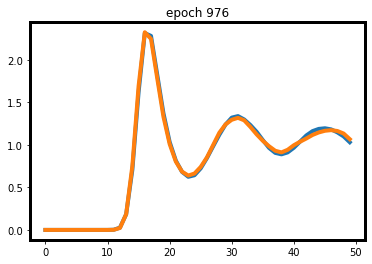

0.013332869857549667
1.86176 seconds


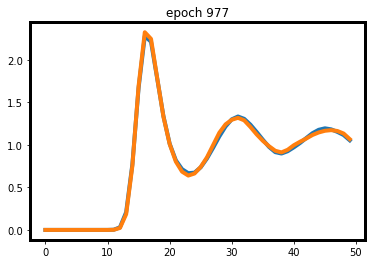

0.008107461035251617
1.788001 seconds


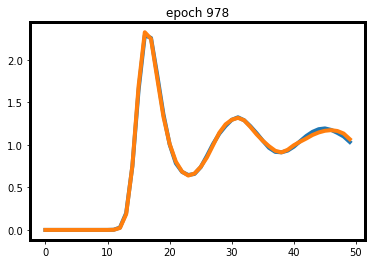

0.007112488150596619
1.882916 seconds


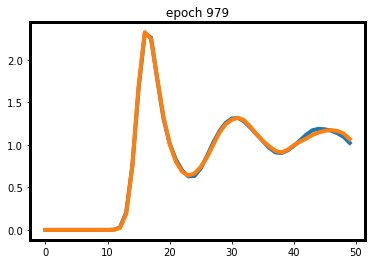

0.009217143058776855
1.894237 seconds


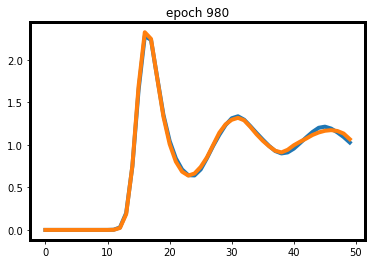

0.011965610086917877
1.987542 seconds


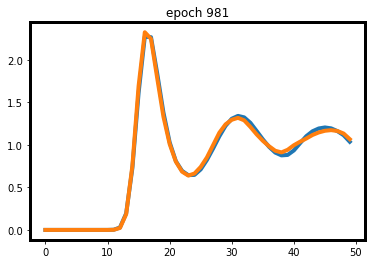

0.020899012684822083
1.809099 seconds


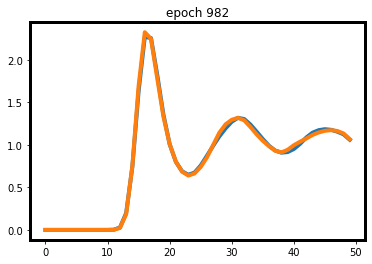

0.009967837482690811
1.829224 seconds


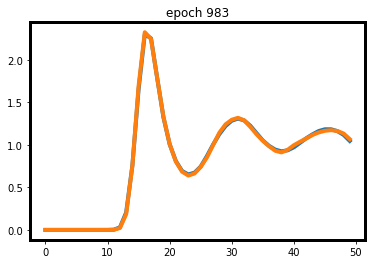

0.003404460847377777
1.877205 seconds


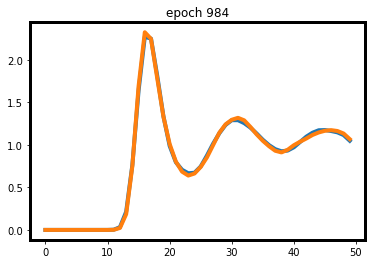

0.007773999124765396
1.876062 seconds


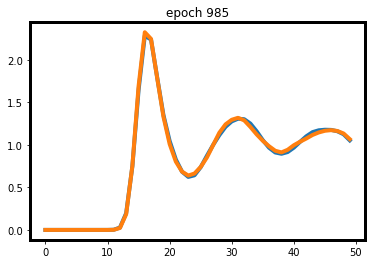

0.008310426026582718
1.819283 seconds


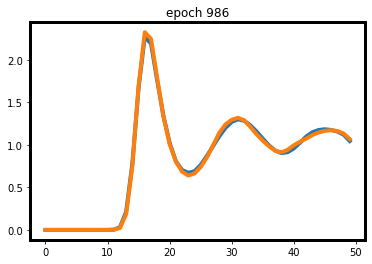

0.011305093765258789
1.899476 seconds


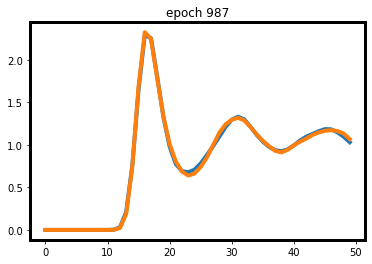

0.010004974901676178
1.930789 seconds


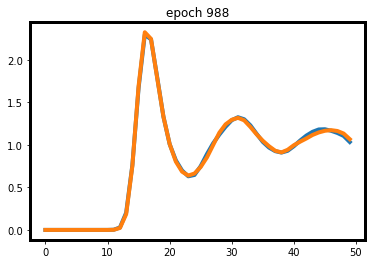

0.006816677749156952
1.849976 seconds


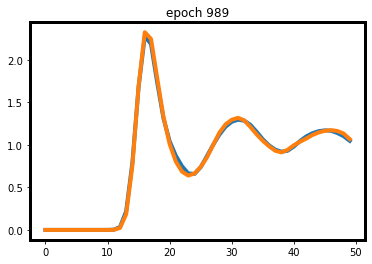

0.01448310911655426
1.957791 seconds


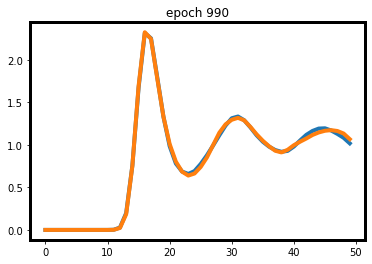

0.010257899761199951
1.771347 seconds


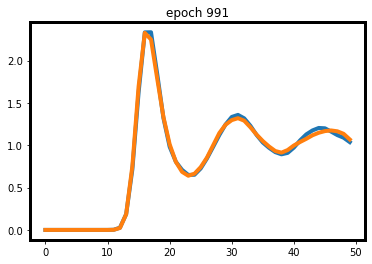

0.018508195877075195
1.943549 seconds


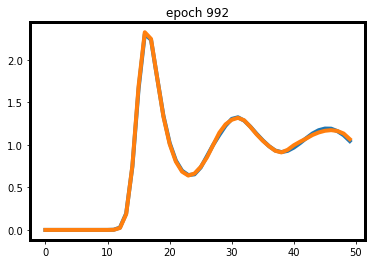

0.0037050414830446243
1.852411 seconds


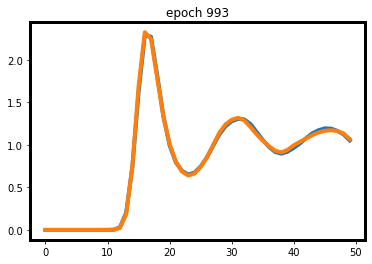

0.00777805969119072
1.862526 seconds


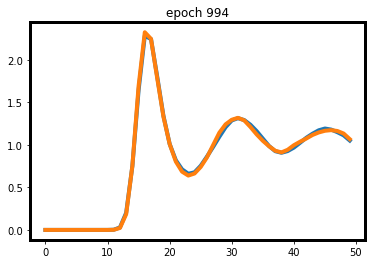

0.008051328361034393
1.778569 seconds


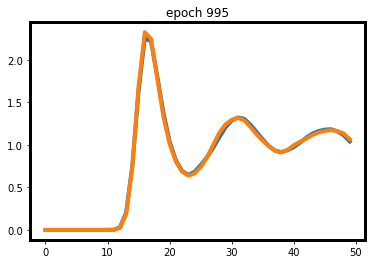

0.01029118150472641
1.874074 seconds


KeyboardInterrupt: 

In [375]:
# define optimizer 
#trainable_params = filter(lambda p: p.requires_grad, f_x.parameters())
#optimizer = torch.optim.SGD(trainable_params, lr=1e-3)
optimizer = torch.optim.SGD(list( f_x.parameters() ), lr=1e-3)

for i in range(10000):
    
    current_time = datetime.now() 
    
    if i == 0:
        xyz = torch.Tensor(atoms.get_positions()).reshape(-1)
        # generate random velocity 
        p = torch.rand(xyz.shape[0]) * 4.0 #.to(DEVICE)
        p_v = torch.Tensor([0.0] * 5)
        
    else:
        xyz = frames[-1].detach().cpu()#.reshape(-1)
        xyz = torch.Tensor( wrap_positions( xyz.numpy(), atoms.get_cell()) ).reshape(-1)
        p = x[-1, :N * 3 ].detach().cpu().reshape(-1)
        p_v = x[-1, N*3*2: ].detach().cpu().reshape(-1)
        
    pq = torch.cat((p, xyz, p_v)).to(DEVICE)
    pq.requires_grad= True
    t = torch.Tensor([0.01 * i for i in range(25)]).to(DEVICE)
    x = odeint(f_x, pq, t, method='rk4')
    
    frames = x[:, N*3: N*3*2].reshape(-1, N, 3)
    bins, g = obs(frames)
    
    plt.title("epoch {}".format(i))
    plt.plot(g.detach().cpu().numpy())
    plt.plot(g_obs.detach().cpu().numpy())
    plt.show()
    
    loss = ( -(g + 1) * (torch.log(g_obs + 1) - torch.log(g + 1)) ).sum()
    loss +=  ( -(g_obs + 1) * (torch.log(g + 1) - torch.log(g_obs + 1)) ).sum()
    
    #loss =  ( torch.log( g_obs + 1e-4) - torch.log( g + 1e-4 ) ).pow(2).mean()
    
#     pmf_obs = -torch.log( g_obs + 1e-4)
#     pmf = -torch.log( g + 1e-4)
#     f_obs = (pmf_obs[1:] - pmf_obs[:-1])
#     f = (pmf[1:] - pmf[:-1])
    
#     loss = (f - f_obs).pow(2).mean() + 0.1 * (pmf_obs - pmf).pow(2).mean() + \
            
    
    print(loss.item())
    loss.sum().backward()
    
    #scheduler.step(loss.item())
    
    dt = (datetime.now() - current_time)
    print( "{} seconds".format(dt.total_seconds())) 
    
    optimizer.step()
    optimizer.zero_grad()

In [29]:
( -torch.log(g + 1) * (torch.log(g_obs + 1) - torch.log(g + 1)) ).shape

torch.Size([50])

In [387]:
f_x.model.models['prior'].model.epsilon

Parameter containing:
tensor([0.5569], device='cuda:1', requires_grad=True)

In [380]:
xyz.reshape(-1, 3).detach().cpu().numpy()


array([[1.8152250e-01, 6.5217600e+00, 2.7555521e+00],
       [5.0158525e+00, 1.6701611e+00, 5.6120563e+00],
       [8.4189260e-01, 5.0753245e+00, 5.6400442e+00],
       [5.3093576e+00, 6.6322584e+00, 6.4325619e+00],
       [1.1111320e-02, 3.3954763e+00, 3.5990963e+00],
       [5.9031978e+00, 6.2514362e+00, 5.4092045e+00],
       [6.6189580e+00, 3.4960873e+00, 1.3262627e+00],
       [3.8062816e+00, 5.7513719e+00, 5.2442956e+00],
       [1.3544277e+00, 3.2615006e+00, 1.9923811e+00],
       [1.7048668e+00, 4.3508854e+00, 3.0635326e+00],
       [2.8774166e+00, 6.0176282e+00, 4.4976997e+00],
       [4.3640208e+00, 3.6966605e+00, 2.5828463e-01],
       [5.5275102e+00, 6.2198868e+00, 4.3843970e+00],
       [8.5884827e-01, 4.7491250e+00, 1.1424927e+00],
       [5.4830995e+00, 2.5969806e+00, 1.6835507e+00],
       [5.7376437e+00, 7.1178412e-01, 1.4563336e+00],
       [6.2656159e+00, 6.2104416e+00, 6.3366618e+00],
       [2.7788656e+00, 5.2992740e+00, 2.7022045e+00],
       [2.6274809e-01, 1.213

In [27]:
atoms.get_cell()

array([[6.7189154, 0.       , 0.       ],
       [0.       , 6.7189154, 0.       ],
       [0.       , 0.       , 6.7189154]])

In [135]:
# compute Gauss Newton

grad = torch.cat((f_x.model.model.epsilon.grad, f_x.model.model.sigma.grad) )

In [139]:
grad.pinverse()

RuntimeError: pinverse(torch.cuda.FloatTensor{[2]}): expected a 2D tensor of floating types

In [136]:
grad.pinverse().matmul(r.squeeze()).reshape(-1)

RuntimeError: pinverse(torch.cuda.FloatTensor{[2]}): expected a 2D tensor of floating types

In [70]:
x[:, 256 * 3:]

tensor([[ 94.2371, 119.0085,  33.2100,  ...,  -0.5788,  -2.2579,  -1.4053],
        [ 94.2422, 119.0152,  33.2106,  ...,   0.1600,  -2.4153,  -1.3431],
        [ 94.2472, 119.0220,  33.2112,  ...,   0.9217,  -2.5672,  -1.2613],
        ...,
        [ 95.7763, 121.0754,  33.3883,  ...,  -1.9348,  -0.7357,  -0.7456],
        [ 95.7813, 121.0822,  33.3889,  ...,  -1.9797,  -0.7296,  -0.8093],
        [ 95.7864, 121.0890,  33.3895,  ...,  -2.0124,  -0.7206,  -0.8733]],
       device='cuda:0', grad_fn=<SliceBackward>)

In [160]:
( -torch.log(g + 1) * (torch.log(g_obs + 1) - torch.log(g + 1)) )

tensor(1.8112, device='cuda:0', grad_fn=<SumBackward0>)

In [170]:
loss

tensor([ 3.3629e-07,  1.0395e-06,  2.8937e-06,  2.1657e-06,  5.4059e-07,
         1.2133e-06,  6.7806e-06,  2.2852e-05,  3.5409e-04,  1.0448e-02,
         1.0664e-01,  3.5643e-01,  5.7786e-01,  6.0649e-01,  4.2190e-01,
         1.3560e-01, -9.0525e-02, -1.9719e-01, -2.0856e-01, -1.6644e-01,
        -9.7511e-02, -3.6412e-02, -6.3544e-03,  1.5653e-02,  3.6728e-02,
         4.8083e-02,  5.0982e-02,  4.5669e-02,  3.3346e-02,  1.9402e-02,
         1.9126e-03, -1.6249e-02, -2.9827e-02, -3.2129e-02, -2.1704e-02,
        -2.2441e-03,  1.2482e-02,  9.7474e-03,  3.5172e-03,  6.4300e-04,
         5.1129e-04,  5.0747e-03,  6.6604e-03,  1.0884e-03, -5.1656e-03,
        -7.0634e-03, -3.2943e-03, -3.7743e-03, -1.0479e-02, -1.3473e-02],
       device='cuda:0', grad_fn=<MulBackward0>)

In [92]:
# update positions every time 

# use KL divergence 

frames[-1]

torch.Size([80, 256, 3])

In [73]:
x.shape

torch.Size([300, 1541])